<a href="https://colab.research.google.com/github/boxty123/ComputerVision/blob/main/CV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#A

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# FashionMNIST 데이터 전처리
transform = transforms.ToTensor()
train_dataset = datasets.FashionMNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.FashionMNIST(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1000, shuffle=False)

input_size = 28*28
num_classes = 10

# 모델 정의
def get_model():
    return nn.Sequential(
        nn.Flatten(),
        nn.Linear(input_size, 256),
        nn.ReLU(), #ReLU 활성함수 사용
        nn.Linear(256, 128),
        nn.ReLU(),
        nn.Linear(128, num_classes)
    )


100%|██████████| 26.4M/26.4M [00:02<00:00, 12.7MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 203kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 3.74MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 14.7MB/s]


In [ ]:
activation_values = {}
gradients = {}

#특정 레이어의 활성값을 저장하는 forward hook 반환
def save_activation(name):
    def hook(model, input, output):
        activation_values[name] = output.detach()
    return hook

#특정 레이어의 기울기를 저장하는 backward hook 반환
def save_gradient(name):
    def hook(module, grad_input, grad_output):
        gradients[name] = grad_output[0].detach()
    return hook

#모델의 특정 ReLU 레이어에 forward 및 backward hook을 등록
def register_hooks(model):
    model[2].register_forward_hook(save_activation("relu1"))
    model[5].register_forward_hook(save_activation("relu2"))

    model[2].register_full_backward_hook(save_gradient("relu1"))  # use full version
    model[5].register_full_backward_hook(save_gradient("relu2"))


In [ ]:
#ReLU 활성값 텐서를 이용해 Dead Nueron 비율의 히트맵 시각화
def plot_dead_relu_heatmap(activation_tensor, title):
    is_dead = activation_tensor == 0
    dead_ratio = is_dead.float().mean(dim=0)  # 뉴런별 dead 비율

    plt.figure(figsize=(12, 1))
    sns.heatmap(dead_ratio.unsqueeze(0), cmap="Reds", cbar=True)
    plt.title(title)
    plt.xlabel("Neuron Index")
    plt.yticks([])
    plt.show()

#기울기 텐서를 이용해 뉴런별 평균 기울기 크기의 히트맵 시각화
def plot_gradient_heatmap(gradient_tensor, title): #기울기 히트맵
    mean_grad = gradient_tensor.abs().mean(dim=0)  # 뉴런별 평균 gradient 크기
    plt.figure(figsize=(12, 1))
    sns.heatmap(mean_grad.unsqueeze(0), cmap="Blues", cbar=True)
    plt.title(title)
    plt.xlabel("Neuron Index")
    plt.yticks([])
    plt.show()

# 활성값 텐서에 대한 히스토그램 분포
def plot_activation_distributions_side_by_side(tensor1, tensor2, title_prefix, epoch):
    flat1 = tensor1.view(-1).cpu().numpy()
    flat2 = tensor2.view(-1).cpu().numpy()

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].hist(flat1, bins=50, alpha=0.7, color='skyblue')
    axes[0].set_title(f"{title_prefix} ReLU1 - Epoch {epoch}")
    axes[0].set_xlabel("Activation value")
    axes[0].set_ylabel("Frequency")
    axes[0].grid(True)

    axes[1].hist(flat2, bins=50, alpha=0.7, color='salmon')
    axes[1].set_title(f"{title_prefix} ReLU2 - Epoch {epoch}")
    axes[1].set_xlabel("Activation value")
    axes[1].set_ylabel("Frequency")
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()




In [ ]:
#학습 코드
def train(model, loss_fn, optimizer, use_softmax=False):
    model.train()
    register_hooks(model)
    train_loss, train_acc = [], []

    for epoch in range(40):
        correct, total, running_loss = 0, 0, 0
        for images, labels in train_loader:
            outputs = model(images)
            if use_softmax:
                outputs = torch.softmax(outputs, dim=1)
                labels_onehot = nn.functional.one_hot(labels, num_classes=num_classes).float()
                loss = loss_fn(outputs, labels_onehot)
                pred = outputs.argmax(dim=1)
            else:
                loss = loss_fn(outputs, labels)
                pred = outputs.argmax(dim=1)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            total += labels.size(0)
            correct += (pred == labels).sum().item()

        acc = correct / total
        train_loss.append(running_loss / len(train_loader))
        train_acc.append(acc)

        print(f"Epoch {epoch+1:02d} | Loss: {train_loss[-1]:.4f} | Acc: {train_acc[-1]*100:.2f}%")

        if epoch in [0, 20, 39]:  # 초반, 중반, 후반 시점
            print(f"\n[Epoch {epoch+1}] --- Activation & Gradient 시각화 ---")

            # 활성값 히트맵
            plot_dead_relu_heatmap(activation_values["relu1"], f"ReLU1 Dead Neurons - Epoch {epoch+1}")
            plot_dead_relu_heatmap(activation_values["relu2"], f"ReLU2 Dead Neurons - Epoch {epoch+1}")

            # 활성 분포
            plot_activation_distributions_side_by_side(
            activation_values["relu1"],
            activation_values["relu2"],
            title_prefix="Activation Distribution",
            epoch=epoch+1
            )

            # Gradient 흐름
            plot_gradient_heatmap(gradients["relu1"], f"ReLU1 Gradient - Epoch {epoch+1}")
            plot_gradient_heatmap(gradients["relu2"], f"ReLU2 Gradient - Epoch {epoch+1}")


    return train_loss, train_acc

Epoch 01 | Loss: 1.3636 | Acc: 55.25%

[Epoch 1] --- Activation & Gradient 시각화 ---


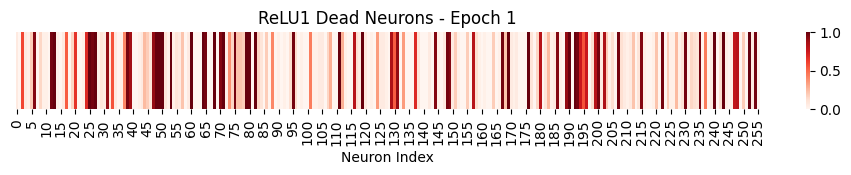

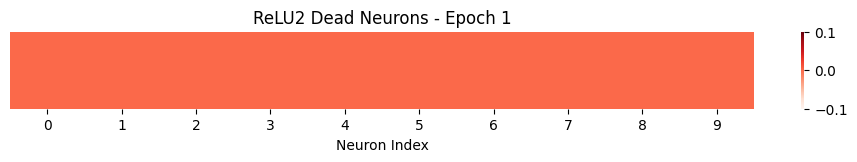

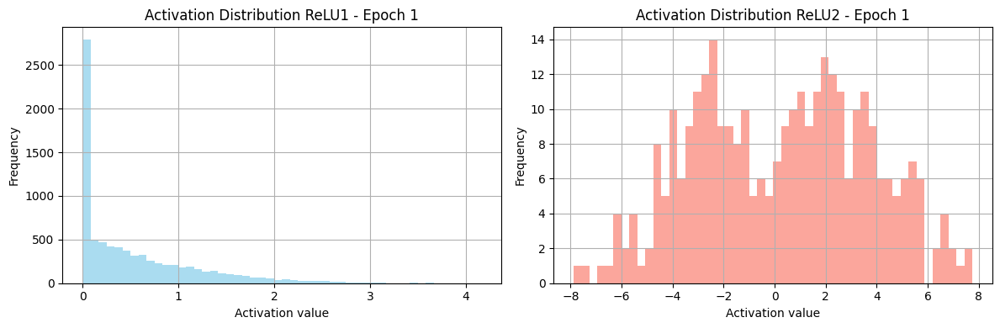

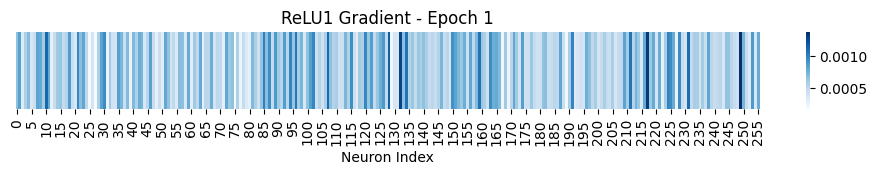

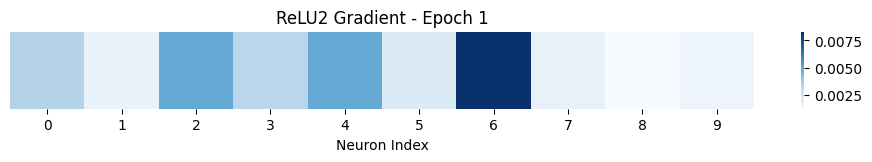

Epoch 02 | Loss: 0.7074 | Acc: 74.59%
Epoch 03 | Loss: 0.5863 | Acc: 79.75%
Epoch 04 | Loss: 0.5276 | Acc: 81.75%
Epoch 05 | Loss: 0.4944 | Acc: 82.64%
Epoch 06 | Loss: 0.4739 | Acc: 83.44%
Epoch 07 | Loss: 0.4581 | Acc: 83.92%
Epoch 08 | Loss: 0.4464 | Acc: 84.34%
Epoch 09 | Loss: 0.4353 | Acc: 84.74%
Epoch 10 | Loss: 0.4259 | Acc: 85.11%
Epoch 11 | Loss: 0.4170 | Acc: 85.29%
Epoch 12 | Loss: 0.4095 | Acc: 85.72%
Epoch 13 | Loss: 0.4029 | Acc: 85.90%
Epoch 14 | Loss: 0.3952 | Acc: 86.21%
Epoch 15 | Loss: 0.3885 | Acc: 86.41%
Epoch 16 | Loss: 0.3825 | Acc: 86.57%
Epoch 17 | Loss: 0.3767 | Acc: 86.88%
Epoch 18 | Loss: 0.3713 | Acc: 87.06%
Epoch 19 | Loss: 0.3661 | Acc: 87.28%
Epoch 20 | Loss: 0.3609 | Acc: 87.34%
Epoch 21 | Loss: 0.3568 | Acc: 87.46%

[Epoch 21] --- Activation & Gradient 시각화 ---


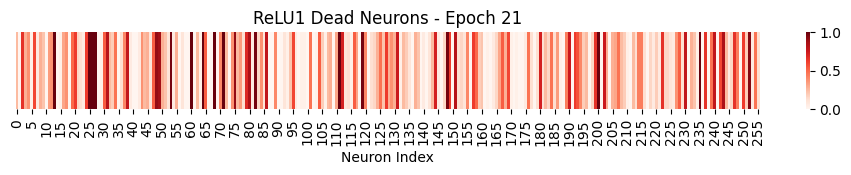

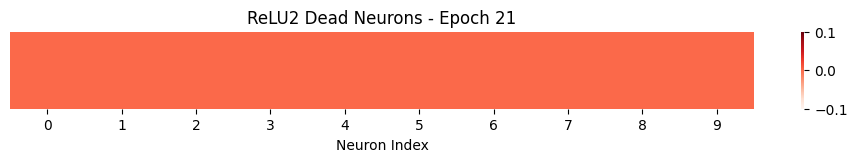

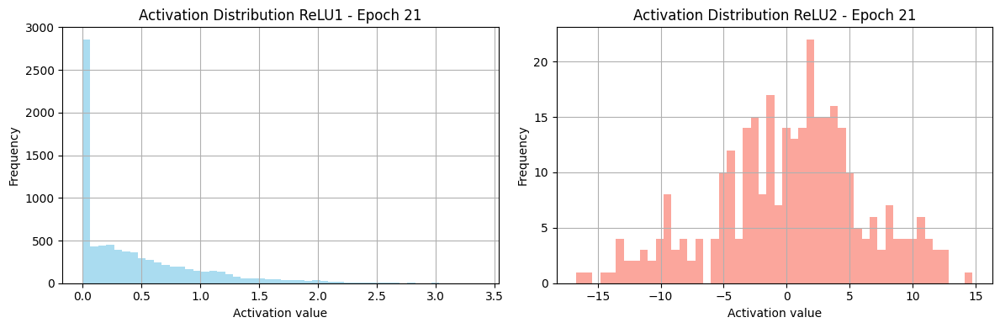

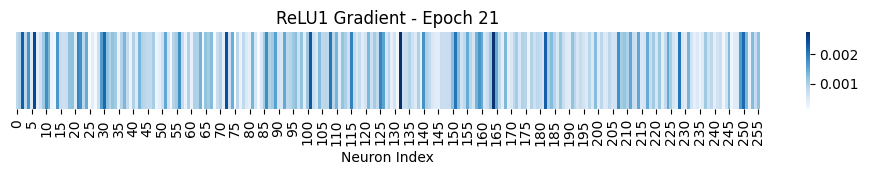

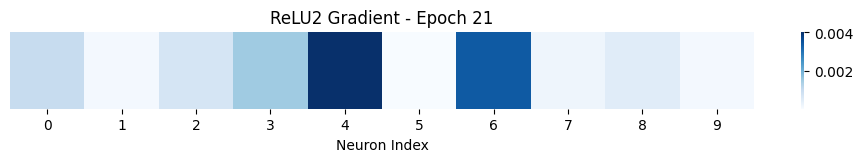

Epoch 22 | Loss: 0.3511 | Acc: 87.63%
Epoch 23 | Loss: 0.3468 | Acc: 87.81%
Epoch 24 | Loss: 0.3427 | Acc: 87.90%
Epoch 25 | Loss: 0.3385 | Acc: 88.03%
Epoch 26 | Loss: 0.3344 | Acc: 88.14%
Epoch 27 | Loss: 0.3303 | Acc: 88.19%
Epoch 28 | Loss: 0.3267 | Acc: 88.39%
Epoch 29 | Loss: 0.3226 | Acc: 88.64%
Epoch 30 | Loss: 0.3202 | Acc: 88.61%
Epoch 31 | Loss: 0.3163 | Acc: 88.79%
Epoch 32 | Loss: 0.3125 | Acc: 88.80%
Epoch 33 | Loss: 0.3087 | Acc: 89.04%
Epoch 34 | Loss: 0.3063 | Acc: 89.08%
Epoch 35 | Loss: 0.3041 | Acc: 89.24%
Epoch 36 | Loss: 0.2994 | Acc: 89.31%
Epoch 37 | Loss: 0.2962 | Acc: 89.47%
Epoch 38 | Loss: 0.2939 | Acc: 89.53%
Epoch 39 | Loss: 0.2902 | Acc: 89.65%
Epoch 40 | Loss: 0.2868 | Acc: 89.93%

[Epoch 40] --- Activation & Gradient 시각화 ---


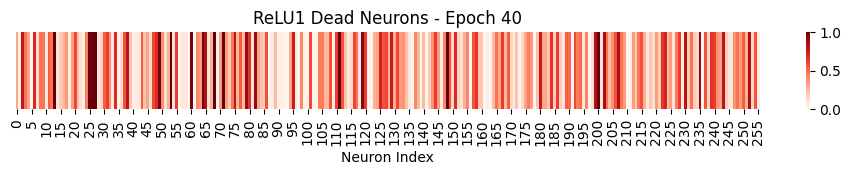

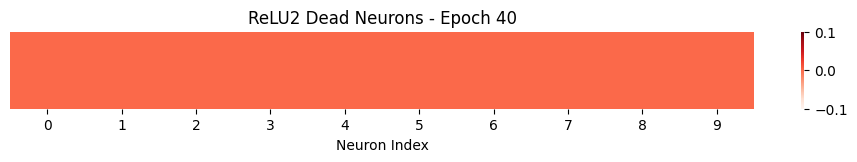

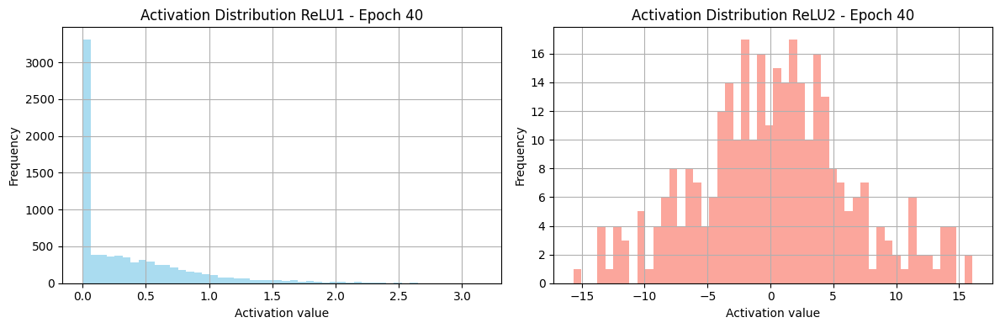

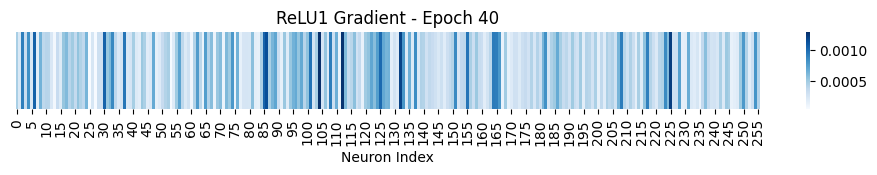

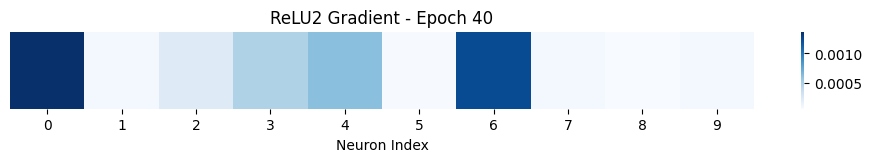

Epoch 01 | Loss: 0.0898 | Acc: 14.40%

[Epoch 1] --- Activation & Gradient 시각화 ---


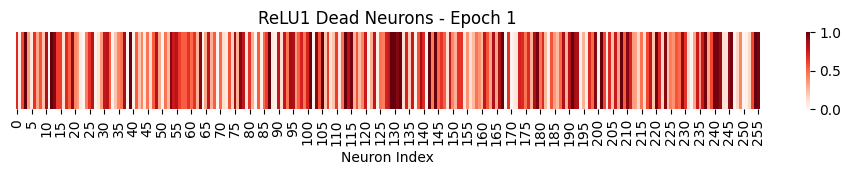

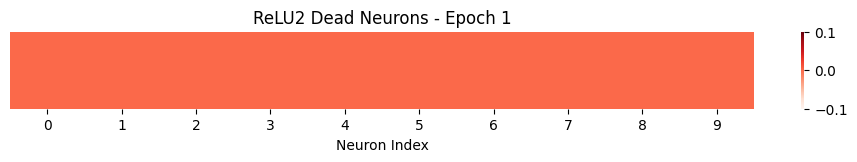

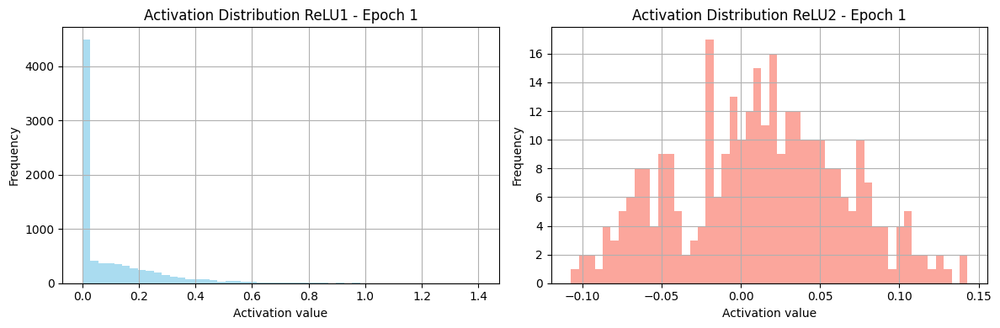

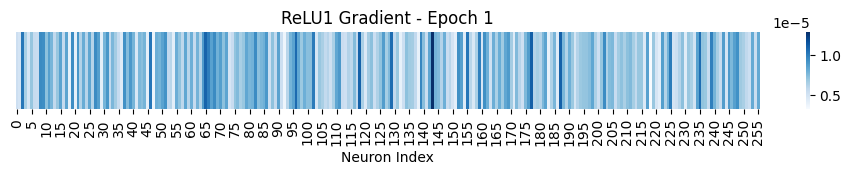

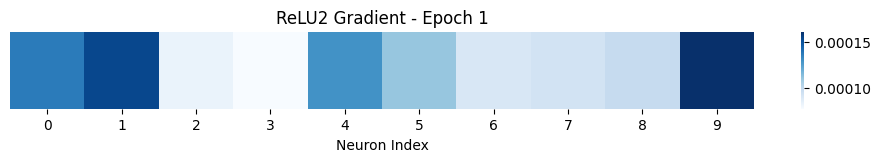

Epoch 02 | Loss: 0.0895 | Acc: 21.70%
Epoch 03 | Loss: 0.0891 | Acc: 27.14%
Epoch 04 | Loss: 0.0887 | Acc: 32.20%
Epoch 05 | Loss: 0.0882 | Acc: 37.64%
Epoch 06 | Loss: 0.0877 | Acc: 43.40%
Epoch 07 | Loss: 0.0871 | Acc: 47.33%
Epoch 08 | Loss: 0.0863 | Acc: 49.99%
Epoch 09 | Loss: 0.0854 | Acc: 51.53%
Epoch 10 | Loss: 0.0842 | Acc: 52.80%
Epoch 11 | Loss: 0.0826 | Acc: 52.47%
Epoch 12 | Loss: 0.0802 | Acc: 48.64%
Epoch 13 | Loss: 0.0771 | Acc: 45.64%
Epoch 14 | Loss: 0.0734 | Acc: 47.57%
Epoch 15 | Loss: 0.0697 | Acc: 51.78%
Epoch 16 | Loss: 0.0659 | Acc: 55.91%
Epoch 17 | Loss: 0.0622 | Acc: 60.45%
Epoch 18 | Loss: 0.0586 | Acc: 63.75%
Epoch 19 | Loss: 0.0554 | Acc: 65.30%
Epoch 20 | Loss: 0.0526 | Acc: 65.97%
Epoch 21 | Loss: 0.0502 | Acc: 66.41%

[Epoch 21] --- Activation & Gradient 시각화 ---


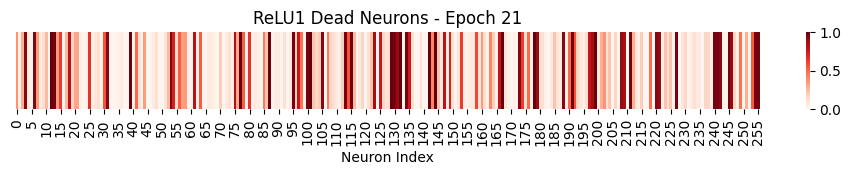

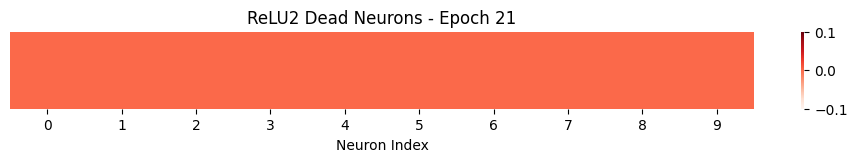

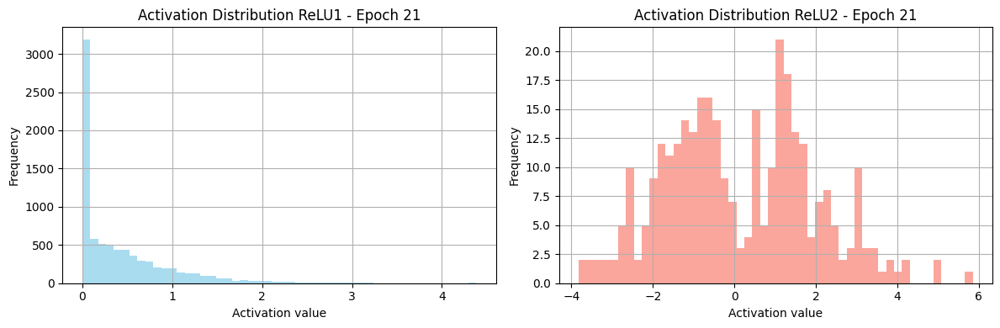

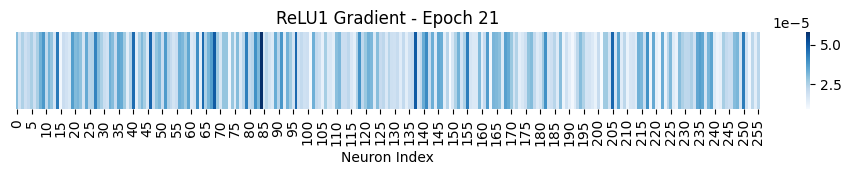

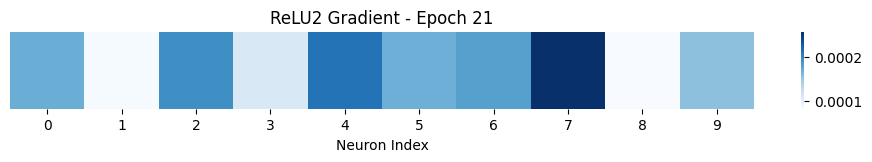

Epoch 22 | Loss: 0.0483 | Acc: 66.58%
Epoch 23 | Loss: 0.0467 | Acc: 66.82%
Epoch 24 | Loss: 0.0453 | Acc: 67.02%
Epoch 25 | Loss: 0.0442 | Acc: 67.34%
Epoch 26 | Loss: 0.0432 | Acc: 67.76%
Epoch 27 | Loss: 0.0423 | Acc: 68.49%
Epoch 28 | Loss: 0.0415 | Acc: 69.14%
Epoch 29 | Loss: 0.0409 | Acc: 69.91%
Epoch 30 | Loss: 0.0402 | Acc: 70.80%
Epoch 31 | Loss: 0.0396 | Acc: 71.53%
Epoch 32 | Loss: 0.0390 | Acc: 72.32%
Epoch 33 | Loss: 0.0385 | Acc: 72.94%
Epoch 34 | Loss: 0.0379 | Acc: 73.56%
Epoch 35 | Loss: 0.0374 | Acc: 74.19%
Epoch 36 | Loss: 0.0369 | Acc: 74.73%
Epoch 37 | Loss: 0.0364 | Acc: 75.18%
Epoch 38 | Loss: 0.0360 | Acc: 75.62%
Epoch 39 | Loss: 0.0355 | Acc: 76.06%
Epoch 40 | Loss: 0.0350 | Acc: 76.53%

[Epoch 40] --- Activation & Gradient 시각화 ---


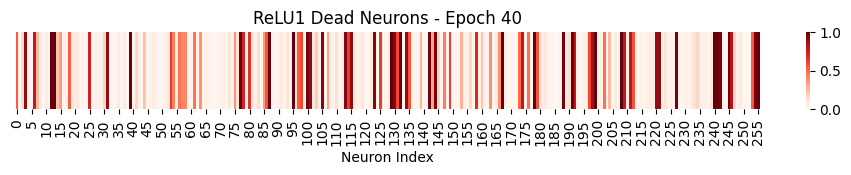

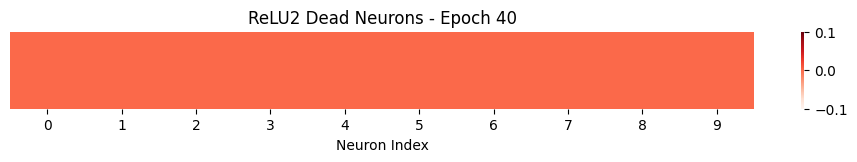

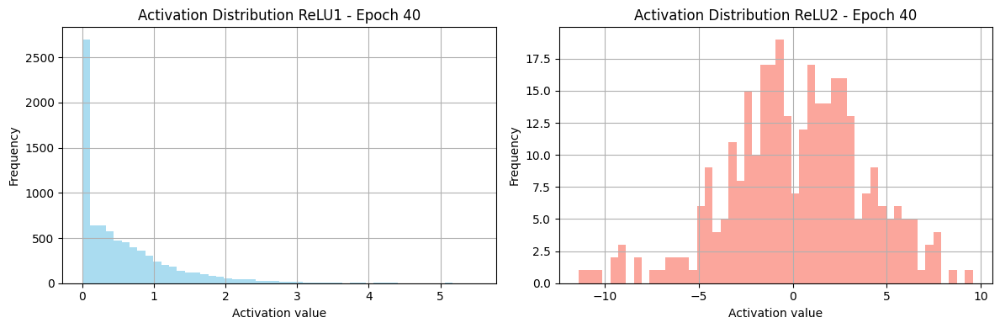

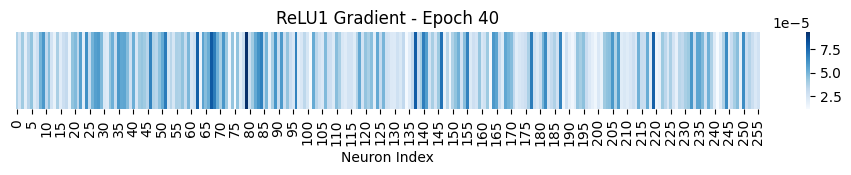

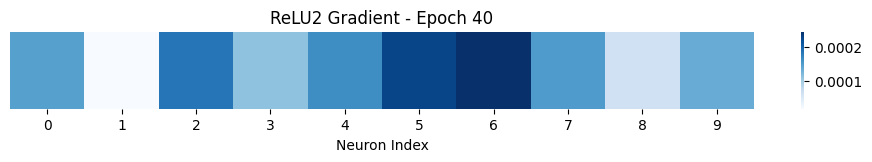

In [ ]:
# CrossEntropy
model_ce = get_model()
optimizer_ce = optim.SGD(model_ce.parameters(), lr=0.01)
loss_ce_fn = nn.CrossEntropyLoss()
loss_ce, acc_ce = train(model_ce, loss_ce_fn, optimizer_ce)

# MSE + Softmax
model_mse = get_model()
optimizer_mse = optim.SGD(model_mse.parameters(), lr=0.01)
loss_mse_fn = nn.MSELoss()
loss_mse, acc_mse = train(model_mse, loss_mse_fn, optimizer_mse, use_softmax=True)


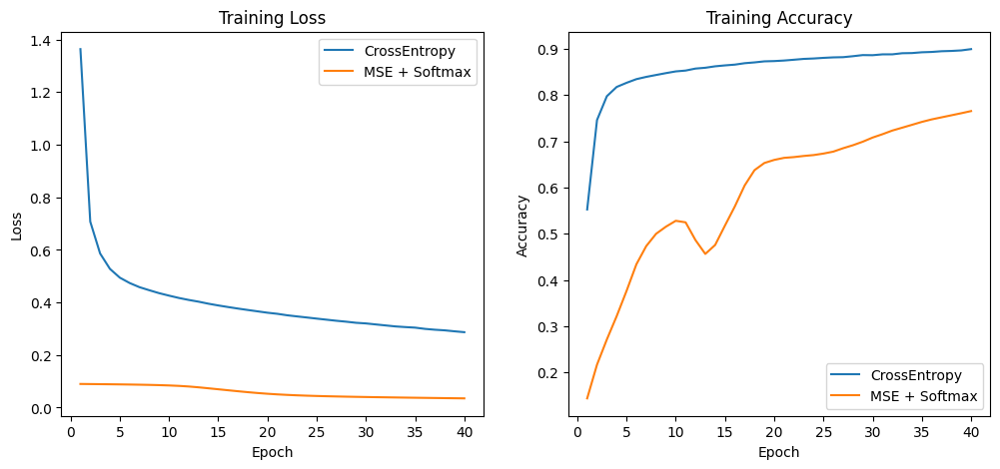

In [ ]:
#loss와 정확도 곡선화
def plot_loss_acc(loss_list, acc_list, labels):
    epochs = range(1, 41)
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    for loss, label in zip(loss_list, labels):
        plt.plot(epochs, loss, label=label)
    plt.title("Training Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    for acc, label in zip(acc_list, labels):
        plt.plot(epochs, acc, label=label)
    plt.title("Training Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.show()

plot_loss_acc([loss_ce, loss_mse], [acc_ce, acc_mse], ["CrossEntropy", "MSE + Softmax"])


#B

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.datasets import make_moons, make_circles
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# toy 데이터셋 생성
def get_toy_dataset(name="moons", noise=0.2, n_samples=1000):
    if name == "moons":
        X, y = make_moons(n_samples=n_samples, noise=noise)
    else:
        X, y = make_circles(n_samples=n_samples, noise=noise, factor=0.5)

    X = StandardScaler().fit_transform(X)
    return torch.tensor(X, dtype=torch.float32), torch.tensor(y, dtype=torch.long)


In [ ]:
#모델 정의
def get_toy_model(act_fn):
    model = nn.Sequential(
        nn.Linear(2, 32),
        act_fn,
        nn.Linear(32, 32),
        act_fn,
        nn.Linear(32, 2)
    )
    # 초기화: std=0.01
    for layer in model:
        if isinstance(layer, nn.Linear):
            nn.init.normal_(layer.weight, mean=0.0, std=0.01)
            nn.init.constant_(layer.bias, 0)
    return model


In [ ]:
activation_values = {}
gradients = {}

#특정 레이어의 활성값을 저장하는 forward hook 함수
def save_activation(name):
    def hook(model, input, output):
        activation_values[name] = output.detach()
    return hook
#특정 레이어의 기울기를 저장하는 backward hook 함수
def save_gradient(name):
    def hook(module, grad_input, grad_output):
        gradients[name] = grad_output[0].detach()
    return hook

#결정 경계 시각화하는 함수
def plot_decision_boundary(model, X, y, title):
    x_min, x_max = X[:, 0].min()-0.5, X[:, 0].max()+0.5
    y_min, y_max = X[:, 1].min()-0.5, X[:, 1].max()+0.5
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300),
                         np.linspace(y_min, y_max, 300))
    grid = torch.tensor(np.c_[xx.ravel(), yy.ravel()], dtype=torch.float32)
    with torch.no_grad():
        pred = model(grid).argmax(dim=1).numpy()
    plt.contourf(xx, yy, pred.reshape(xx.shape), alpha=0.3, cmap="coolwarm")
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap="coolwarm", edgecolor="k", s=30)
    plt.title(title)
    plt.show()

#Dead Neuron 비율 히트맵 시각화
def plot_dead_heatmap(tensor, title):
    is_dead = tensor == 0
    dead_ratio = is_dead.float().mean(dim=0)
    plt.figure(figsize=(10, 1))
    sns.heatmap(dead_ratio.unsqueeze(0), cmap="Reds", cbar=True)
    plt.title(title)
    plt.xlabel("Neuron Index")
    plt.yticks([])
    plt.show()

#기울기 흐름 히트맵 시각화
def plot_gradient_heatmap(tensor, title):
    grad = tensor.abs().mean(dim=0)
    plt.figure(figsize=(10, 1))
    sns.heatmap(grad.unsqueeze(0), cmap="Blues", cbar=True)
    plt.title(title)
    plt.xlabel("Neuron Index")
    plt.yticks([])
    plt.show()

#활성값 분포 히스토그램 시각화 함수
def plot_activation_distributions(tensor1, title1, tensor2, title2):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # 첫 번째 히스토그램 (예: Layer1)
    flat1 = tensor1.view(-1).cpu().numpy()
    axes[0].hist(flat1, bins=50, alpha=0.7, color='skyblue')
    axes[0].set_title(title1)
    axes[0].set_xlabel("Activation Value")
    axes[0].set_ylabel("Frequency")
    axes[0].grid(True)

    # 두 번째 히스토그램 (예: Layer2)
    flat2 = tensor2.view(-1).cpu().numpy()
    axes[1].hist(flat2, bins=50, alpha=0.7, color='salmon')
    axes[1].set_title(title2)
    axes[1].set_xlabel("Activation Value")
    axes[1].set_ylabel("Frequency")
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

#손실 및 정확도 곡선 시각화 함수
def plot_metric_curve(loss_list, acc_list, title):
    epochs = range(1, len(loss_list)+1)
    fig, ax1 = plt.subplots(figsize=(8, 4))

    ax1.plot(epochs, loss_list, 'r-', label='Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss', color='r')
    ax1.tick_params(axis='y', labelcolor='r')

    ax2 = ax1.twinx()
    ax2.plot(epochs, acc_list, 'b--', label='Accuracy')
    ax2.set_ylabel('Accuracy', color='b')
    ax2.tick_params(axis='y', labelcolor='b')

    plt.title(title)
    fig.tight_layout()
    plt.show()

# dead ReLU 뉴런 비율 계산 함수
def get_dead_relu_ratio(activation_tensor):
    activation_numpy = activation_tensor.detach().cpu().numpy()
    dead_counts_per_neuron = np.sum(activation_numpy == 0, axis=0)
    total_neurons_in_layer = activation_numpy.shape[1]
    dead_neuron_count_in_layer = np.sum(dead_counts_per_neuron == activation_numpy.shape[0])

    if total_neurons_in_layer == 0:
        return 0

    return dead_neuron_count_in_layer / total_neurons_in_layer






In [ ]:
#모델 학습
def train_with_metrics(model, X, y, name=""):
    model[1].register_forward_hook(save_activation("act1"))
    model[4].register_forward_hook(save_activation("act2"))
    model[1].register_backward_hook(save_gradient("act1"))
    model[4].register_backward_hook(save_gradient("act2"))

    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    loss_fn = nn.CrossEntropyLoss()

    loss_list = []
    acc_list = []

    for epoch in range(400):
        model.train()
        optimizer.zero_grad()
        outputs = model(X)
        loss = loss_fn(outputs, y)
        loss.backward()
        optimizer.step()

        loss_list.append(loss.item())
        pred = outputs.argmax(dim=1)
        acc = (pred == y).float().mean().item()
        acc_list.append(acc)

        if epoch in [0, 200, 399]:
            print(f"\n[{name} - Epoch {epoch+1}]")
            plot_decision_boundary(model, X.numpy(), y.numpy(), f"{name} Decision Boundary - Epoch {epoch+1}")
            plot_dead_heatmap(activation_values["act1"], f"{name} - Layer1 Dead Neurons")
            plot_dead_heatmap(activation_values["act2"], f"{name} - Layer2 Dead Neurons")
            plot_gradient_heatmap(gradients["act1"], f"{name} - Layer1 Gradient")
            plot_gradient_heatmap(gradients["act2"], f"{name} - Layer2 Gradient")
            plot_activation_distributions(
    activation_values["act1"], "Layer1 Activation",
    activation_values["act2"], "Layer2 Activation"
)

    print(f"\n[{name}] Final Accuracy: {acc_list[-1]*100:.2f}%")

    if "act1" in activation_values:
        dead_ratio_layer1 = get_dead_relu_ratio(activation_values["act1"])
        print(f"[{name}] Layer1 Final Dead Neuron Ratio: {dead_ratio_layer1*100:.2f}%")
    if "act2" in activation_values:
        dead_ratio_layer2 = get_dead_relu_ratio(activation_values["act2"])
        print(f"[{name}] Layer2 Final Dead Neuron Ratio: {dead_ratio_layer2*100:.2f}%")



    return loss_list, acc_list



--- ReLU 시작 ---

[ReLU - Epoch 1]


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


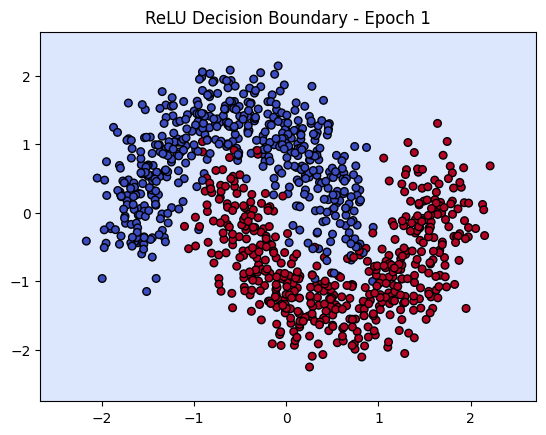

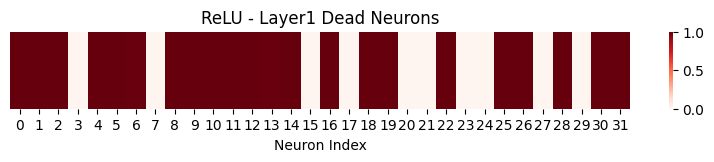

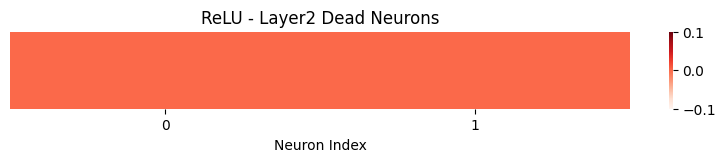

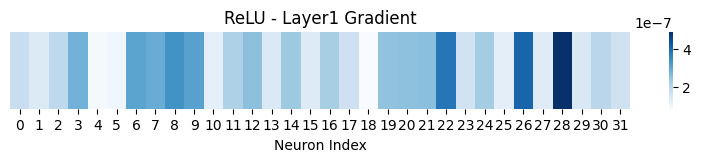

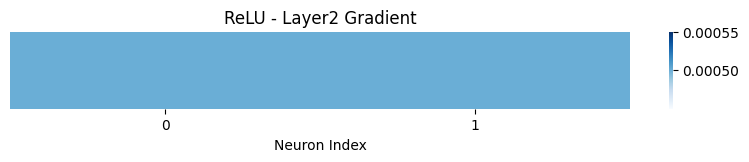

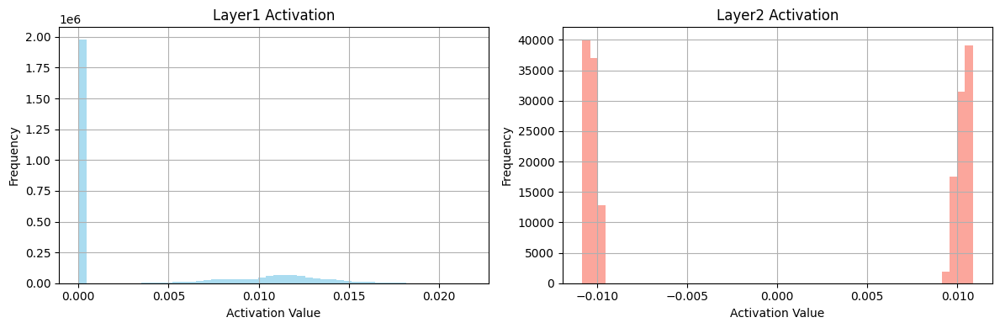

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



[ReLU - Epoch 201]


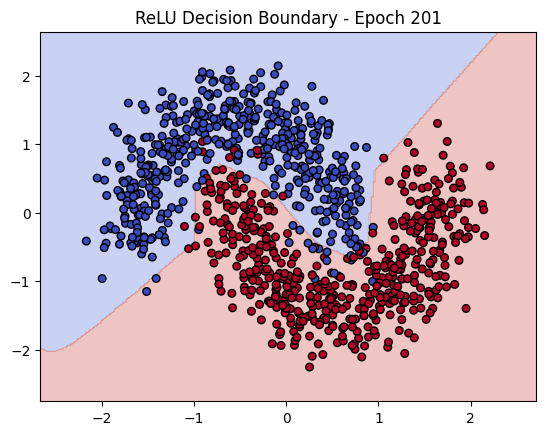

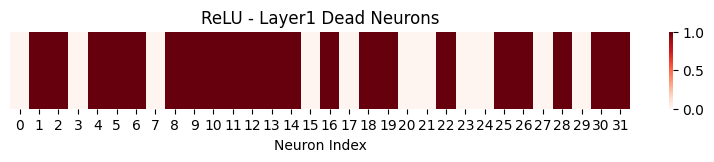

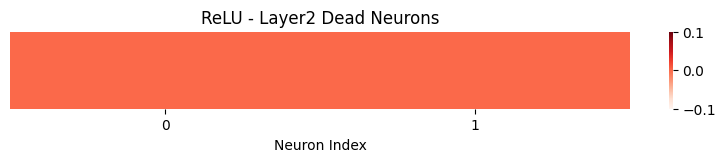

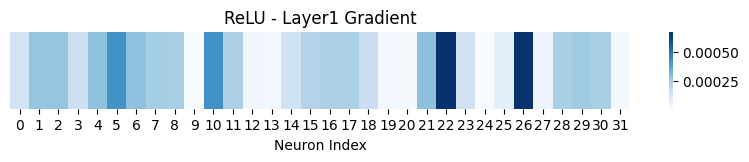

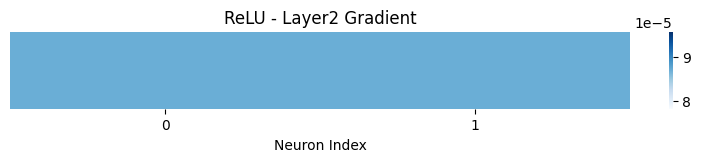

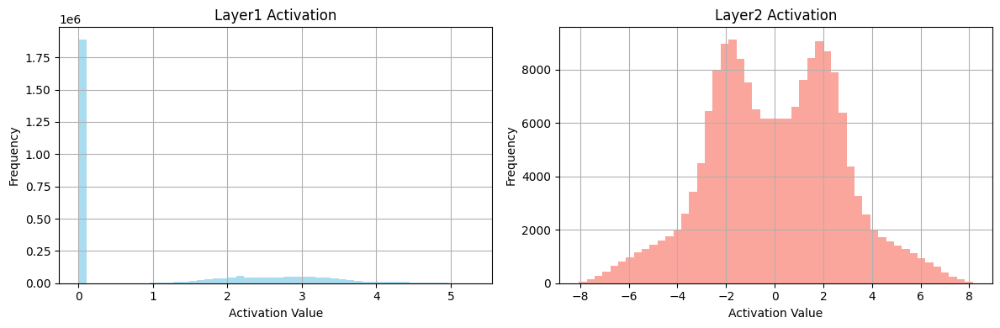

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



[ReLU - Epoch 400]


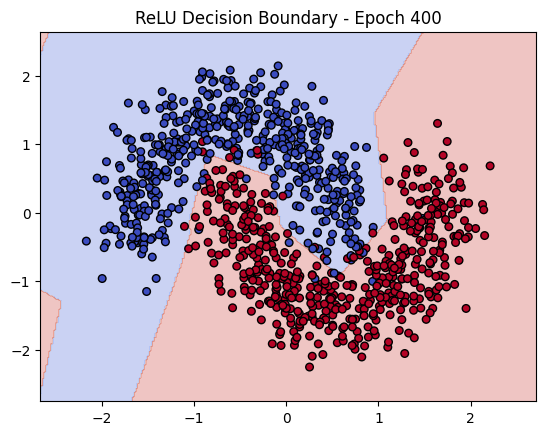

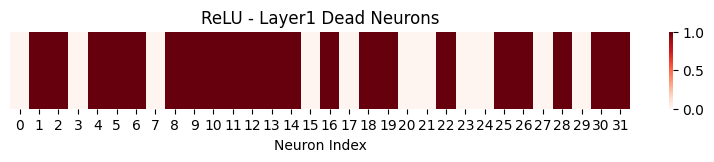

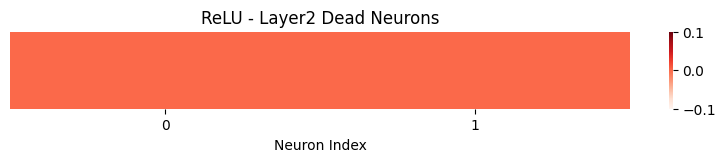

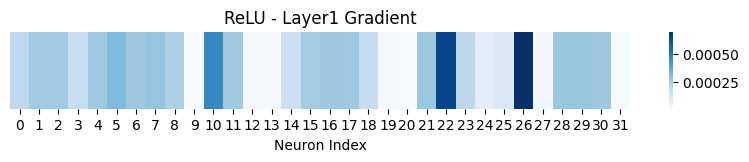

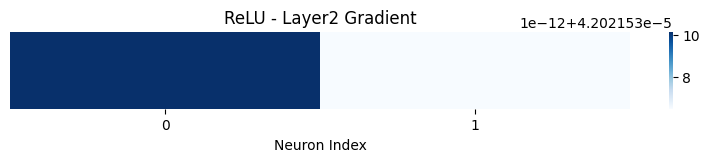

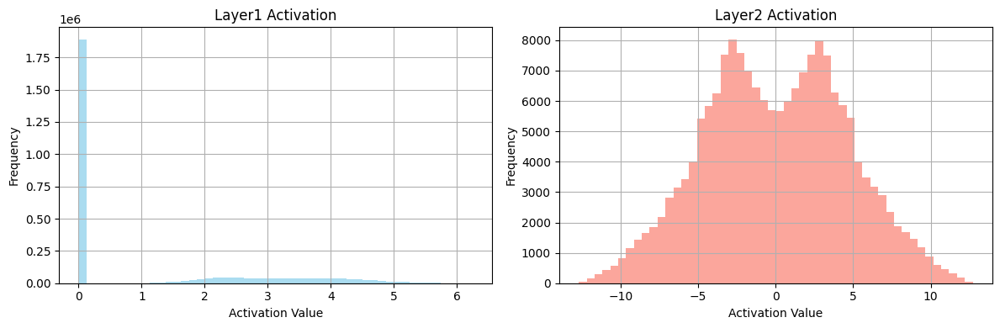


[ReLU] Final Accuracy: 97.00%
[ReLU] Layer1 Final Dead Neuron Ratio: 65.62%
[ReLU] Layer2 Final Dead Neuron Ratio: 0.00%


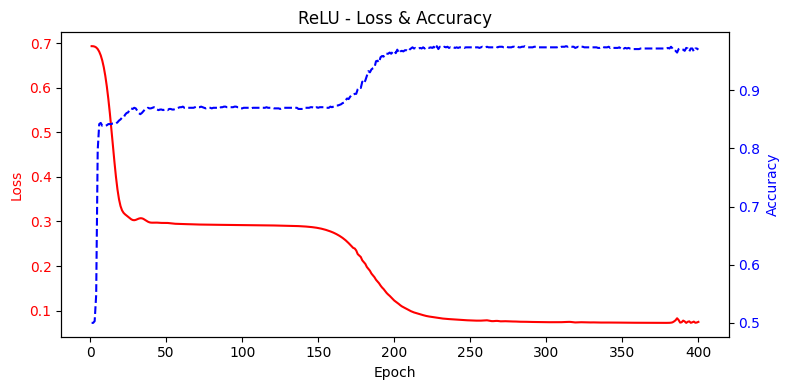


--- LeakyReLU 시작 ---

[LeakyReLU - Epoch 1]


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


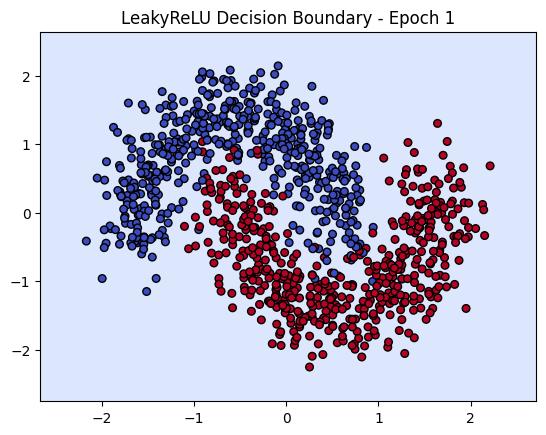

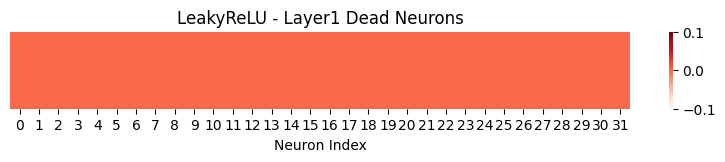

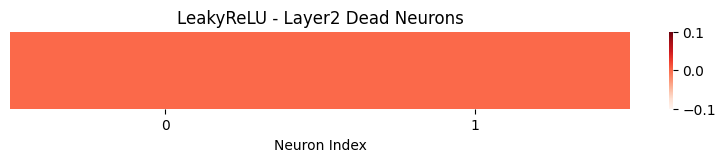

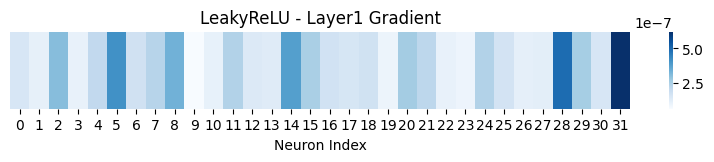

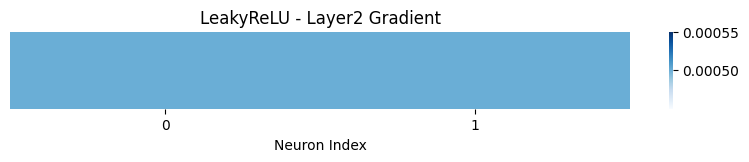

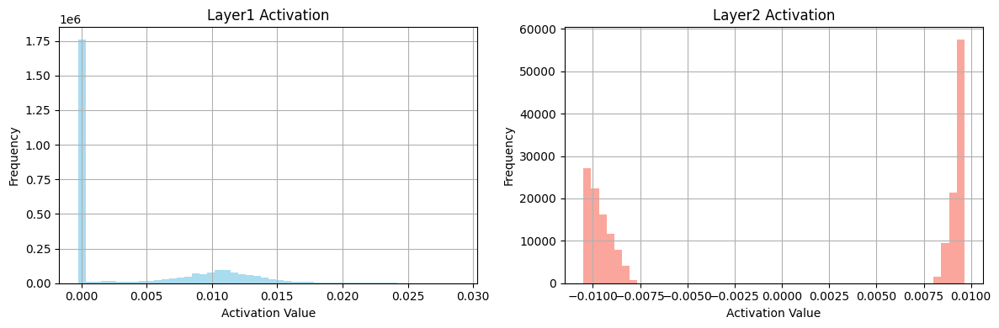

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



[LeakyReLU - Epoch 201]


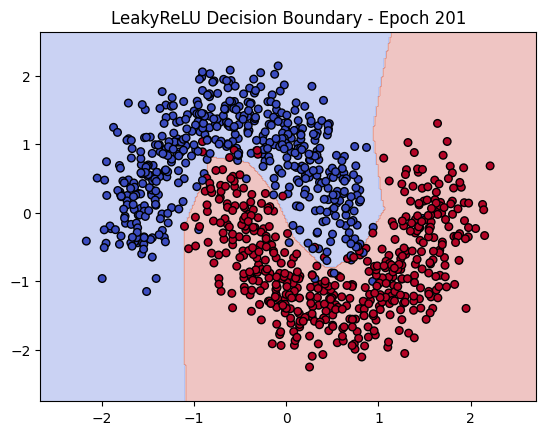

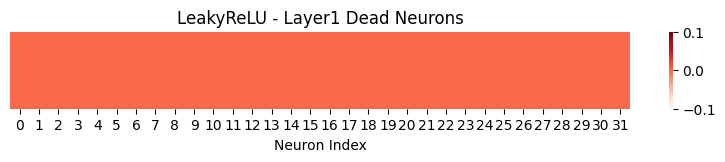

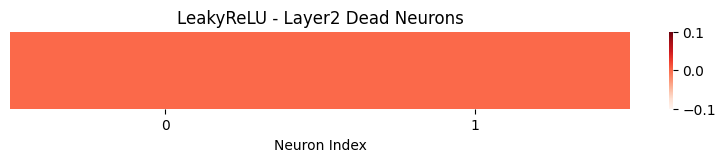

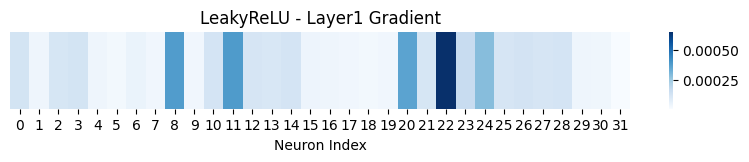

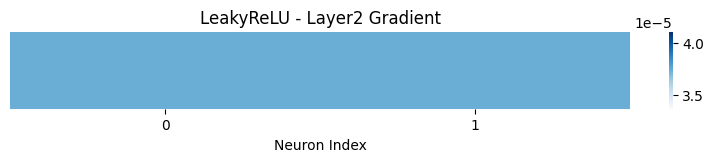

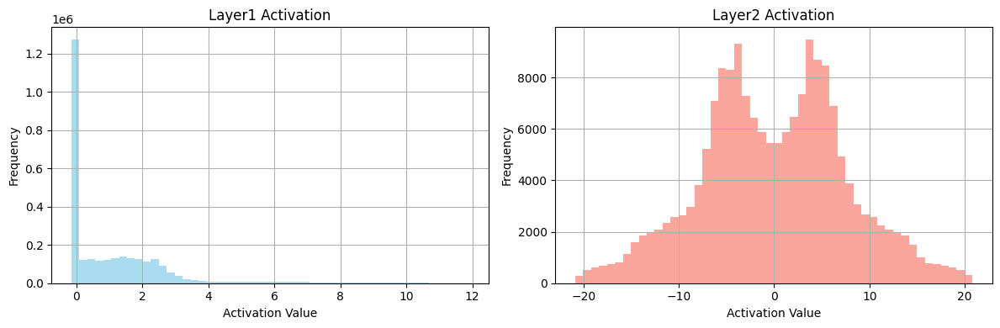

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



[LeakyReLU - Epoch 400]


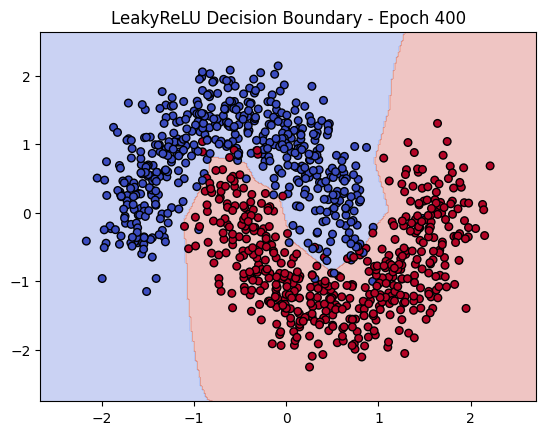

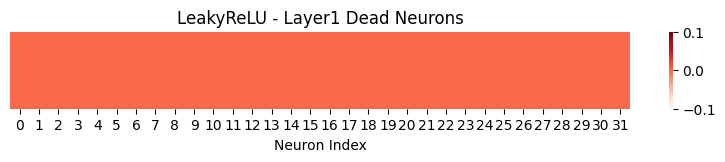

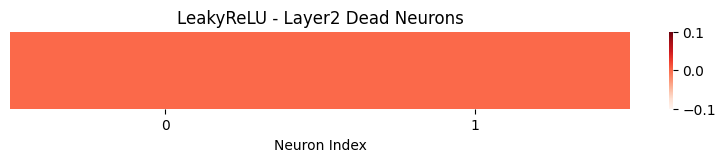

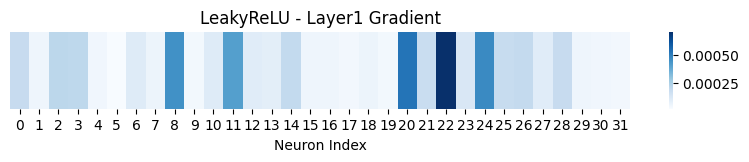

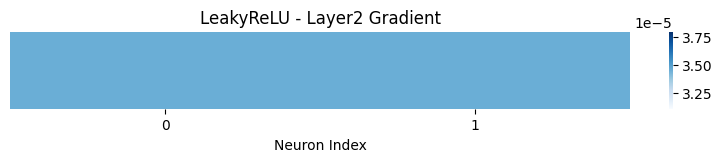

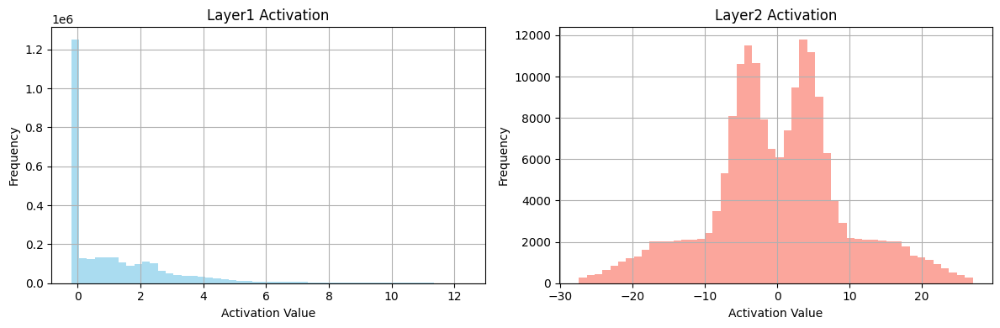


[LeakyReLU] Final Accuracy: 97.80%
[LeakyReLU] Layer1 Final Dead Neuron Ratio: 0.00%
[LeakyReLU] Layer2 Final Dead Neuron Ratio: 0.00%


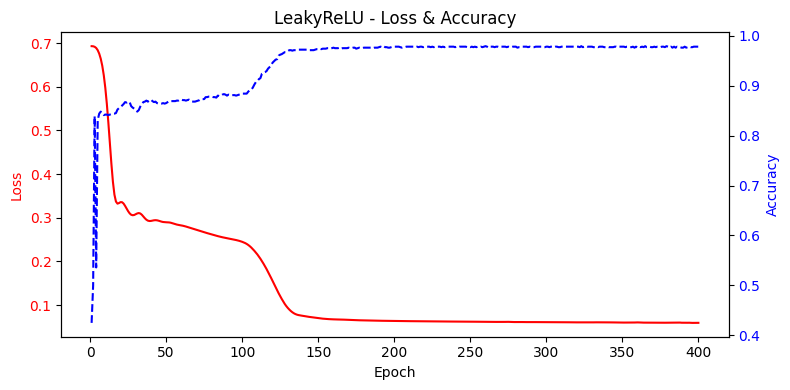


--- Sigmoid 시작 ---

[Sigmoid - Epoch 1]


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


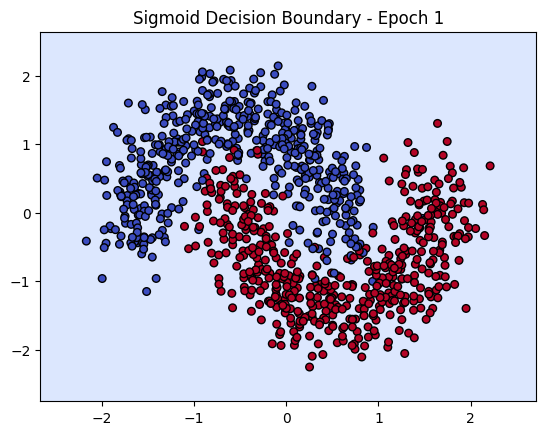

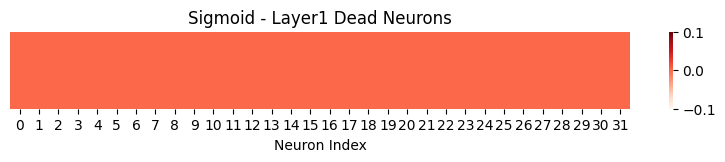

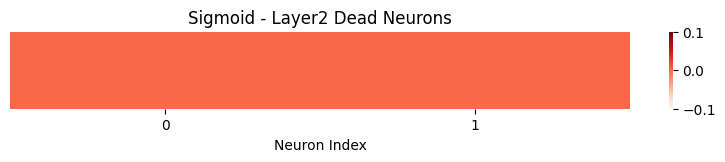

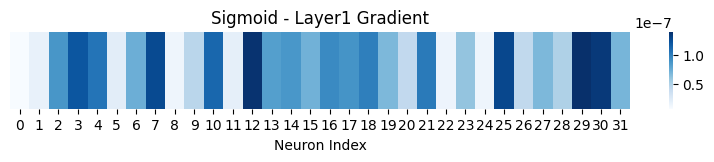

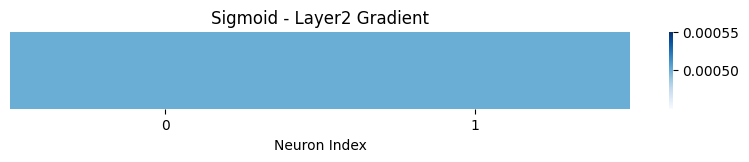

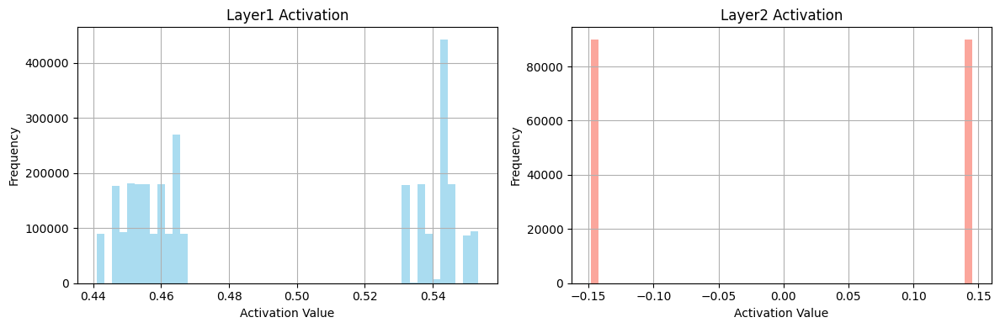

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



[Sigmoid - Epoch 201]


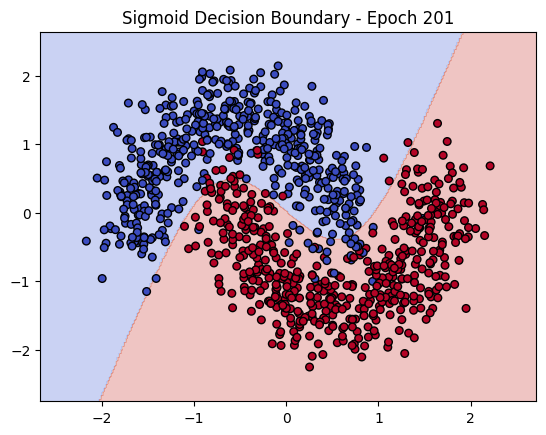

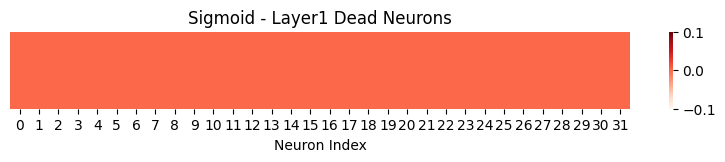

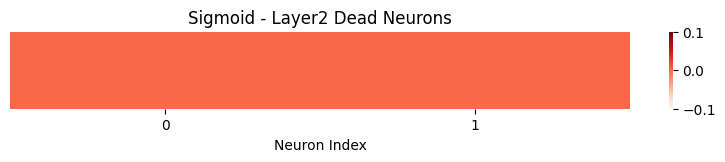

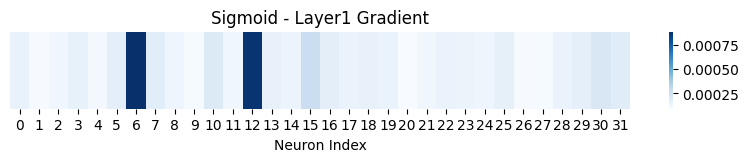

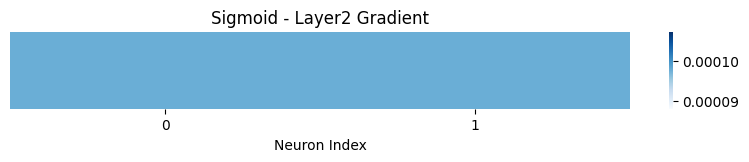

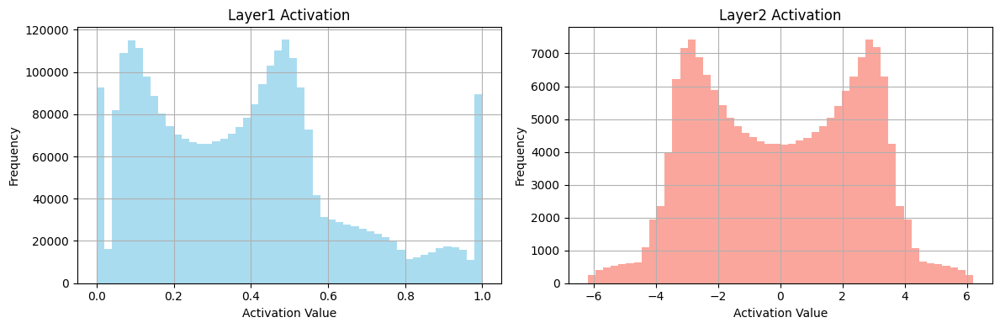

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



[Sigmoid - Epoch 400]


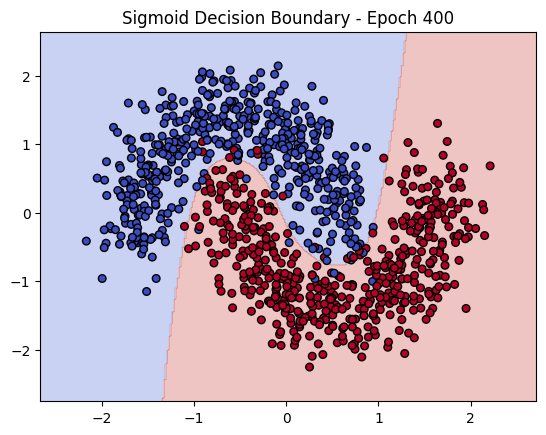

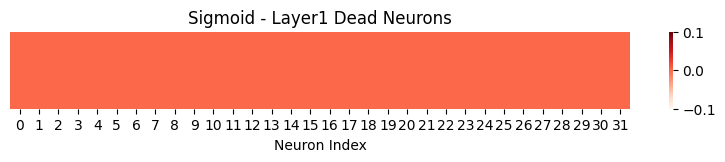

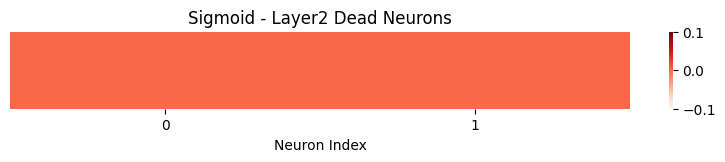

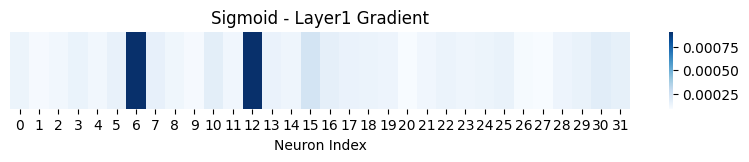

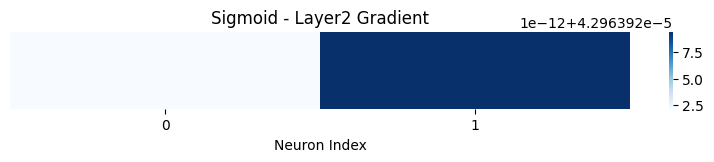

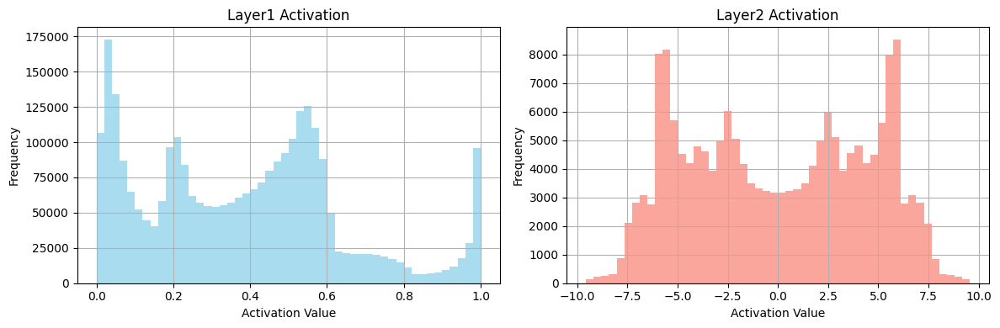


[Sigmoid] Final Accuracy: 97.30%
[Sigmoid] Layer1 Final Dead Neuron Ratio: 0.00%
[Sigmoid] Layer2 Final Dead Neuron Ratio: 0.00%


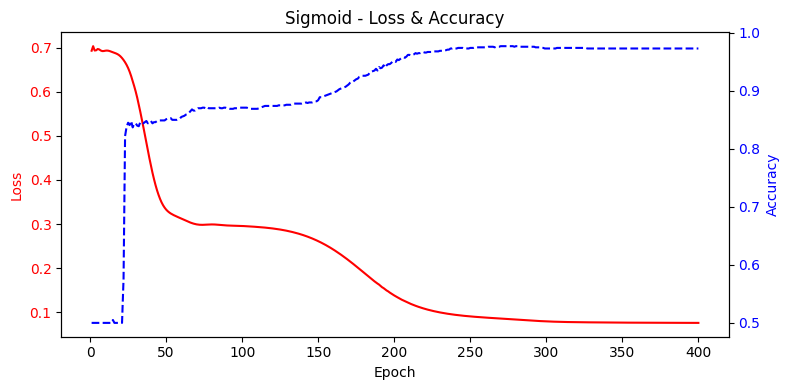

In [ ]:
X, y = get_toy_dataset("moons")

activations = {
    "ReLU": nn.ReLU(),
    "LeakyReLU": nn.LeakyReLU(0.01),
    "Sigmoid": nn.Sigmoid()
}

for name, act_fn in activations.items():
    print(f"\n--- {name} 시작 ---")
    model = get_toy_model(act_fn)
    loss_list, acc_list = train_with_metrics(model, X, y, name)
    plot_metric_curve(loss_list, acc_list, f"{name} - Loss & Accuracy")


#C

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

input_size = 28 * 28
num_classes = 10

#모델 정의 함수
def get_model():
    return nn.Sequential(
        nn.Flatten(),
        nn.Linear(input_size, 256),
        nn.ReLU(),
        nn.Linear(256, 128),
        nn.ReLU(),
        nn.Linear(128, num_classes)
    )

activation_values = {}
gradients = {}

#특정 레이어의 활성화값을 저장하는 forward hook 반환 함수
def save_activation(name):
    def hook(model, input, output):
        activation_values[name] = output.detach()
    return hook

#특정 레이어의 활성화값을 저장하는 backward hook 반환 함수
def save_gradient(name):
    def hook(module, grad_input, grad_output):
        gradients[name] = grad_output[0].detach()
    return hook

#모델의 특정 ReLU 레이어에 forward 및 backward hook을 등록하는 함수
def register_hooks(model):
    model[2].register_forward_hook(save_activation("relu1"))
    model[4].register_forward_hook(save_activation("relu2"))
    model[2].register_full_backward_hook(save_gradient("relu1"))
    model[4].register_full_backward_hook(save_gradient("relu2"))


In [ ]:
#ReLU 활성값 텐서를 이용해 Dead Neuron 비율의 히트맵 시각화 함수
def plot_dead_relu_heatmap(activation_tensor, title):
    is_dead = activation_tensor == 0
    dead_ratio = is_dead.float().mean(dim=0)
    plt.figure(figsize=(10, 1))
    sns.heatmap(dead_ratio.unsqueeze(0), cmap="Reds", cbar=True)
    plt.title(title)
    plt.xlabel("Neuron Index")
    plt.yticks([])
    plt.show()

#기울기 텐서를 이용해 뉴런별 평균 기울기 크기의 히트맵 시각화 함수
def plot_gradient_heatmap(gradient_tensor, title):
    mean_grad = gradient_tensor.abs().mean(dim=0)
    plt.figure(figsize=(10, 1))
    sns.heatmap(mean_grad.unsqueeze(0), cmap="Blues", cbar=True)
    plt.title(title)
    plt.xlabel("Neuron Index")
    plt.yticks([])
    plt.show()

#손실 및 정확도 곡선 시각화
def plot_loss_accuracy(results):
    sched_true = {k: v for k, v in results.items() if "schedTrue" in k}
    sched_false = {k: v for k, v in results.items() if "schedFalse" in k}

    plt.figure(figsize=(16, 10))

    # Loss Curve (스케줄러 X)
    plt.subplot(2, 2, 1)
    for key in sched_false:
        plt.plot(results[key]["loss"], label=key.replace("_schedFalse", ""))
    plt.title("Loss (Without Scheduler)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.legend()

    # Accuracy Curve (스케줄러 X)
    plt.subplot(2, 2, 2)
    for key in sched_false:
        plt.plot(results[key]["acc"], label=key.replace("_schedFalse", ""))
    plt.title("Accuracy (Without Scheduler)")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()

    #Loss Curve (스케줄러 O)
    plt.subplot(2, 2, 3)
    for key in sched_true:
        plt.plot(results[key]["loss"], label=key.replace("_schedTrue", ""))
    plt.title("Loss (With Scheduler)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.legend()

    #Accuracy Curve (스케줄러 O)
    plt.subplot(2, 2, 4)
    for key in sched_true:
        plt.plot(results[key]["acc"], label=key.replace("_schedTrue", ""))
    plt.title("Accuracy (With Scheduler)")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()

    plt.tight_layout()
    plt.show()


In [ ]:
def train_with_viz(model, loss_fn, optimizer, train_loader, scheduler=None, label=""):
    model.train()
    train_loss, train_acc = [], []

    for epoch in range(30):
        correct, total, running_loss = 0, 0, 0

        for images, labels in train_loader:
            outputs = model(images)
            loss = loss_fn(outputs, labels)
            pred = outputs.argmax(dim=1)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            total += labels.size(0)
            correct += (pred == labels).sum().item()

        if scheduler:
            scheduler.step()

        train_loss.append(running_loss / len(train_loader))
        train_acc.append(correct / total)

        print(f"[{label}] Epoch {epoch+1:02d} | Loss: {train_loss[-1]:.4f} | Acc: {train_acc[-1]*100:.2f}%")

        # 시각화 시점
        if epoch in [0, 14, 29]:
            print(f"\n[Epoch {epoch+1}] Activation & Gradient Visualization")

            plot_dead_relu_heatmap(activation_values["relu1"], f"{label} - ReLU1 Dead Neurons (Epoch {epoch+1})")
            plot_dead_relu_heatmap(activation_values["relu2"], f"{label} - ReLU2 Dead Neurons (Epoch {epoch+1})")

            plot_gradient_heatmap(gradients["relu1"], f"{label} - ReLU1 Gradient Flow (Epoch {epoch+1})")
            plot_gradient_heatmap(gradients["relu2"], f"{label} - ReLU2 Gradient Flow (Epoch {epoch+1})")

    return train_loss, train_acc


100%|██████████| 26.4M/26.4M [00:02<00:00, 12.8MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 200kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 3.72MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 14.4MB/s]



🔍 실험 시작: SGD_lr0.1_schedFalse
[SGD_lr0.1_schedFalse] Epoch 01 | Loss: 0.6710 | Acc: 75.94%

[Epoch 1] Activation & Gradient Visualization


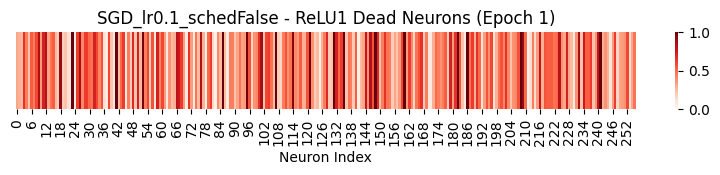

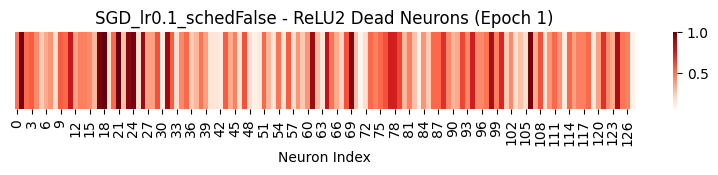

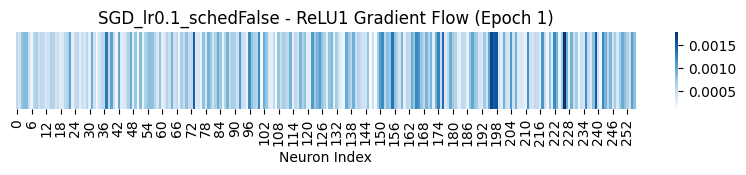

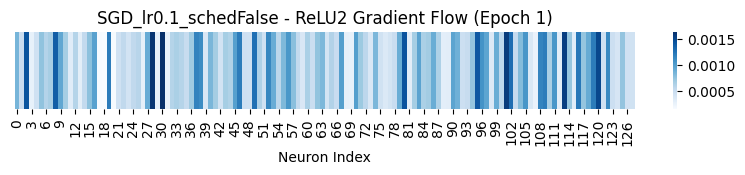

[SGD_lr0.1_schedFalse] Epoch 02 | Loss: 0.4302 | Acc: 84.28%
[SGD_lr0.1_schedFalse] Epoch 03 | Loss: 0.3808 | Acc: 86.08%
[SGD_lr0.1_schedFalse] Epoch 04 | Loss: 0.3490 | Acc: 87.25%
[SGD_lr0.1_schedFalse] Epoch 05 | Loss: 0.3304 | Acc: 87.83%
[SGD_lr0.1_schedFalse] Epoch 06 | Loss: 0.3146 | Acc: 88.30%
[SGD_lr0.1_schedFalse] Epoch 07 | Loss: 0.3005 | Acc: 88.88%
[SGD_lr0.1_schedFalse] Epoch 08 | Loss: 0.2890 | Acc: 89.22%
[SGD_lr0.1_schedFalse] Epoch 09 | Loss: 0.2761 | Acc: 89.77%
[SGD_lr0.1_schedFalse] Epoch 10 | Loss: 0.2672 | Acc: 90.04%
[SGD_lr0.1_schedFalse] Epoch 11 | Loss: 0.2583 | Acc: 90.35%
[SGD_lr0.1_schedFalse] Epoch 12 | Loss: 0.2489 | Acc: 90.54%
[SGD_lr0.1_schedFalse] Epoch 13 | Loss: 0.2443 | Acc: 90.77%
[SGD_lr0.1_schedFalse] Epoch 14 | Loss: 0.2363 | Acc: 91.15%
[SGD_lr0.1_schedFalse] Epoch 15 | Loss: 0.2303 | Acc: 91.41%

[Epoch 15] Activation & Gradient Visualization


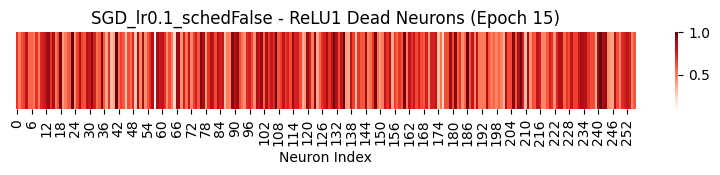

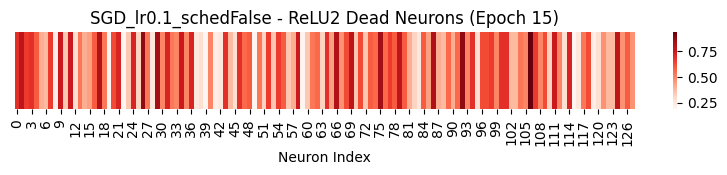

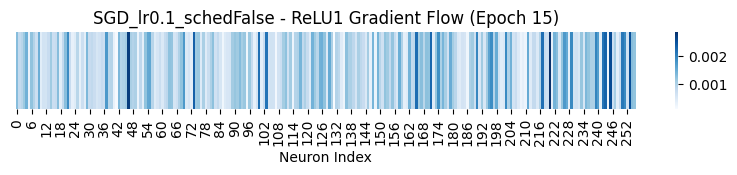

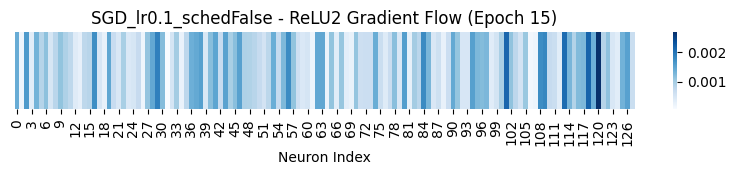

[SGD_lr0.1_schedFalse] Epoch 16 | Loss: 0.2240 | Acc: 91.52%
[SGD_lr0.1_schedFalse] Epoch 17 | Loss: 0.2164 | Acc: 91.83%
[SGD_lr0.1_schedFalse] Epoch 18 | Loss: 0.2112 | Acc: 92.03%
[SGD_lr0.1_schedFalse] Epoch 19 | Loss: 0.2056 | Acc: 92.22%
[SGD_lr0.1_schedFalse] Epoch 20 | Loss: 0.2005 | Acc: 92.48%
[SGD_lr0.1_schedFalse] Epoch 21 | Loss: 0.1943 | Acc: 92.62%
[SGD_lr0.1_schedFalse] Epoch 22 | Loss: 0.1912 | Acc: 92.86%
[SGD_lr0.1_schedFalse] Epoch 23 | Loss: 0.1856 | Acc: 92.90%
[SGD_lr0.1_schedFalse] Epoch 24 | Loss: 0.1798 | Acc: 93.21%
[SGD_lr0.1_schedFalse] Epoch 25 | Loss: 0.1759 | Acc: 93.32%
[SGD_lr0.1_schedFalse] Epoch 26 | Loss: 0.1725 | Acc: 93.42%
[SGD_lr0.1_schedFalse] Epoch 27 | Loss: 0.1676 | Acc: 93.60%
[SGD_lr0.1_schedFalse] Epoch 28 | Loss: 0.1633 | Acc: 93.80%
[SGD_lr0.1_schedFalse] Epoch 29 | Loss: 0.1616 | Acc: 93.81%
[SGD_lr0.1_schedFalse] Epoch 30 | Loss: 0.1576 | Acc: 94.06%

[Epoch 30] Activation & Gradient Visualization


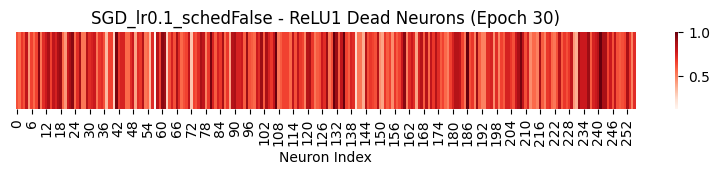

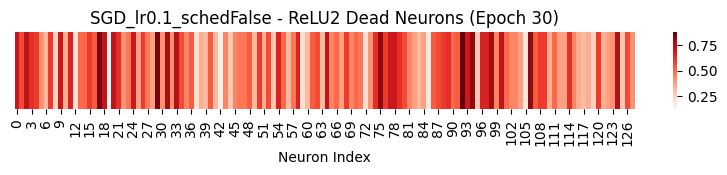

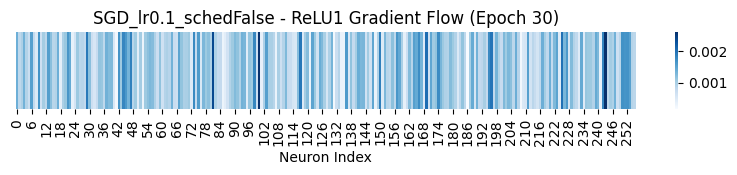

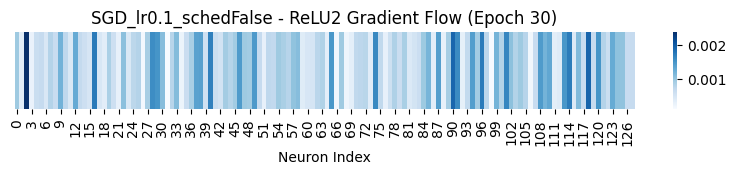


🔍 실험 시작: SGD_lr0.1_schedTrue
[SGD_lr0.1_schedTrue] Epoch 01 | Loss: 0.6729 | Acc: 76.02%

[Epoch 1] Activation & Gradient Visualization


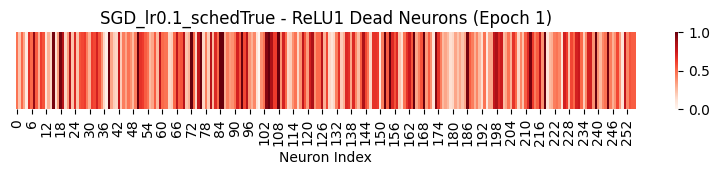

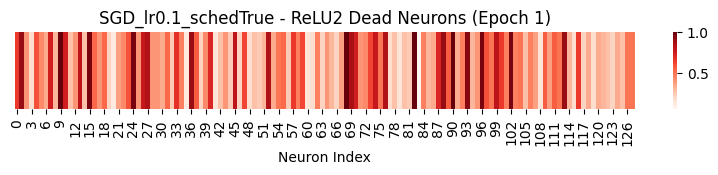

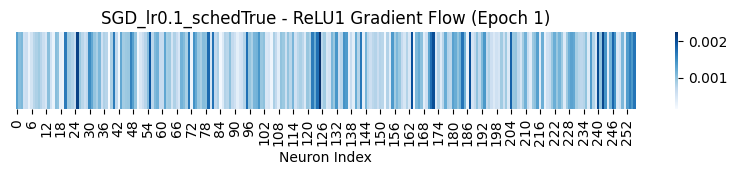

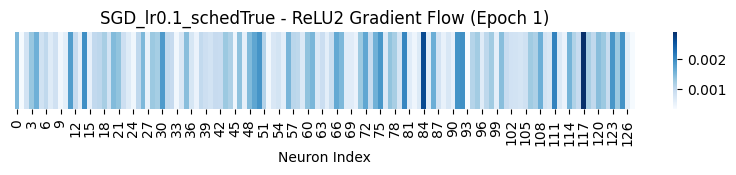

[SGD_lr0.1_schedTrue] Epoch 02 | Loss: 0.4256 | Acc: 84.62%
[SGD_lr0.1_schedTrue] Epoch 03 | Loss: 0.3758 | Acc: 86.29%
[SGD_lr0.1_schedTrue] Epoch 04 | Loss: 0.3478 | Acc: 87.24%
[SGD_lr0.1_schedTrue] Epoch 05 | Loss: 0.3262 | Acc: 88.09%
[SGD_lr0.1_schedTrue] Epoch 06 | Loss: 0.3105 | Acc: 88.64%
[SGD_lr0.1_schedTrue] Epoch 07 | Loss: 0.2975 | Acc: 88.96%
[SGD_lr0.1_schedTrue] Epoch 08 | Loss: 0.2847 | Acc: 89.49%
[SGD_lr0.1_schedTrue] Epoch 09 | Loss: 0.2751 | Acc: 89.88%
[SGD_lr0.1_schedTrue] Epoch 10 | Loss: 0.2662 | Acc: 90.26%
[SGD_lr0.1_schedTrue] Epoch 11 | Loss: 0.2576 | Acc: 90.46%
[SGD_lr0.1_schedTrue] Epoch 12 | Loss: 0.2517 | Acc: 90.62%
[SGD_lr0.1_schedTrue] Epoch 13 | Loss: 0.2450 | Acc: 90.92%
[SGD_lr0.1_schedTrue] Epoch 14 | Loss: 0.2394 | Acc: 91.08%
[SGD_lr0.1_schedTrue] Epoch 15 | Loss: 0.2334 | Acc: 91.42%

[Epoch 15] Activation & Gradient Visualization


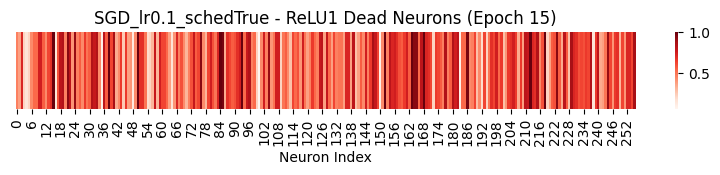

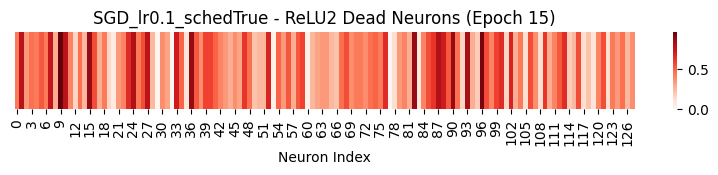

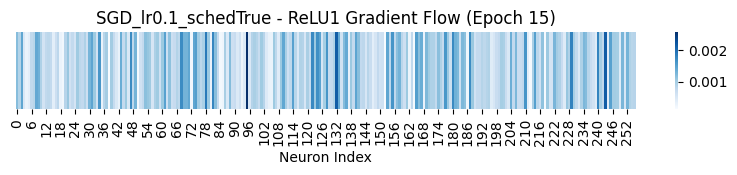

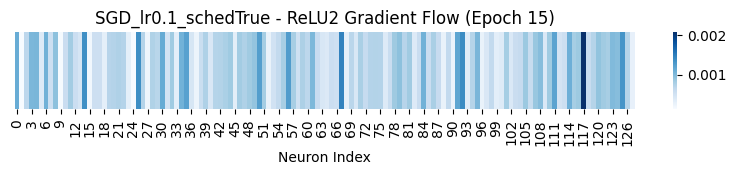

[SGD_lr0.1_schedTrue] Epoch 16 | Loss: 0.2283 | Acc: 91.56%
[SGD_lr0.1_schedTrue] Epoch 17 | Loss: 0.2237 | Acc: 91.83%
[SGD_lr0.1_schedTrue] Epoch 18 | Loss: 0.2198 | Acc: 92.00%
[SGD_lr0.1_schedTrue] Epoch 19 | Loss: 0.2159 | Acc: 92.07%
[SGD_lr0.1_schedTrue] Epoch 20 | Loss: 0.2132 | Acc: 92.17%
[SGD_lr0.1_schedTrue] Epoch 21 | Loss: 0.2095 | Acc: 92.35%
[SGD_lr0.1_schedTrue] Epoch 22 | Loss: 0.2071 | Acc: 92.53%
[SGD_lr0.1_schedTrue] Epoch 23 | Loss: 0.2039 | Acc: 92.60%
[SGD_lr0.1_schedTrue] Epoch 24 | Loss: 0.2019 | Acc: 92.68%
[SGD_lr0.1_schedTrue] Epoch 25 | Loss: 0.1996 | Acc: 92.83%
[SGD_lr0.1_schedTrue] Epoch 26 | Loss: 0.1980 | Acc: 92.94%
[SGD_lr0.1_schedTrue] Epoch 27 | Loss: 0.1963 | Acc: 92.94%
[SGD_lr0.1_schedTrue] Epoch 28 | Loss: 0.1943 | Acc: 93.05%
[SGD_lr0.1_schedTrue] Epoch 29 | Loss: 0.1928 | Acc: 93.09%
[SGD_lr0.1_schedTrue] Epoch 30 | Loss: 0.1917 | Acc: 93.13%

[Epoch 30] Activation & Gradient Visualization


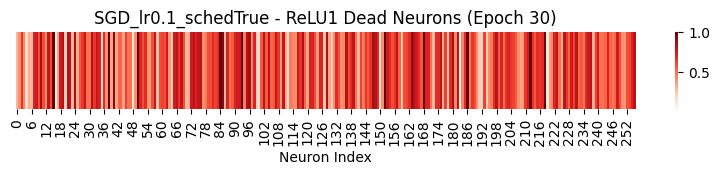

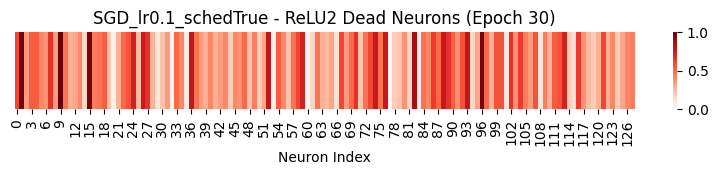

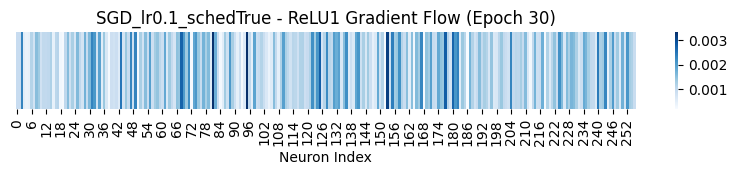

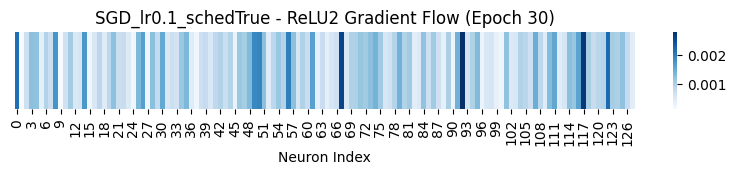


🔍 실험 시작: SGD_lr0.01_schedFalse
[SGD_lr0.01_schedFalse] Epoch 01 | Loss: 1.3764 | Acc: 53.99%

[Epoch 1] Activation & Gradient Visualization


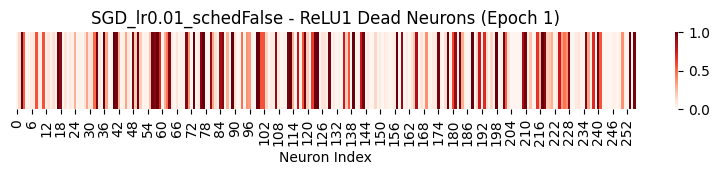

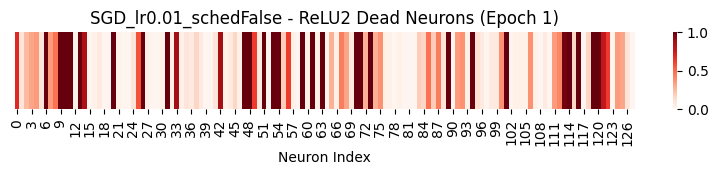

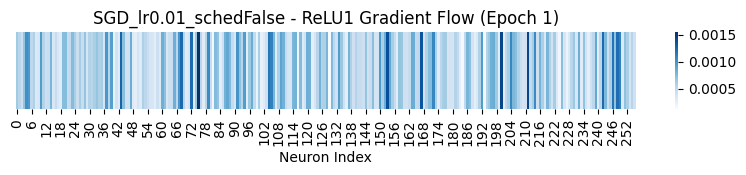

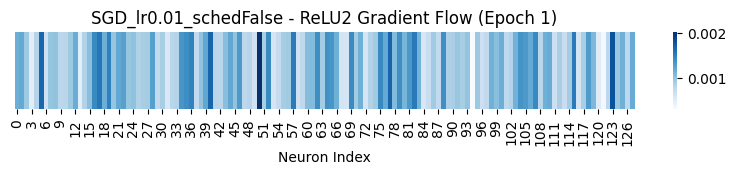

[SGD_lr0.01_schedFalse] Epoch 02 | Loss: 0.7184 | Acc: 73.49%
[SGD_lr0.01_schedFalse] Epoch 03 | Loss: 0.5990 | Acc: 79.30%
[SGD_lr0.01_schedFalse] Epoch 04 | Loss: 0.5336 | Acc: 81.51%
[SGD_lr0.01_schedFalse] Epoch 05 | Loss: 0.4972 | Acc: 82.65%
[SGD_lr0.01_schedFalse] Epoch 06 | Loss: 0.4748 | Acc: 83.40%
[SGD_lr0.01_schedFalse] Epoch 07 | Loss: 0.4584 | Acc: 83.95%
[SGD_lr0.01_schedFalse] Epoch 08 | Loss: 0.4459 | Acc: 84.42%
[SGD_lr0.01_schedFalse] Epoch 09 | Loss: 0.4350 | Acc: 84.82%
[SGD_lr0.01_schedFalse] Epoch 10 | Loss: 0.4253 | Acc: 85.19%
[SGD_lr0.01_schedFalse] Epoch 11 | Loss: 0.4164 | Acc: 85.47%
[SGD_lr0.01_schedFalse] Epoch 12 | Loss: 0.4097 | Acc: 85.78%
[SGD_lr0.01_schedFalse] Epoch 13 | Loss: 0.4034 | Acc: 85.83%
[SGD_lr0.01_schedFalse] Epoch 14 | Loss: 0.3962 | Acc: 86.30%
[SGD_lr0.01_schedFalse] Epoch 15 | Loss: 0.3911 | Acc: 86.30%

[Epoch 15] Activation & Gradient Visualization


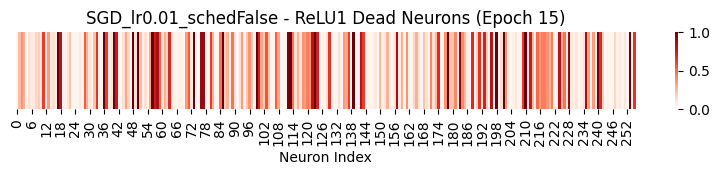

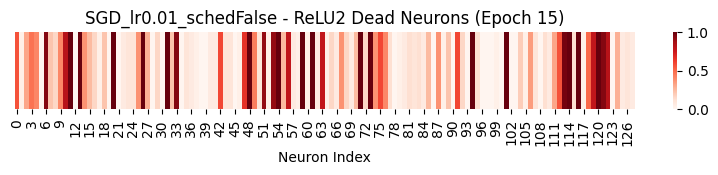

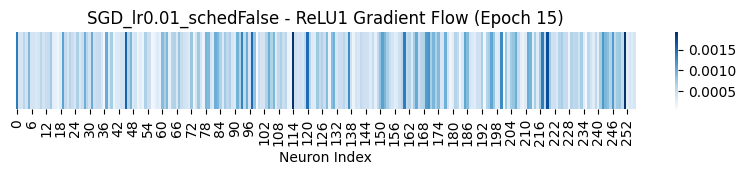

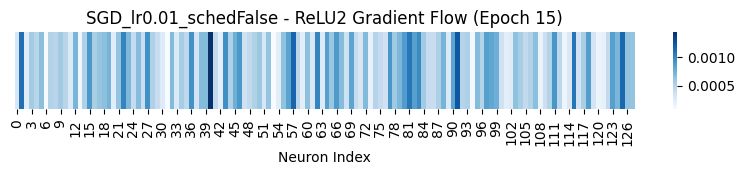

[SGD_lr0.01_schedFalse] Epoch 16 | Loss: 0.3848 | Acc: 86.52%
[SGD_lr0.01_schedFalse] Epoch 17 | Loss: 0.3789 | Acc: 86.79%
[SGD_lr0.01_schedFalse] Epoch 18 | Loss: 0.3735 | Acc: 86.98%
[SGD_lr0.01_schedFalse] Epoch 19 | Loss: 0.3682 | Acc: 87.05%
[SGD_lr0.01_schedFalse] Epoch 20 | Loss: 0.3634 | Acc: 87.30%
[SGD_lr0.01_schedFalse] Epoch 21 | Loss: 0.3578 | Acc: 87.53%
[SGD_lr0.01_schedFalse] Epoch 22 | Loss: 0.3542 | Acc: 87.54%
[SGD_lr0.01_schedFalse] Epoch 23 | Loss: 0.3496 | Acc: 87.70%
[SGD_lr0.01_schedFalse] Epoch 24 | Loss: 0.3466 | Acc: 87.77%
[SGD_lr0.01_schedFalse] Epoch 25 | Loss: 0.3416 | Acc: 87.99%
[SGD_lr0.01_schedFalse] Epoch 26 | Loss: 0.3377 | Acc: 88.05%
[SGD_lr0.01_schedFalse] Epoch 27 | Loss: 0.3339 | Acc: 88.20%
[SGD_lr0.01_schedFalse] Epoch 28 | Loss: 0.3294 | Acc: 88.40%
[SGD_lr0.01_schedFalse] Epoch 29 | Loss: 0.3268 | Acc: 88.44%
[SGD_lr0.01_schedFalse] Epoch 30 | Loss: 0.3222 | Acc: 88.61%

[Epoch 30] Activation & Gradient Visualization


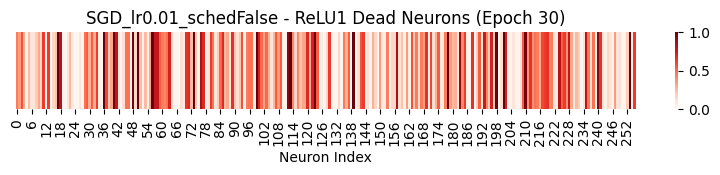

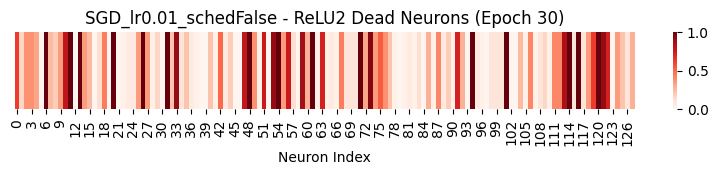

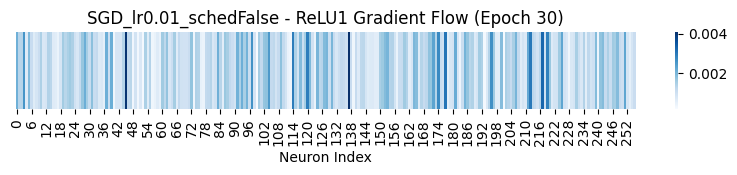

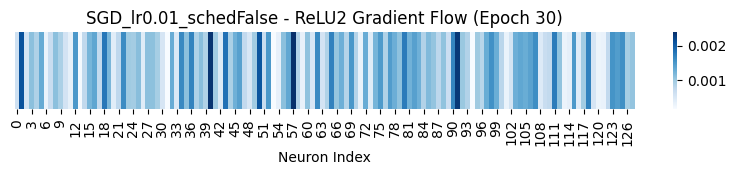


🔍 실험 시작: SGD_lr0.01_schedTrue
[SGD_lr0.01_schedTrue] Epoch 01 | Loss: 1.4259 | Acc: 57.26%

[Epoch 1] Activation & Gradient Visualization


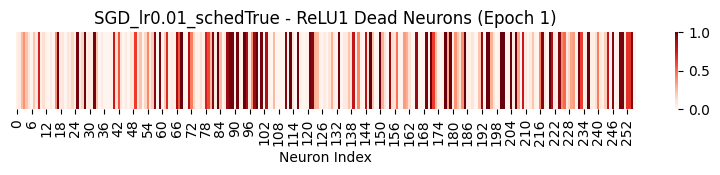

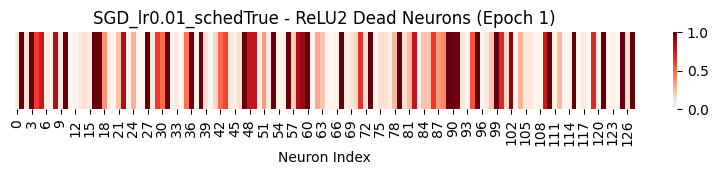

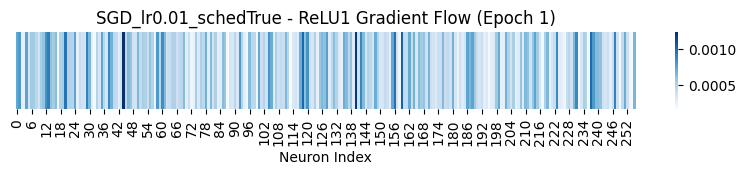

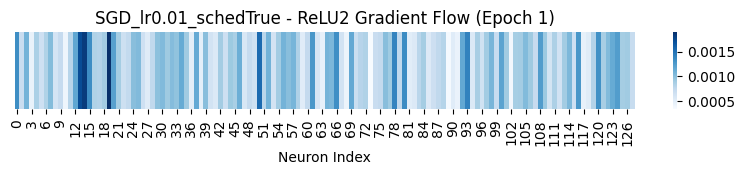

[SGD_lr0.01_schedTrue] Epoch 02 | Loss: 0.7290 | Acc: 73.65%
[SGD_lr0.01_schedTrue] Epoch 03 | Loss: 0.6117 | Acc: 78.75%
[SGD_lr0.01_schedTrue] Epoch 04 | Loss: 0.5529 | Acc: 80.94%
[SGD_lr0.01_schedTrue] Epoch 05 | Loss: 0.5184 | Acc: 82.12%
[SGD_lr0.01_schedTrue] Epoch 06 | Loss: 0.4965 | Acc: 82.69%
[SGD_lr0.01_schedTrue] Epoch 07 | Loss: 0.4822 | Acc: 83.23%
[SGD_lr0.01_schedTrue] Epoch 08 | Loss: 0.4700 | Acc: 83.71%
[SGD_lr0.01_schedTrue] Epoch 09 | Loss: 0.4615 | Acc: 83.88%
[SGD_lr0.01_schedTrue] Epoch 10 | Loss: 0.4544 | Acc: 84.10%
[SGD_lr0.01_schedTrue] Epoch 11 | Loss: 0.4487 | Acc: 84.38%
[SGD_lr0.01_schedTrue] Epoch 12 | Loss: 0.4437 | Acc: 84.55%
[SGD_lr0.01_schedTrue] Epoch 13 | Loss: 0.4396 | Acc: 84.71%
[SGD_lr0.01_schedTrue] Epoch 14 | Loss: 0.4360 | Acc: 84.82%
[SGD_lr0.01_schedTrue] Epoch 15 | Loss: 0.4329 | Acc: 84.91%

[Epoch 15] Activation & Gradient Visualization


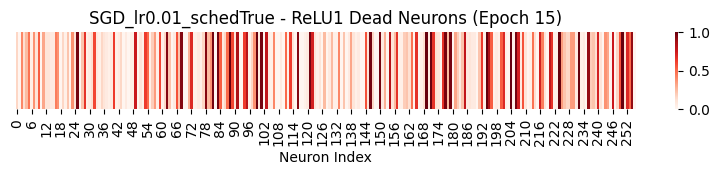

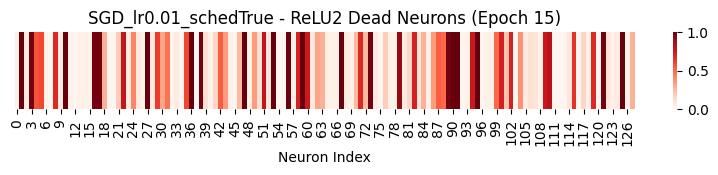

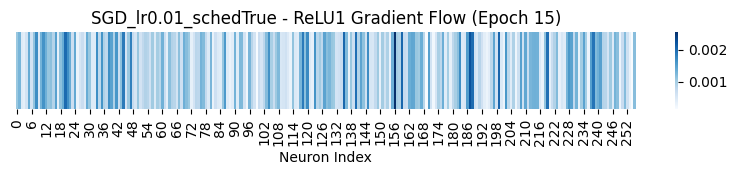

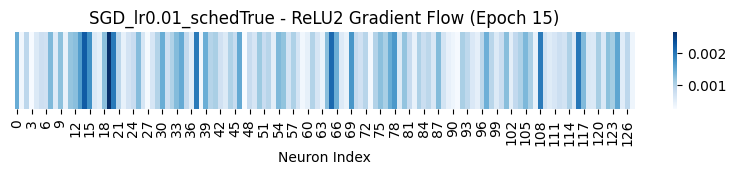

[SGD_lr0.01_schedTrue] Epoch 16 | Loss: 0.4301 | Acc: 85.01%
[SGD_lr0.01_schedTrue] Epoch 17 | Loss: 0.4276 | Acc: 85.04%
[SGD_lr0.01_schedTrue] Epoch 18 | Loss: 0.4255 | Acc: 85.18%
[SGD_lr0.01_schedTrue] Epoch 19 | Loss: 0.4237 | Acc: 85.29%
[SGD_lr0.01_schedTrue] Epoch 20 | Loss: 0.4223 | Acc: 85.39%
[SGD_lr0.01_schedTrue] Epoch 21 | Loss: 0.4207 | Acc: 85.40%
[SGD_lr0.01_schedTrue] Epoch 22 | Loss: 0.4193 | Acc: 85.50%
[SGD_lr0.01_schedTrue] Epoch 23 | Loss: 0.4182 | Acc: 85.48%
[SGD_lr0.01_schedTrue] Epoch 24 | Loss: 0.4172 | Acc: 85.56%
[SGD_lr0.01_schedTrue] Epoch 25 | Loss: 0.4162 | Acc: 85.59%
[SGD_lr0.01_schedTrue] Epoch 26 | Loss: 0.4153 | Acc: 85.60%
[SGD_lr0.01_schedTrue] Epoch 27 | Loss: 0.4146 | Acc: 85.64%
[SGD_lr0.01_schedTrue] Epoch 28 | Loss: 0.4138 | Acc: 85.66%
[SGD_lr0.01_schedTrue] Epoch 29 | Loss: 0.4133 | Acc: 85.71%
[SGD_lr0.01_schedTrue] Epoch 30 | Loss: 0.4129 | Acc: 85.70%

[Epoch 30] Activation & Gradient Visualization


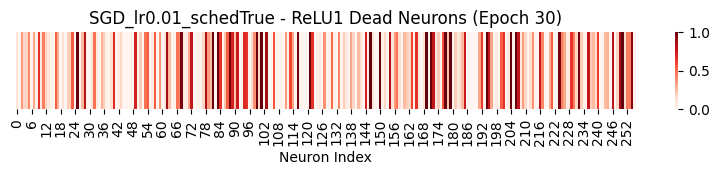

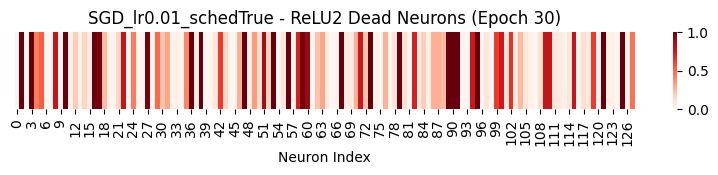

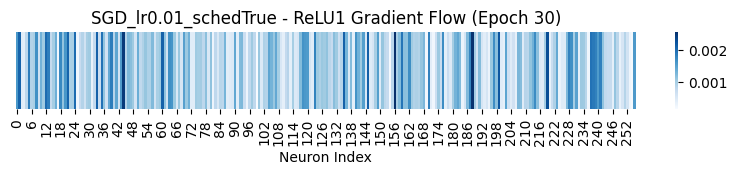

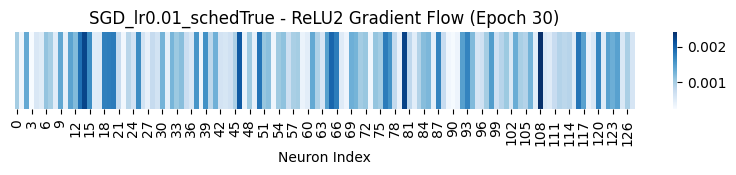


🔍 실험 시작: SGD_lr0.001_schedFalse
[SGD_lr0.001_schedFalse] Epoch 01 | Loss: 2.2477 | Acc: 33.53%

[Epoch 1] Activation & Gradient Visualization


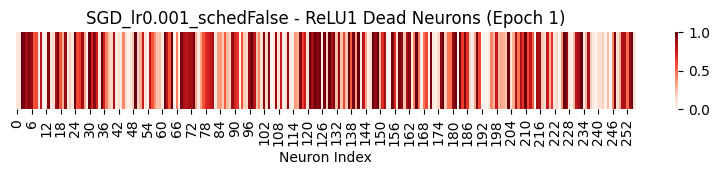

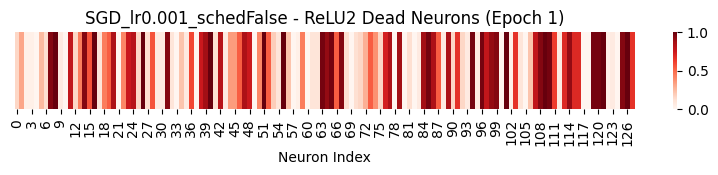

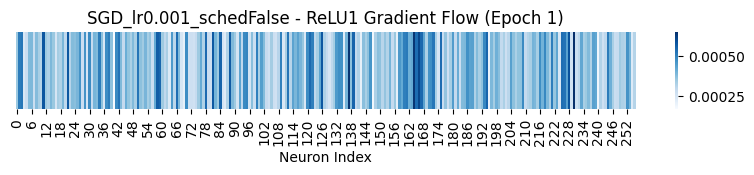

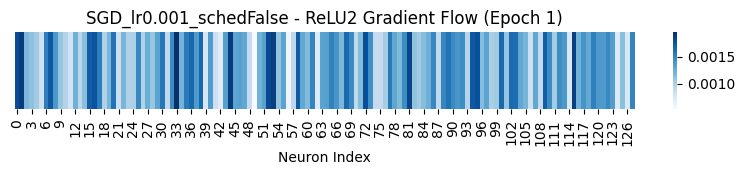

[SGD_lr0.001_schedFalse] Epoch 02 | Loss: 2.1075 | Acc: 44.69%
[SGD_lr0.001_schedFalse] Epoch 03 | Loss: 1.8506 | Acc: 47.26%
[SGD_lr0.001_schedFalse] Epoch 04 | Loss: 1.5302 | Acc: 57.04%
[SGD_lr0.001_schedFalse] Epoch 05 | Loss: 1.2811 | Acc: 62.82%
[SGD_lr0.001_schedFalse] Epoch 06 | Loss: 1.1148 | Acc: 64.78%
[SGD_lr0.001_schedFalse] Epoch 07 | Loss: 1.0025 | Acc: 66.19%
[SGD_lr0.001_schedFalse] Epoch 08 | Loss: 0.9247 | Acc: 67.27%
[SGD_lr0.001_schedFalse] Epoch 09 | Loss: 0.8685 | Acc: 68.32%
[SGD_lr0.001_schedFalse] Epoch 10 | Loss: 0.8262 | Acc: 69.44%
[SGD_lr0.001_schedFalse] Epoch 11 | Loss: 0.7932 | Acc: 70.44%
[SGD_lr0.001_schedFalse] Epoch 12 | Loss: 0.7658 | Acc: 71.62%
[SGD_lr0.001_schedFalse] Epoch 13 | Loss: 0.7428 | Acc: 72.67%
[SGD_lr0.001_schedFalse] Epoch 14 | Loss: 0.7226 | Acc: 73.74%
[SGD_lr0.001_schedFalse] Epoch 15 | Loss: 0.7041 | Acc: 74.78%

[Epoch 15] Activation & Gradient Visualization


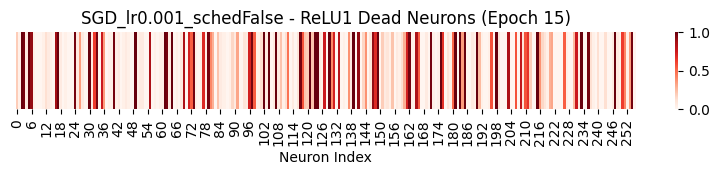

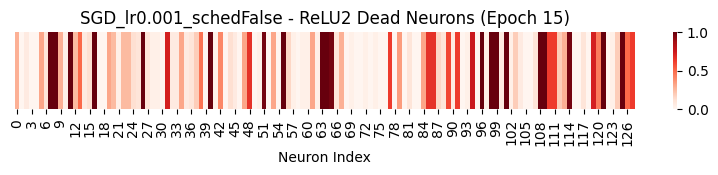

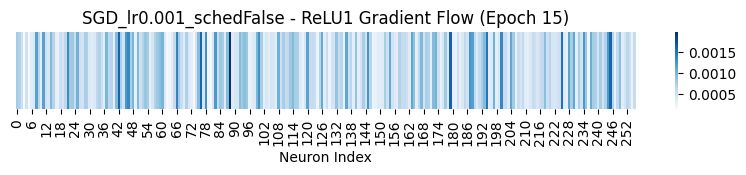

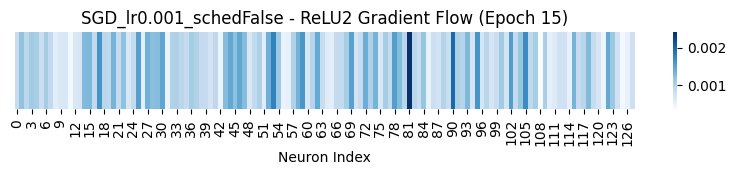

[SGD_lr0.001_schedFalse] Epoch 16 | Loss: 0.6873 | Acc: 75.58%
[SGD_lr0.001_schedFalse] Epoch 17 | Loss: 0.6717 | Acc: 76.28%
[SGD_lr0.001_schedFalse] Epoch 18 | Loss: 0.6574 | Acc: 77.06%
[SGD_lr0.001_schedFalse] Epoch 19 | Loss: 0.6441 | Acc: 77.69%
[SGD_lr0.001_schedFalse] Epoch 20 | Loss: 0.6315 | Acc: 78.17%
[SGD_lr0.001_schedFalse] Epoch 21 | Loss: 0.6201 | Acc: 78.62%
[SGD_lr0.001_schedFalse] Epoch 22 | Loss: 0.6088 | Acc: 79.14%
[SGD_lr0.001_schedFalse] Epoch 23 | Loss: 0.5988 | Acc: 79.50%
[SGD_lr0.001_schedFalse] Epoch 24 | Loss: 0.5894 | Acc: 79.85%
[SGD_lr0.001_schedFalse] Epoch 25 | Loss: 0.5806 | Acc: 80.14%
[SGD_lr0.001_schedFalse] Epoch 26 | Loss: 0.5723 | Acc: 80.46%
[SGD_lr0.001_schedFalse] Epoch 27 | Loss: 0.5646 | Acc: 80.68%
[SGD_lr0.001_schedFalse] Epoch 28 | Loss: 0.5573 | Acc: 80.91%
[SGD_lr0.001_schedFalse] Epoch 29 | Loss: 0.5508 | Acc: 81.15%
[SGD_lr0.001_schedFalse] Epoch 30 | Loss: 0.5445 | Acc: 81.34%

[Epoch 30] Activation & Gradient Visualization


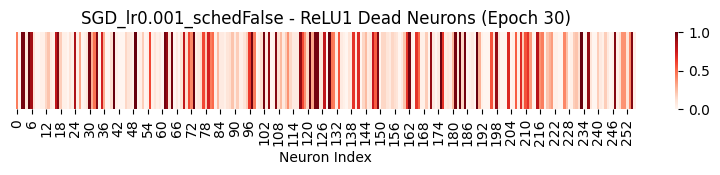

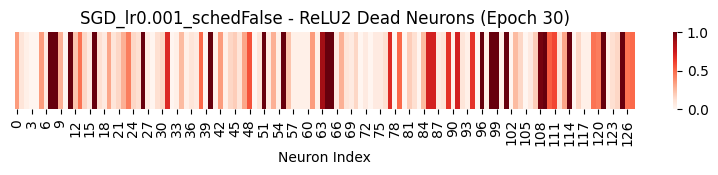

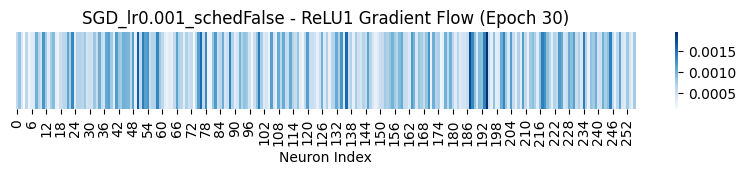

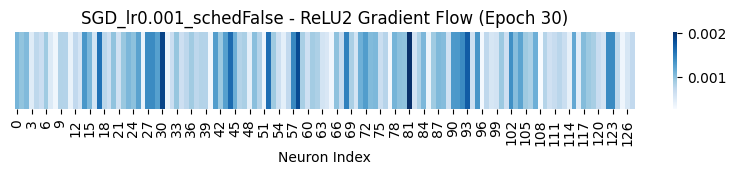


🔍 실험 시작: SGD_lr0.001_schedTrue
[SGD_lr0.001_schedTrue] Epoch 01 | Loss: 2.2682 | Acc: 18.60%

[Epoch 1] Activation & Gradient Visualization


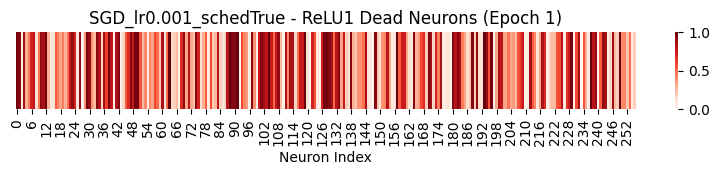

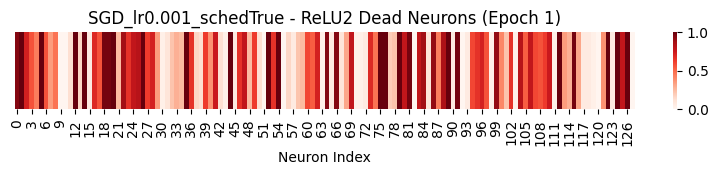

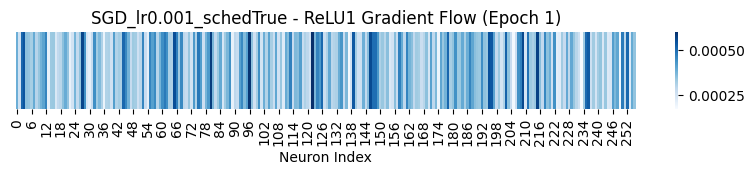

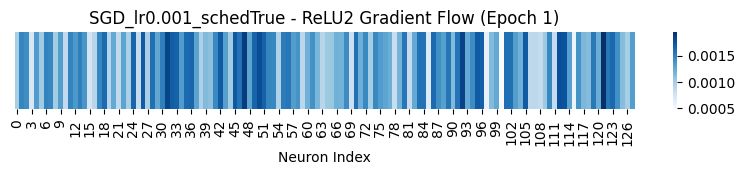

[SGD_lr0.001_schedTrue] Epoch 02 | Loss: 2.1593 | Acc: 48.67%
[SGD_lr0.001_schedTrue] Epoch 03 | Loss: 1.9753 | Acc: 53.90%
[SGD_lr0.001_schedTrue] Epoch 04 | Loss: 1.7211 | Acc: 54.92%
[SGD_lr0.001_schedTrue] Epoch 05 | Loss: 1.4922 | Acc: 57.00%
[SGD_lr0.001_schedTrue] Epoch 06 | Loss: 1.3315 | Acc: 59.63%
[SGD_lr0.001_schedTrue] Epoch 07 | Loss: 1.2221 | Acc: 61.29%
[SGD_lr0.001_schedTrue] Epoch 08 | Loss: 1.1447 | Acc: 62.19%
[SGD_lr0.001_schedTrue] Epoch 09 | Loss: 1.0879 | Acc: 63.42%
[SGD_lr0.001_schedTrue] Epoch 10 | Loss: 1.0451 | Acc: 64.35%
[SGD_lr0.001_schedTrue] Epoch 11 | Loss: 1.0115 | Acc: 64.98%
[SGD_lr0.001_schedTrue] Epoch 12 | Loss: 0.9846 | Acc: 65.80%
[SGD_lr0.001_schedTrue] Epoch 13 | Loss: 0.9627 | Acc: 66.29%
[SGD_lr0.001_schedTrue] Epoch 14 | Loss: 0.9446 | Acc: 66.83%
[SGD_lr0.001_schedTrue] Epoch 15 | Loss: 0.9293 | Acc: 67.22%

[Epoch 15] Activation & Gradient Visualization


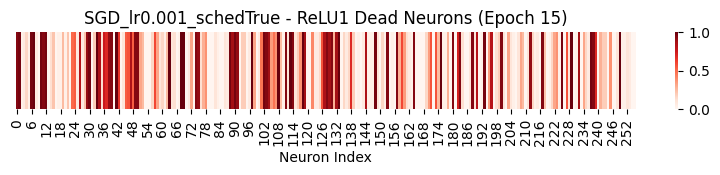

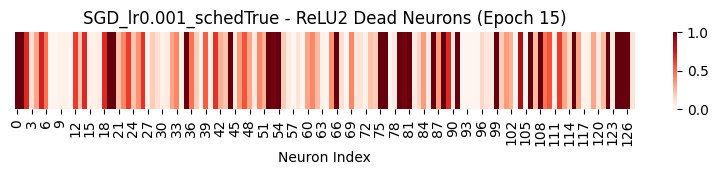

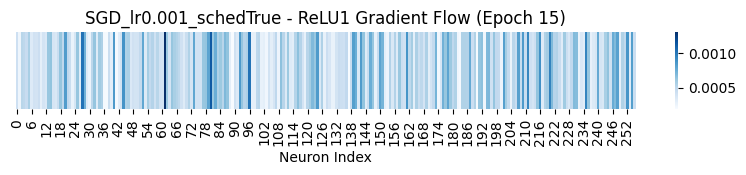

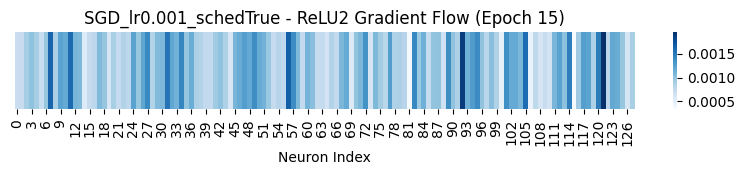

[SGD_lr0.001_schedTrue] Epoch 16 | Loss: 0.9165 | Acc: 67.67%
[SGD_lr0.001_schedTrue] Epoch 17 | Loss: 0.9054 | Acc: 68.00%
[SGD_lr0.001_schedTrue] Epoch 18 | Loss: 0.8960 | Acc: 68.28%
[SGD_lr0.001_schedTrue] Epoch 19 | Loss: 0.8877 | Acc: 68.57%
[SGD_lr0.001_schedTrue] Epoch 20 | Loss: 0.8807 | Acc: 68.72%
[SGD_lr0.001_schedTrue] Epoch 21 | Loss: 0.8743 | Acc: 68.98%
[SGD_lr0.001_schedTrue] Epoch 22 | Loss: 0.8688 | Acc: 69.04%
[SGD_lr0.001_schedTrue] Epoch 23 | Loss: 0.8641 | Acc: 69.23%
[SGD_lr0.001_schedTrue] Epoch 24 | Loss: 0.8599 | Acc: 69.35%
[SGD_lr0.001_schedTrue] Epoch 25 | Loss: 0.8562 | Acc: 69.47%
[SGD_lr0.001_schedTrue] Epoch 26 | Loss: 0.8527 | Acc: 69.56%
[SGD_lr0.001_schedTrue] Epoch 27 | Loss: 0.8499 | Acc: 69.66%
[SGD_lr0.001_schedTrue] Epoch 28 | Loss: 0.8473 | Acc: 69.74%
[SGD_lr0.001_schedTrue] Epoch 29 | Loss: 0.8450 | Acc: 69.81%
[SGD_lr0.001_schedTrue] Epoch 30 | Loss: 0.8427 | Acc: 69.89%

[Epoch 30] Activation & Gradient Visualization


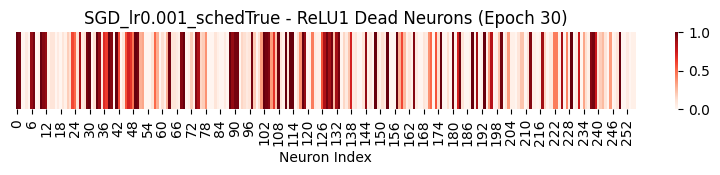

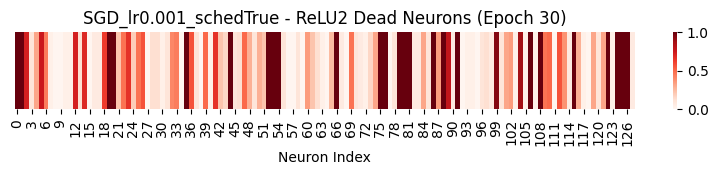

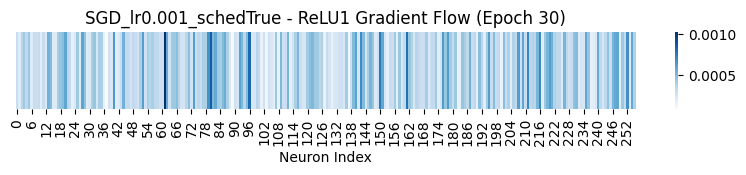

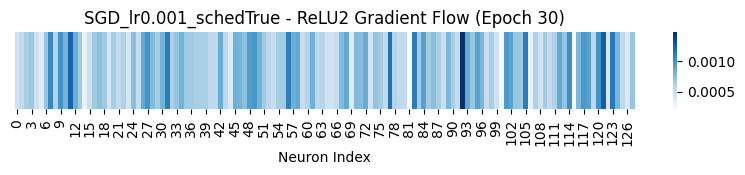


🔍 실험 시작: SGD+Momentum_lr0.1_schedFalse
[SGD+Momentum_lr0.1_schedFalse] Epoch 01 | Loss: 0.6068 | Acc: 77.71%

[Epoch 1] Activation & Gradient Visualization


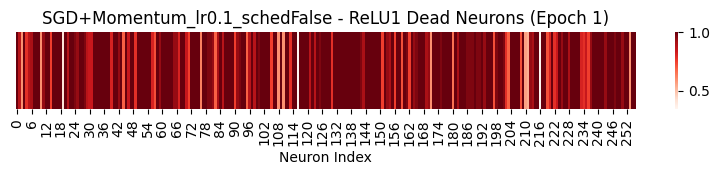

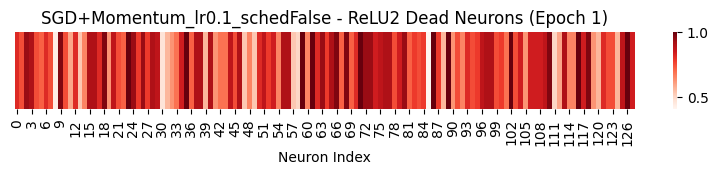

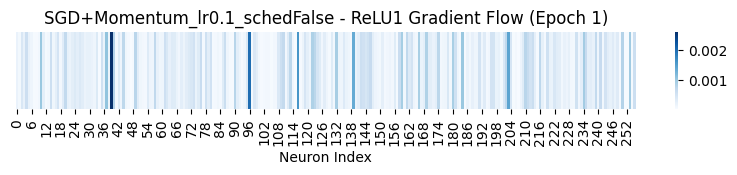

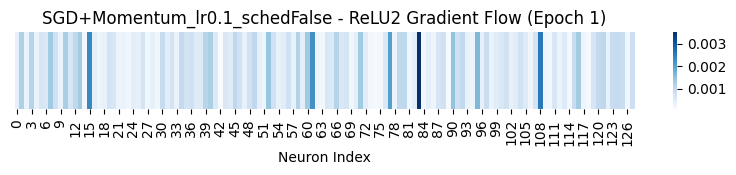

[SGD+Momentum_lr0.1_schedFalse] Epoch 02 | Loss: 0.4761 | Acc: 82.81%
[SGD+Momentum_lr0.1_schedFalse] Epoch 03 | Loss: 0.4289 | Acc: 84.38%
[SGD+Momentum_lr0.1_schedFalse] Epoch 04 | Loss: 0.3956 | Acc: 85.46%
[SGD+Momentum_lr0.1_schedFalse] Epoch 05 | Loss: 0.3806 | Acc: 86.12%
[SGD+Momentum_lr0.1_schedFalse] Epoch 06 | Loss: 0.3796 | Acc: 86.26%
[SGD+Momentum_lr0.1_schedFalse] Epoch 07 | Loss: 0.3653 | Acc: 86.73%
[SGD+Momentum_lr0.1_schedFalse] Epoch 08 | Loss: 0.3568 | Acc: 87.13%
[SGD+Momentum_lr0.1_schedFalse] Epoch 09 | Loss: 0.3443 | Acc: 87.60%
[SGD+Momentum_lr0.1_schedFalse] Epoch 10 | Loss: 0.3441 | Acc: 87.44%
[SGD+Momentum_lr0.1_schedFalse] Epoch 11 | Loss: 0.3460 | Acc: 87.42%
[SGD+Momentum_lr0.1_schedFalse] Epoch 12 | Loss: 0.3367 | Acc: 87.64%
[SGD+Momentum_lr0.1_schedFalse] Epoch 13 | Loss: 0.3283 | Acc: 88.03%
[SGD+Momentum_lr0.1_schedFalse] Epoch 14 | Loss: 0.3279 | Acc: 88.23%
[SGD+Momentum_lr0.1_schedFalse] Epoch 15 | Loss: 0.3207 | Acc: 88.31%

[Epoch 15] Activati

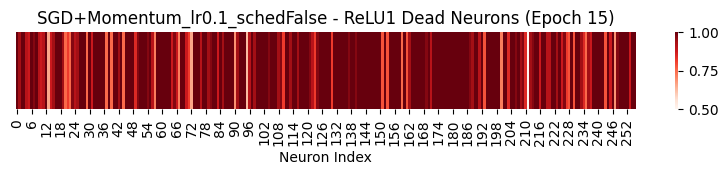

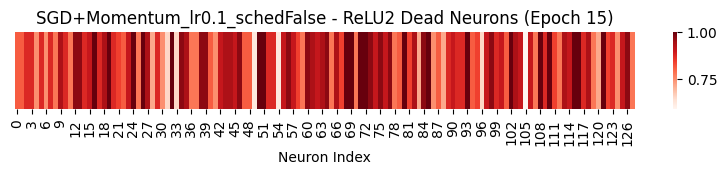

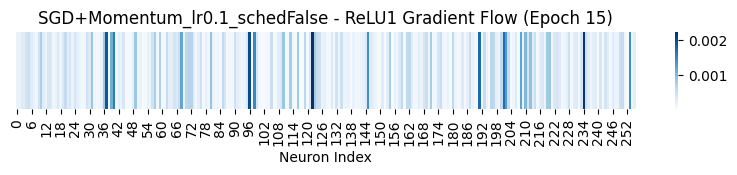

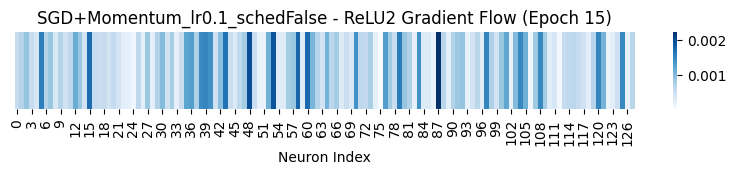

[SGD+Momentum_lr0.1_schedFalse] Epoch 16 | Loss: 0.3171 | Acc: 88.52%
[SGD+Momentum_lr0.1_schedFalse] Epoch 17 | Loss: 0.3142 | Acc: 88.54%
[SGD+Momentum_lr0.1_schedFalse] Epoch 18 | Loss: 0.3065 | Acc: 88.79%
[SGD+Momentum_lr0.1_schedFalse] Epoch 19 | Loss: 0.3005 | Acc: 89.05%
[SGD+Momentum_lr0.1_schedFalse] Epoch 20 | Loss: 0.2944 | Acc: 89.32%
[SGD+Momentum_lr0.1_schedFalse] Epoch 21 | Loss: 0.3014 | Acc: 89.05%
[SGD+Momentum_lr0.1_schedFalse] Epoch 22 | Loss: 0.2986 | Acc: 89.31%
[SGD+Momentum_lr0.1_schedFalse] Epoch 23 | Loss: 0.2907 | Acc: 89.44%
[SGD+Momentum_lr0.1_schedFalse] Epoch 24 | Loss: 0.2861 | Acc: 89.65%
[SGD+Momentum_lr0.1_schedFalse] Epoch 25 | Loss: 0.2905 | Acc: 89.47%
[SGD+Momentum_lr0.1_schedFalse] Epoch 26 | Loss: 0.2810 | Acc: 89.73%
[SGD+Momentum_lr0.1_schedFalse] Epoch 27 | Loss: 0.2801 | Acc: 89.86%
[SGD+Momentum_lr0.1_schedFalse] Epoch 28 | Loss: 0.2729 | Acc: 90.11%
[SGD+Momentum_lr0.1_schedFalse] Epoch 29 | Loss: 0.2775 | Acc: 90.08%
[SGD+Momentum_lr0.1_

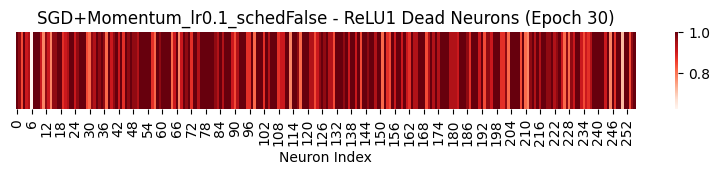

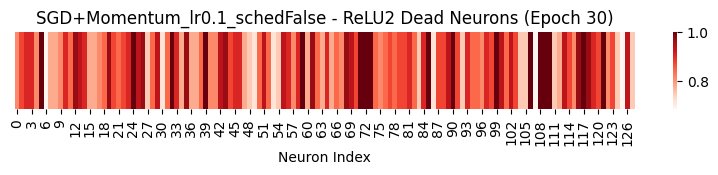

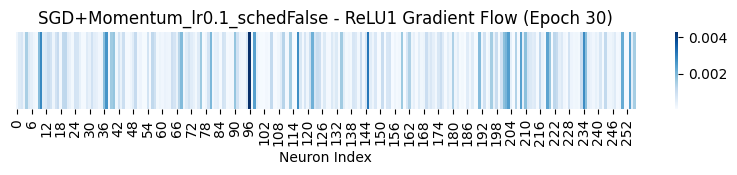

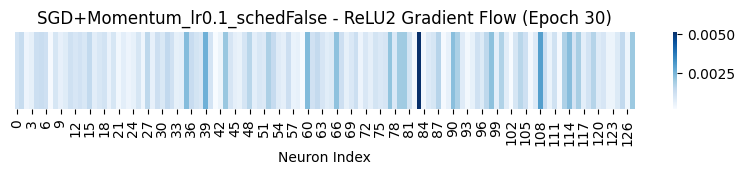


🔍 실험 시작: SGD+Momentum_lr0.1_schedTrue
[SGD+Momentum_lr0.1_schedTrue] Epoch 01 | Loss: 0.6162 | Acc: 77.59%

[Epoch 1] Activation & Gradient Visualization


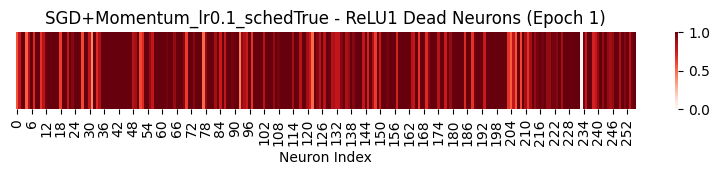

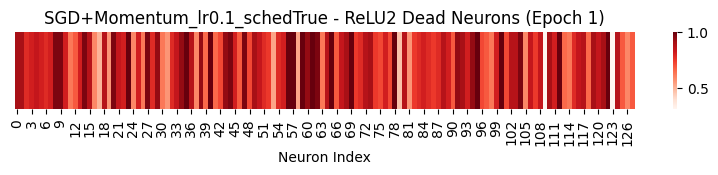

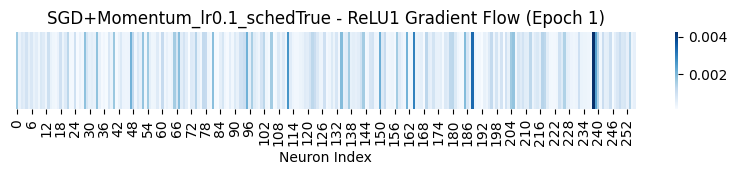

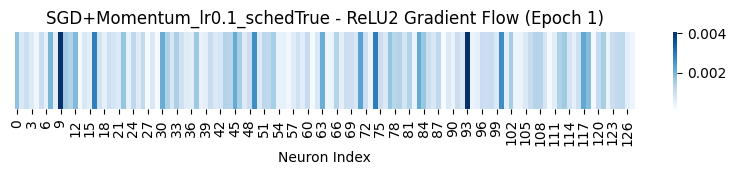

[SGD+Momentum_lr0.1_schedTrue] Epoch 02 | Loss: 0.4554 | Acc: 83.45%
[SGD+Momentum_lr0.1_schedTrue] Epoch 03 | Loss: 0.4041 | Acc: 85.39%
[SGD+Momentum_lr0.1_schedTrue] Epoch 04 | Loss: 0.3768 | Acc: 86.06%
[SGD+Momentum_lr0.1_schedTrue] Epoch 05 | Loss: 0.3487 | Acc: 87.00%
[SGD+Momentum_lr0.1_schedTrue] Epoch 06 | Loss: 0.3286 | Acc: 87.78%
[SGD+Momentum_lr0.1_schedTrue] Epoch 07 | Loss: 0.3123 | Acc: 88.47%
[SGD+Momentum_lr0.1_schedTrue] Epoch 08 | Loss: 0.2947 | Acc: 88.94%
[SGD+Momentum_lr0.1_schedTrue] Epoch 09 | Loss: 0.2836 | Acc: 89.29%
[SGD+Momentum_lr0.1_schedTrue] Epoch 10 | Loss: 0.2706 | Acc: 89.78%
[SGD+Momentum_lr0.1_schedTrue] Epoch 11 | Loss: 0.2587 | Acc: 90.22%
[SGD+Momentum_lr0.1_schedTrue] Epoch 12 | Loss: 0.2515 | Acc: 90.50%
[SGD+Momentum_lr0.1_schedTrue] Epoch 13 | Loss: 0.2410 | Acc: 90.89%
[SGD+Momentum_lr0.1_schedTrue] Epoch 14 | Loss: 0.2340 | Acc: 91.11%
[SGD+Momentum_lr0.1_schedTrue] Epoch 15 | Loss: 0.2257 | Acc: 91.35%

[Epoch 15] Activation & Gradient 

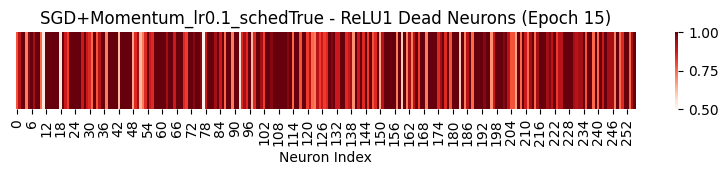

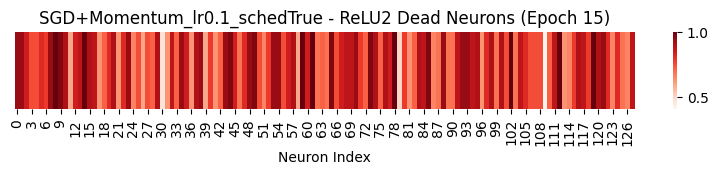

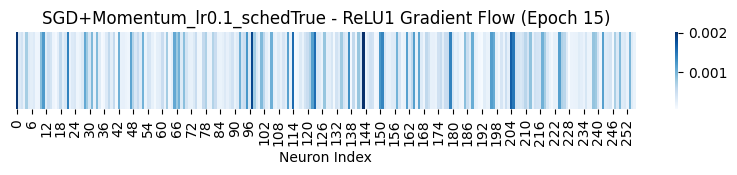

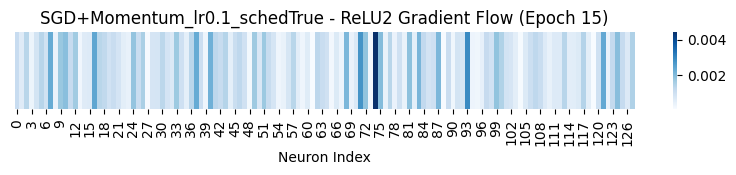

[SGD+Momentum_lr0.1_schedTrue] Epoch 16 | Loss: 0.2194 | Acc: 91.67%
[SGD+Momentum_lr0.1_schedTrue] Epoch 17 | Loss: 0.2136 | Acc: 91.91%
[SGD+Momentum_lr0.1_schedTrue] Epoch 18 | Loss: 0.2060 | Acc: 92.15%
[SGD+Momentum_lr0.1_schedTrue] Epoch 19 | Loss: 0.2029 | Acc: 92.35%
[SGD+Momentum_lr0.1_schedTrue] Epoch 20 | Loss: 0.1965 | Acc: 92.48%
[SGD+Momentum_lr0.1_schedTrue] Epoch 21 | Loss: 0.1911 | Acc: 92.71%
[SGD+Momentum_lr0.1_schedTrue] Epoch 22 | Loss: 0.1872 | Acc: 92.83%
[SGD+Momentum_lr0.1_schedTrue] Epoch 23 | Loss: 0.1832 | Acc: 92.98%
[SGD+Momentum_lr0.1_schedTrue] Epoch 24 | Loss: 0.1786 | Acc: 93.25%
[SGD+Momentum_lr0.1_schedTrue] Epoch 25 | Loss: 0.1754 | Acc: 93.34%
[SGD+Momentum_lr0.1_schedTrue] Epoch 26 | Loss: 0.1723 | Acc: 93.47%
[SGD+Momentum_lr0.1_schedTrue] Epoch 27 | Loss: 0.1699 | Acc: 93.55%
[SGD+Momentum_lr0.1_schedTrue] Epoch 28 | Loss: 0.1669 | Acc: 93.64%
[SGD+Momentum_lr0.1_schedTrue] Epoch 29 | Loss: 0.1637 | Acc: 93.85%
[SGD+Momentum_lr0.1_schedTrue] Epo

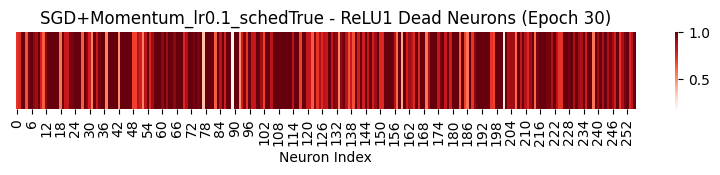

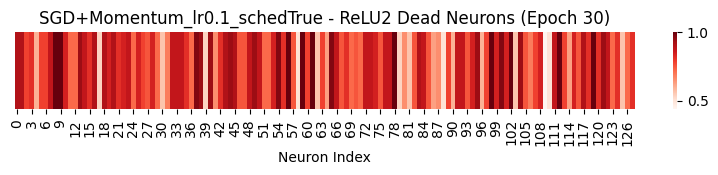

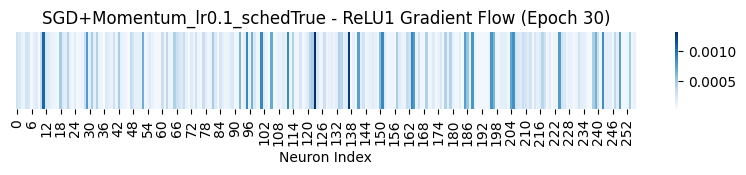

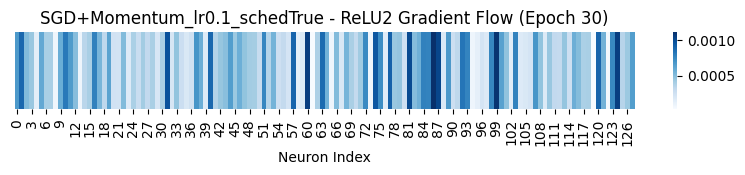


🔍 실험 시작: SGD+Momentum_lr0.01_schedFalse
[SGD+Momentum_lr0.01_schedFalse] Epoch 01 | Loss: 0.6829 | Acc: 75.82%

[Epoch 1] Activation & Gradient Visualization


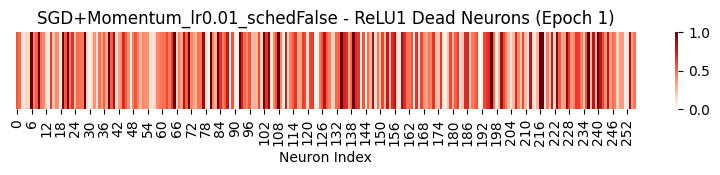

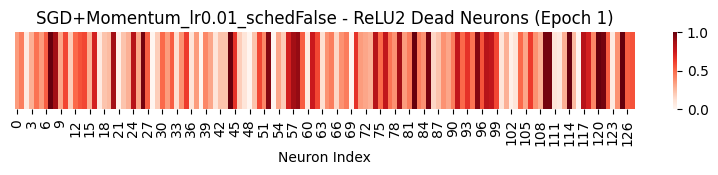

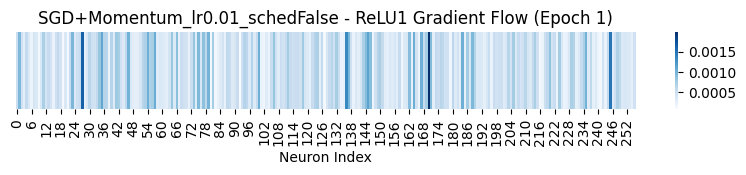

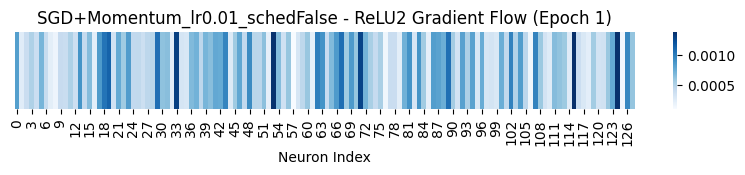

[SGD+Momentum_lr0.01_schedFalse] Epoch 02 | Loss: 0.4269 | Acc: 84.71%
[SGD+Momentum_lr0.01_schedFalse] Epoch 03 | Loss: 0.3755 | Acc: 86.42%
[SGD+Momentum_lr0.01_schedFalse] Epoch 04 | Loss: 0.3501 | Acc: 87.17%
[SGD+Momentum_lr0.01_schedFalse] Epoch 05 | Loss: 0.3267 | Acc: 88.06%
[SGD+Momentum_lr0.01_schedFalse] Epoch 06 | Loss: 0.3108 | Acc: 88.55%
[SGD+Momentum_lr0.01_schedFalse] Epoch 07 | Loss: 0.2950 | Acc: 89.13%
[SGD+Momentum_lr0.01_schedFalse] Epoch 08 | Loss: 0.2850 | Acc: 89.37%
[SGD+Momentum_lr0.01_schedFalse] Epoch 09 | Loss: 0.2747 | Acc: 89.71%
[SGD+Momentum_lr0.01_schedFalse] Epoch 10 | Loss: 0.2662 | Acc: 90.10%
[SGD+Momentum_lr0.01_schedFalse] Epoch 11 | Loss: 0.2561 | Acc: 90.55%
[SGD+Momentum_lr0.01_schedFalse] Epoch 12 | Loss: 0.2496 | Acc: 90.69%
[SGD+Momentum_lr0.01_schedFalse] Epoch 13 | Loss: 0.2425 | Acc: 91.01%
[SGD+Momentum_lr0.01_schedFalse] Epoch 14 | Loss: 0.2349 | Acc: 91.14%
[SGD+Momentum_lr0.01_schedFalse] Epoch 15 | Loss: 0.2278 | Acc: 91.46%

[Epoc

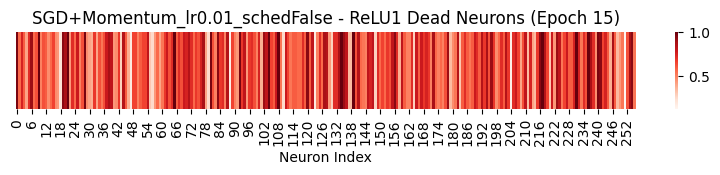

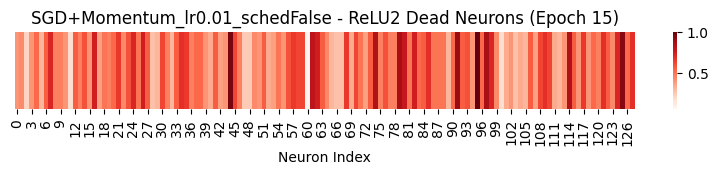

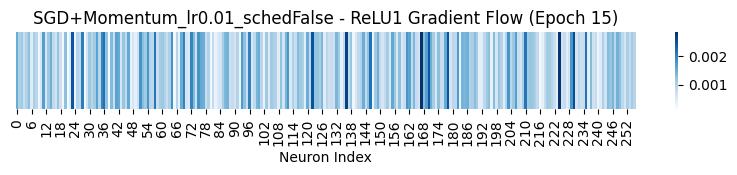

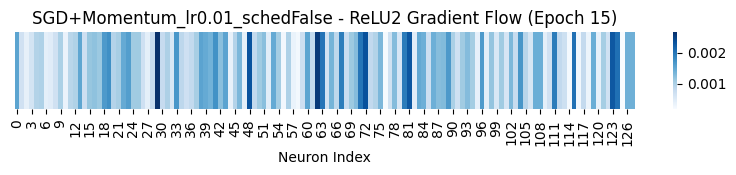

[SGD+Momentum_lr0.01_schedFalse] Epoch 16 | Loss: 0.2210 | Acc: 91.76%
[SGD+Momentum_lr0.01_schedFalse] Epoch 17 | Loss: 0.2168 | Acc: 91.86%
[SGD+Momentum_lr0.01_schedFalse] Epoch 18 | Loss: 0.2095 | Acc: 92.10%
[SGD+Momentum_lr0.01_schedFalse] Epoch 19 | Loss: 0.2061 | Acc: 92.30%
[SGD+Momentum_lr0.01_schedFalse] Epoch 20 | Loss: 0.1983 | Acc: 92.61%
[SGD+Momentum_lr0.01_schedFalse] Epoch 21 | Loss: 0.1950 | Acc: 92.68%
[SGD+Momentum_lr0.01_schedFalse] Epoch 22 | Loss: 0.1900 | Acc: 93.06%
[SGD+Momentum_lr0.01_schedFalse] Epoch 23 | Loss: 0.1849 | Acc: 93.03%
[SGD+Momentum_lr0.01_schedFalse] Epoch 24 | Loss: 0.1823 | Acc: 93.23%
[SGD+Momentum_lr0.01_schedFalse] Epoch 25 | Loss: 0.1781 | Acc: 93.31%
[SGD+Momentum_lr0.01_schedFalse] Epoch 26 | Loss: 0.1717 | Acc: 93.50%
[SGD+Momentum_lr0.01_schedFalse] Epoch 27 | Loss: 0.1658 | Acc: 93.80%
[SGD+Momentum_lr0.01_schedFalse] Epoch 28 | Loss: 0.1623 | Acc: 93.97%
[SGD+Momentum_lr0.01_schedFalse] Epoch 29 | Loss: 0.1604 | Acc: 93.90%
[SGD+M

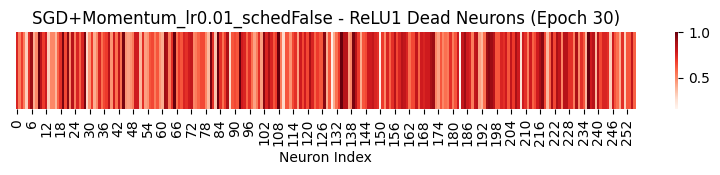

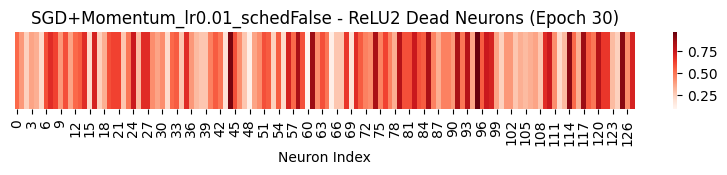

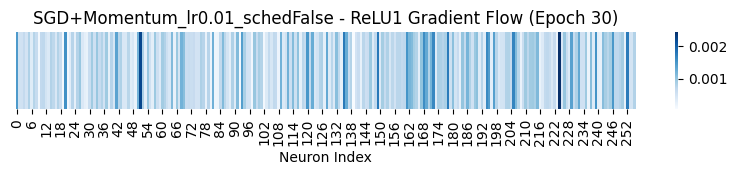

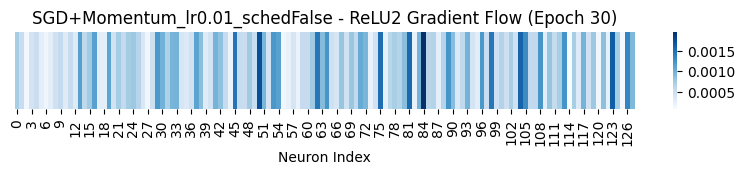


🔍 실험 시작: SGD+Momentum_lr0.01_schedTrue
[SGD+Momentum_lr0.01_schedTrue] Epoch 01 | Loss: 0.6868 | Acc: 75.80%

[Epoch 1] Activation & Gradient Visualization


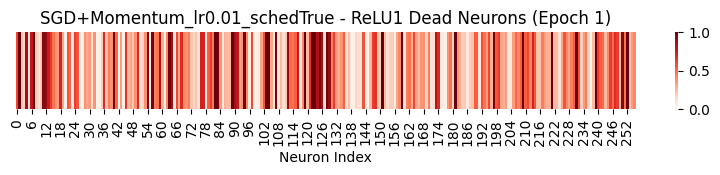

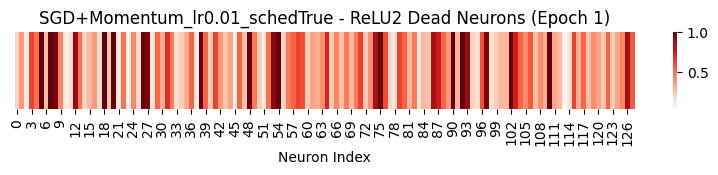

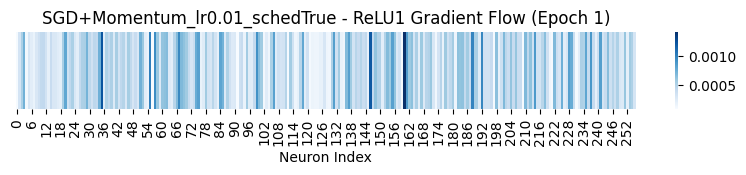

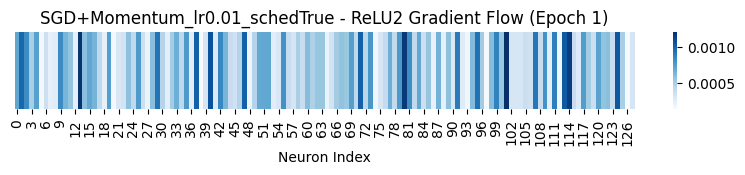

[SGD+Momentum_lr0.01_schedTrue] Epoch 02 | Loss: 0.4283 | Acc: 84.56%
[SGD+Momentum_lr0.01_schedTrue] Epoch 03 | Loss: 0.3796 | Acc: 86.38%
[SGD+Momentum_lr0.01_schedTrue] Epoch 04 | Loss: 0.3490 | Acc: 87.30%
[SGD+Momentum_lr0.01_schedTrue] Epoch 05 | Loss: 0.3298 | Acc: 87.92%
[SGD+Momentum_lr0.01_schedTrue] Epoch 06 | Loss: 0.3121 | Acc: 88.61%
[SGD+Momentum_lr0.01_schedTrue] Epoch 07 | Loss: 0.2985 | Acc: 89.03%
[SGD+Momentum_lr0.01_schedTrue] Epoch 08 | Loss: 0.2866 | Acc: 89.59%
[SGD+Momentum_lr0.01_schedTrue] Epoch 09 | Loss: 0.2756 | Acc: 89.90%
[SGD+Momentum_lr0.01_schedTrue] Epoch 10 | Loss: 0.2691 | Acc: 90.19%
[SGD+Momentum_lr0.01_schedTrue] Epoch 11 | Loss: 0.2591 | Acc: 90.51%
[SGD+Momentum_lr0.01_schedTrue] Epoch 12 | Loss: 0.2534 | Acc: 90.73%
[SGD+Momentum_lr0.01_schedTrue] Epoch 13 | Loss: 0.2445 | Acc: 90.94%
[SGD+Momentum_lr0.01_schedTrue] Epoch 14 | Loss: 0.2399 | Acc: 91.18%
[SGD+Momentum_lr0.01_schedTrue] Epoch 15 | Loss: 0.2352 | Acc: 91.44%

[Epoch 15] Activati

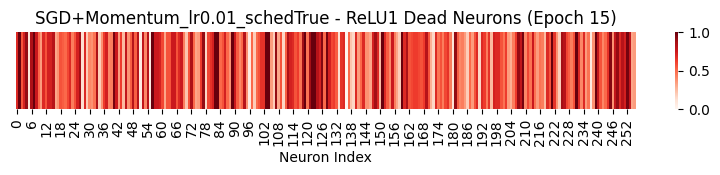

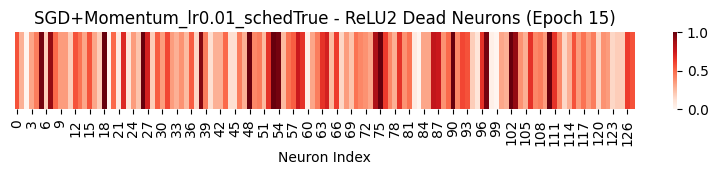

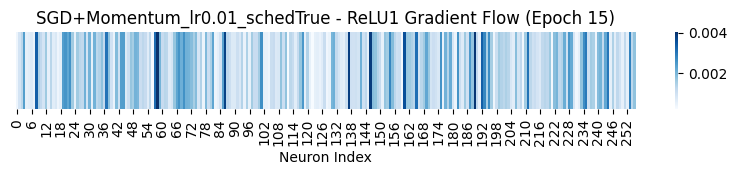

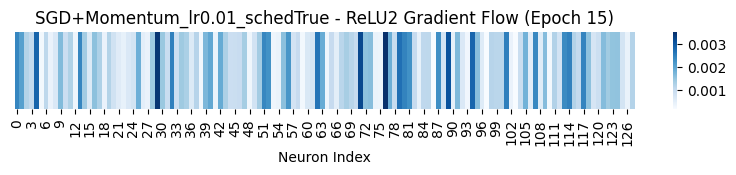

[SGD+Momentum_lr0.01_schedTrue] Epoch 16 | Loss: 0.2301 | Acc: 91.56%
[SGD+Momentum_lr0.01_schedTrue] Epoch 17 | Loss: 0.2245 | Acc: 91.87%
[SGD+Momentum_lr0.01_schedTrue] Epoch 18 | Loss: 0.2203 | Acc: 91.98%
[SGD+Momentum_lr0.01_schedTrue] Epoch 19 | Loss: 0.2174 | Acc: 92.05%
[SGD+Momentum_lr0.01_schedTrue] Epoch 20 | Loss: 0.2142 | Acc: 92.19%
[SGD+Momentum_lr0.01_schedTrue] Epoch 21 | Loss: 0.2108 | Acc: 92.31%
[SGD+Momentum_lr0.01_schedTrue] Epoch 22 | Loss: 0.2078 | Acc: 92.38%
[SGD+Momentum_lr0.01_schedTrue] Epoch 23 | Loss: 0.2053 | Acc: 92.55%
[SGD+Momentum_lr0.01_schedTrue] Epoch 24 | Loss: 0.2033 | Acc: 92.67%
[SGD+Momentum_lr0.01_schedTrue] Epoch 25 | Loss: 0.2007 | Acc: 92.77%
[SGD+Momentum_lr0.01_schedTrue] Epoch 26 | Loss: 0.1984 | Acc: 92.82%
[SGD+Momentum_lr0.01_schedTrue] Epoch 27 | Loss: 0.1969 | Acc: 92.90%
[SGD+Momentum_lr0.01_schedTrue] Epoch 28 | Loss: 0.1950 | Acc: 93.00%
[SGD+Momentum_lr0.01_schedTrue] Epoch 29 | Loss: 0.1935 | Acc: 93.01%
[SGD+Momentum_lr0.01

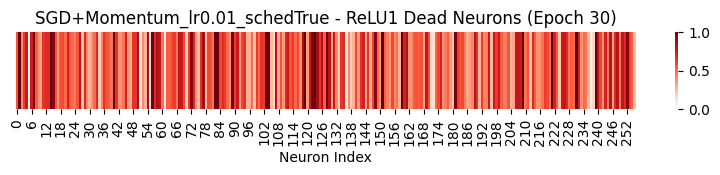

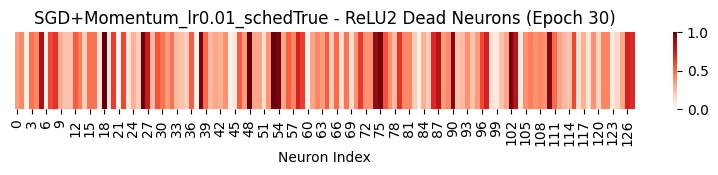

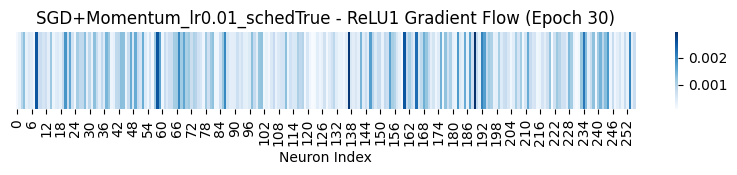

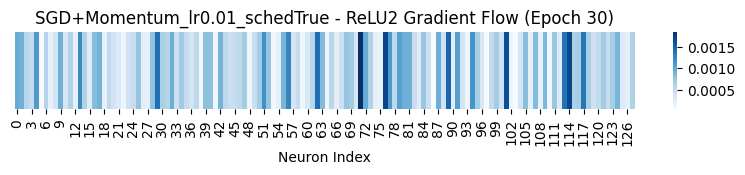


🔍 실험 시작: SGD+Momentum_lr0.001_schedFalse
[SGD+Momentum_lr0.001_schedFalse] Epoch 01 | Loss: 1.4267 | Acc: 54.48%

[Epoch 1] Activation & Gradient Visualization


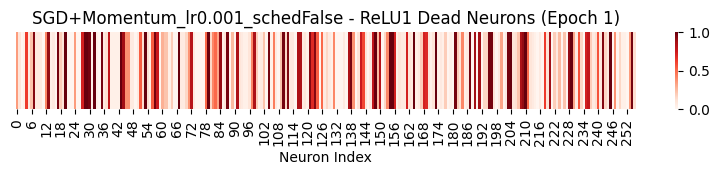

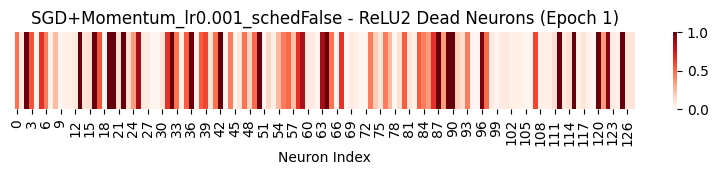

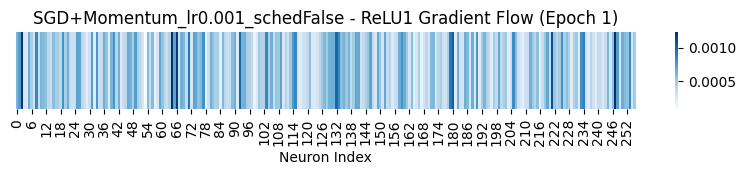

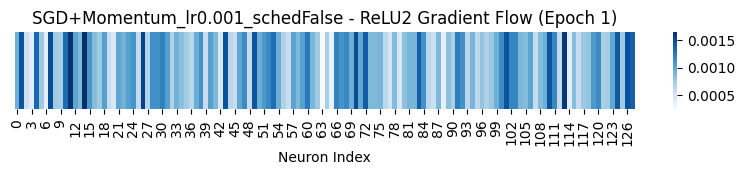

[SGD+Momentum_lr0.001_schedFalse] Epoch 02 | Loss: 0.7302 | Acc: 73.07%
[SGD+Momentum_lr0.001_schedFalse] Epoch 03 | Loss: 0.6025 | Acc: 79.14%
[SGD+Momentum_lr0.001_schedFalse] Epoch 04 | Loss: 0.5364 | Acc: 81.47%
[SGD+Momentum_lr0.001_schedFalse] Epoch 05 | Loss: 0.4998 | Acc: 82.63%
[SGD+Momentum_lr0.001_schedFalse] Epoch 06 | Loss: 0.4750 | Acc: 83.42%
[SGD+Momentum_lr0.001_schedFalse] Epoch 07 | Loss: 0.4585 | Acc: 83.94%
[SGD+Momentum_lr0.001_schedFalse] Epoch 08 | Loss: 0.4438 | Acc: 84.42%
[SGD+Momentum_lr0.001_schedFalse] Epoch 09 | Loss: 0.4325 | Acc: 84.94%
[SGD+Momentum_lr0.001_schedFalse] Epoch 10 | Loss: 0.4219 | Acc: 85.27%
[SGD+Momentum_lr0.001_schedFalse] Epoch 11 | Loss: 0.4138 | Acc: 85.65%
[SGD+Momentum_lr0.001_schedFalse] Epoch 12 | Loss: 0.4068 | Acc: 85.76%
[SGD+Momentum_lr0.001_schedFalse] Epoch 13 | Loss: 0.3975 | Acc: 86.17%
[SGD+Momentum_lr0.001_schedFalse] Epoch 14 | Loss: 0.3915 | Acc: 86.33%
[SGD+Momentum_lr0.001_schedFalse] Epoch 15 | Loss: 0.3848 | Acc:

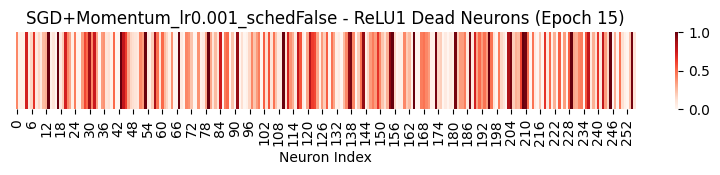

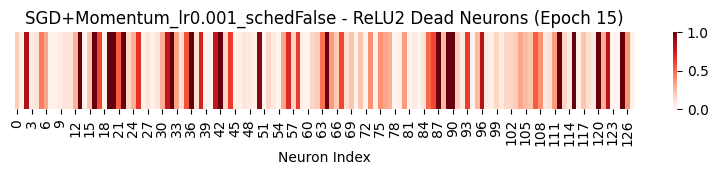

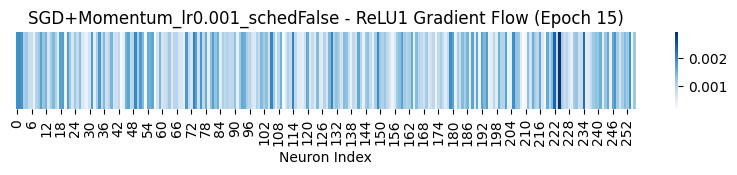

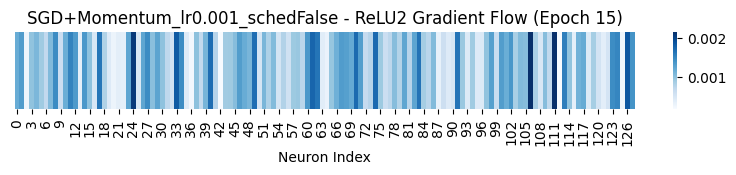

[SGD+Momentum_lr0.001_schedFalse] Epoch 16 | Loss: 0.3793 | Acc: 86.73%
[SGD+Momentum_lr0.001_schedFalse] Epoch 17 | Loss: 0.3741 | Acc: 86.86%
[SGD+Momentum_lr0.001_schedFalse] Epoch 18 | Loss: 0.3672 | Acc: 87.15%
[SGD+Momentum_lr0.001_schedFalse] Epoch 19 | Loss: 0.3607 | Acc: 87.37%
[SGD+Momentum_lr0.001_schedFalse] Epoch 20 | Loss: 0.3562 | Acc: 87.46%
[SGD+Momentum_lr0.001_schedFalse] Epoch 21 | Loss: 0.3513 | Acc: 87.66%
[SGD+Momentum_lr0.001_schedFalse] Epoch 22 | Loss: 0.3474 | Acc: 87.75%
[SGD+Momentum_lr0.001_schedFalse] Epoch 23 | Loss: 0.3433 | Acc: 87.87%
[SGD+Momentum_lr0.001_schedFalse] Epoch 24 | Loss: 0.3378 | Acc: 88.14%
[SGD+Momentum_lr0.001_schedFalse] Epoch 25 | Loss: 0.3354 | Acc: 88.16%
[SGD+Momentum_lr0.001_schedFalse] Epoch 26 | Loss: 0.3307 | Acc: 88.18%
[SGD+Momentum_lr0.001_schedFalse] Epoch 27 | Loss: 0.3248 | Acc: 88.54%
[SGD+Momentum_lr0.001_schedFalse] Epoch 28 | Loss: 0.3216 | Acc: 88.69%
[SGD+Momentum_lr0.001_schedFalse] Epoch 29 | Loss: 0.3193 | Acc:

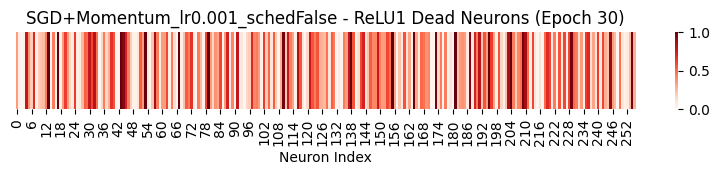

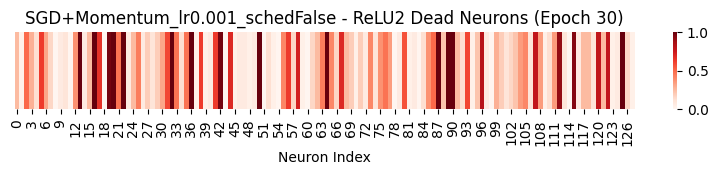

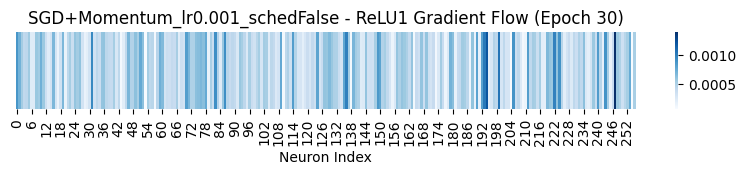

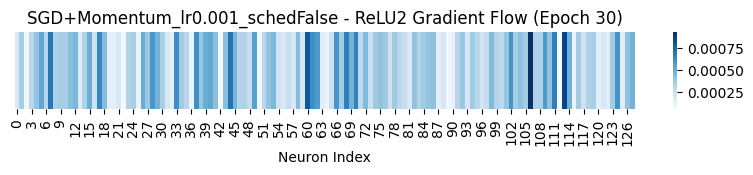


🔍 실험 시작: SGD+Momentum_lr0.001_schedTrue
[SGD+Momentum_lr0.001_schedTrue] Epoch 01 | Loss: 1.4412 | Acc: 57.28%

[Epoch 1] Activation & Gradient Visualization


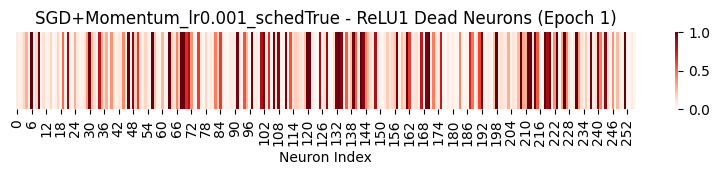

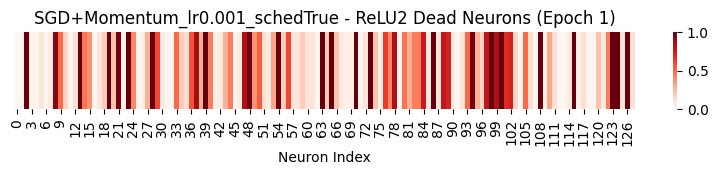

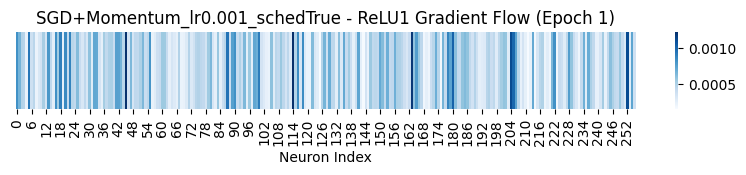

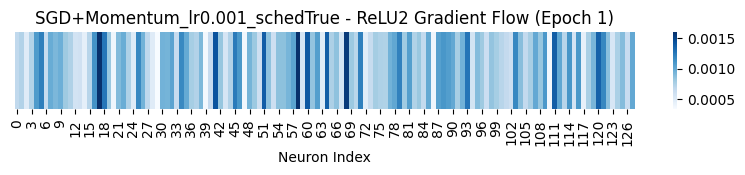

[SGD+Momentum_lr0.001_schedTrue] Epoch 02 | Loss: 0.7335 | Acc: 73.08%
[SGD+Momentum_lr0.001_schedTrue] Epoch 03 | Loss: 0.6193 | Acc: 78.25%
[SGD+Momentum_lr0.001_schedTrue] Epoch 04 | Loss: 0.5608 | Acc: 80.70%
[SGD+Momentum_lr0.001_schedTrue] Epoch 05 | Loss: 0.5252 | Acc: 81.83%
[SGD+Momentum_lr0.001_schedTrue] Epoch 06 | Loss: 0.5009 | Acc: 82.61%
[SGD+Momentum_lr0.001_schedTrue] Epoch 07 | Loss: 0.4857 | Acc: 83.09%
[SGD+Momentum_lr0.001_schedTrue] Epoch 08 | Loss: 0.4732 | Acc: 83.52%
[SGD+Momentum_lr0.001_schedTrue] Epoch 09 | Loss: 0.4638 | Acc: 83.86%
[SGD+Momentum_lr0.001_schedTrue] Epoch 10 | Loss: 0.4564 | Acc: 84.12%
[SGD+Momentum_lr0.001_schedTrue] Epoch 11 | Loss: 0.4503 | Acc: 84.28%
[SGD+Momentum_lr0.001_schedTrue] Epoch 12 | Loss: 0.4452 | Acc: 84.45%
[SGD+Momentum_lr0.001_schedTrue] Epoch 13 | Loss: 0.4408 | Acc: 84.73%
[SGD+Momentum_lr0.001_schedTrue] Epoch 14 | Loss: 0.4370 | Acc: 84.80%
[SGD+Momentum_lr0.001_schedTrue] Epoch 15 | Loss: 0.4344 | Acc: 84.88%

[Epoc

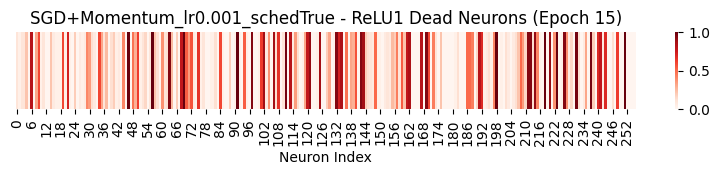

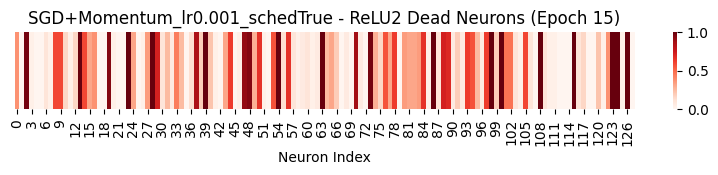

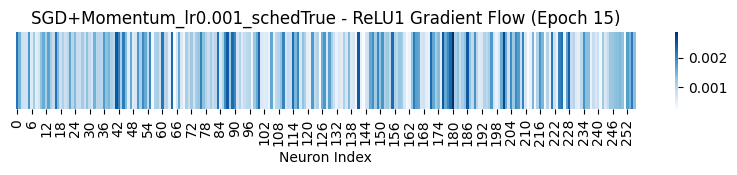

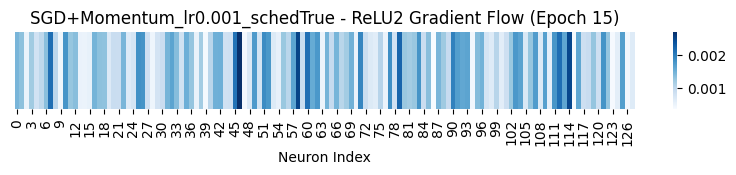

[SGD+Momentum_lr0.001_schedTrue] Epoch 16 | Loss: 0.4311 | Acc: 85.02%
[SGD+Momentum_lr0.001_schedTrue] Epoch 17 | Loss: 0.4288 | Acc: 85.11%
[SGD+Momentum_lr0.001_schedTrue] Epoch 18 | Loss: 0.4267 | Acc: 85.24%
[SGD+Momentum_lr0.001_schedTrue] Epoch 19 | Loss: 0.4248 | Acc: 85.23%
[SGD+Momentum_lr0.001_schedTrue] Epoch 20 | Loss: 0.4230 | Acc: 85.30%
[SGD+Momentum_lr0.001_schedTrue] Epoch 21 | Loss: 0.4216 | Acc: 85.43%
[SGD+Momentum_lr0.001_schedTrue] Epoch 22 | Loss: 0.4204 | Acc: 85.41%
[SGD+Momentum_lr0.001_schedTrue] Epoch 23 | Loss: 0.4192 | Acc: 85.45%
[SGD+Momentum_lr0.001_schedTrue] Epoch 24 | Loss: 0.4181 | Acc: 85.47%
[SGD+Momentum_lr0.001_schedTrue] Epoch 25 | Loss: 0.4172 | Acc: 85.56%
[SGD+Momentum_lr0.001_schedTrue] Epoch 26 | Loss: 0.4163 | Acc: 85.61%
[SGD+Momentum_lr0.001_schedTrue] Epoch 27 | Loss: 0.4157 | Acc: 85.63%
[SGD+Momentum_lr0.001_schedTrue] Epoch 28 | Loss: 0.4149 | Acc: 85.64%
[SGD+Momentum_lr0.001_schedTrue] Epoch 29 | Loss: 0.4143 | Acc: 85.65%
[SGD+M

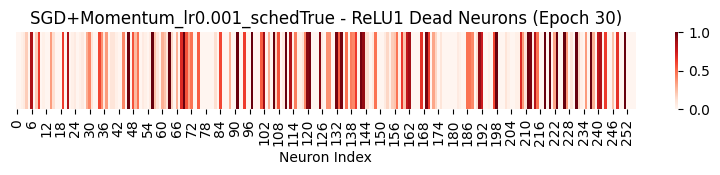

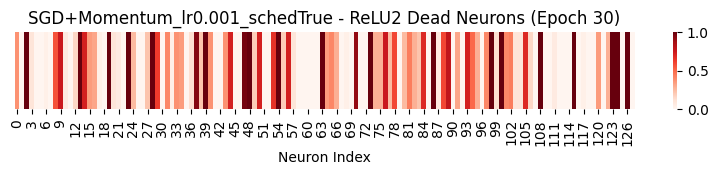

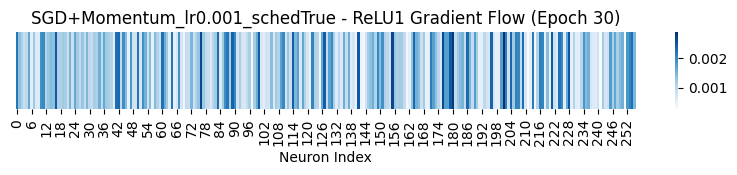

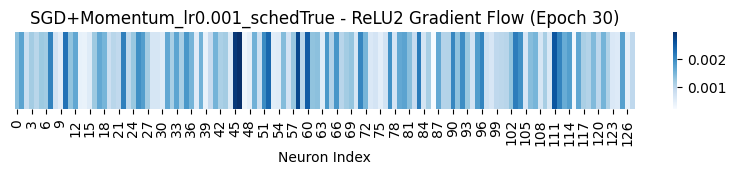


🔍 실험 시작: Adam_lr0.1_schedFalse
[Adam_lr0.1_schedFalse] Epoch 01 | Loss: 2.2481 | Acc: 29.46%

[Epoch 1] Activation & Gradient Visualization


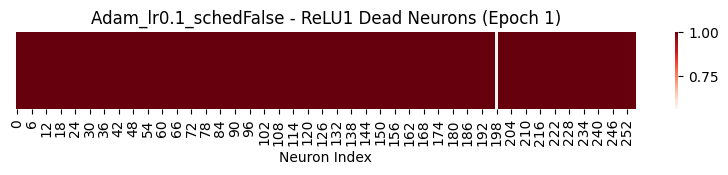

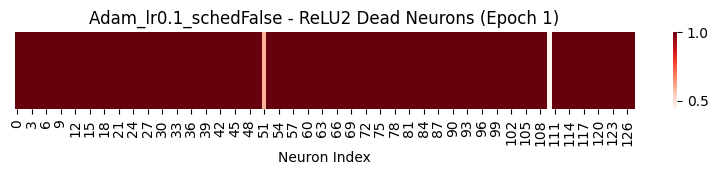

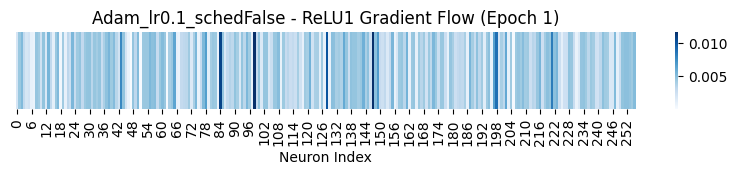

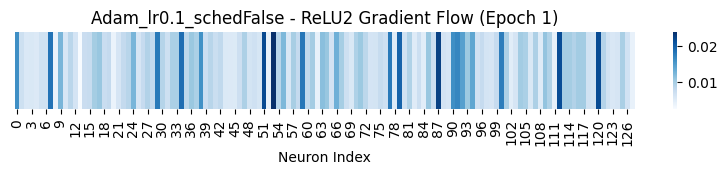

[Adam_lr0.1_schedFalse] Epoch 02 | Loss: 1.5690 | Acc: 32.77%
[Adam_lr0.1_schedFalse] Epoch 03 | Loss: 1.6728 | Acc: 26.94%
[Adam_lr0.1_schedFalse] Epoch 04 | Loss: 1.7487 | Acc: 19.76%
[Adam_lr0.1_schedFalse] Epoch 05 | Loss: 1.7448 | Acc: 19.96%
[Adam_lr0.1_schedFalse] Epoch 06 | Loss: 1.7161 | Acc: 19.88%
[Adam_lr0.1_schedFalse] Epoch 07 | Loss: 2.2367 | Acc: 18.88%
[Adam_lr0.1_schedFalse] Epoch 08 | Loss: 1.7651 | Acc: 19.66%
[Adam_lr0.1_schedFalse] Epoch 09 | Loss: 1.7314 | Acc: 19.97%
[Adam_lr0.1_schedFalse] Epoch 10 | Loss: 1.7498 | Acc: 19.69%
[Adam_lr0.1_schedFalse] Epoch 11 | Loss: 1.7164 | Acc: 19.93%
[Adam_lr0.1_schedFalse] Epoch 12 | Loss: 1.7530 | Acc: 19.95%
[Adam_lr0.1_schedFalse] Epoch 13 | Loss: 1.7876 | Acc: 19.57%
[Adam_lr0.1_schedFalse] Epoch 14 | Loss: 1.7731 | Acc: 19.65%
[Adam_lr0.1_schedFalse] Epoch 15 | Loss: 1.7632 | Acc: 19.78%

[Epoch 15] Activation & Gradient Visualization


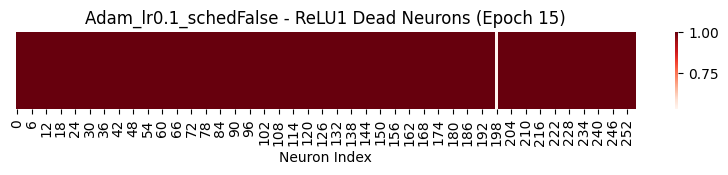

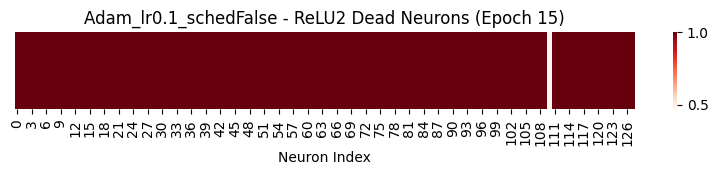

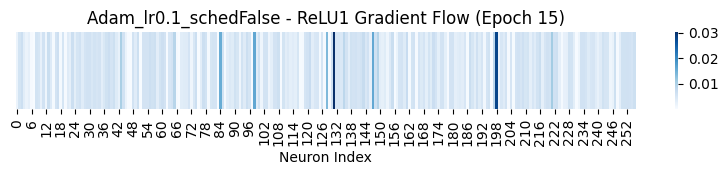

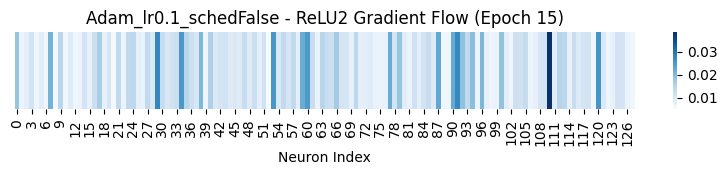

[Adam_lr0.1_schedFalse] Epoch 16 | Loss: 1.7655 | Acc: 19.62%
[Adam_lr0.1_schedFalse] Epoch 17 | Loss: 1.7644 | Acc: 19.89%
[Adam_lr0.1_schedFalse] Epoch 18 | Loss: 1.7640 | Acc: 20.06%
[Adam_lr0.1_schedFalse] Epoch 19 | Loss: 1.7642 | Acc: 19.56%
[Adam_lr0.1_schedFalse] Epoch 20 | Loss: 1.7650 | Acc: 19.86%
[Adam_lr0.1_schedFalse] Epoch 21 | Loss: 1.7627 | Acc: 19.91%
[Adam_lr0.1_schedFalse] Epoch 22 | Loss: 1.7649 | Acc: 19.79%
[Adam_lr0.1_schedFalse] Epoch 23 | Loss: 1.7627 | Acc: 19.72%
[Adam_lr0.1_schedFalse] Epoch 24 | Loss: 1.7644 | Acc: 19.65%
[Adam_lr0.1_schedFalse] Epoch 25 | Loss: 1.7661 | Acc: 19.78%
[Adam_lr0.1_schedFalse] Epoch 26 | Loss: 1.7648 | Acc: 19.48%
[Adam_lr0.1_schedFalse] Epoch 27 | Loss: 1.7650 | Acc: 19.88%
[Adam_lr0.1_schedFalse] Epoch 28 | Loss: 1.7630 | Acc: 19.89%
[Adam_lr0.1_schedFalse] Epoch 29 | Loss: 1.7630 | Acc: 19.88%
[Adam_lr0.1_schedFalse] Epoch 30 | Loss: 1.7642 | Acc: 19.83%

[Epoch 30] Activation & Gradient Visualization


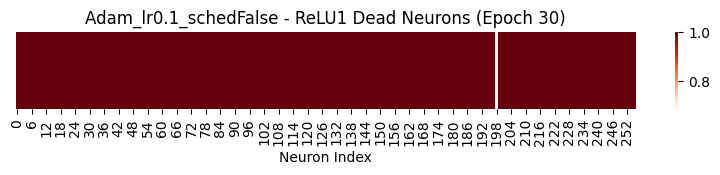

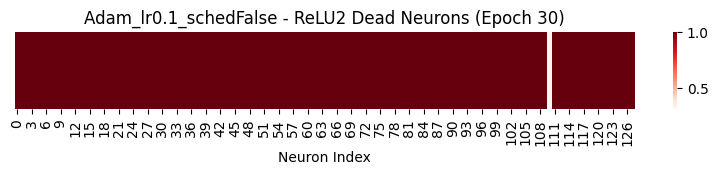

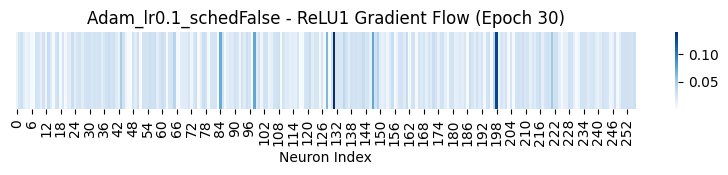

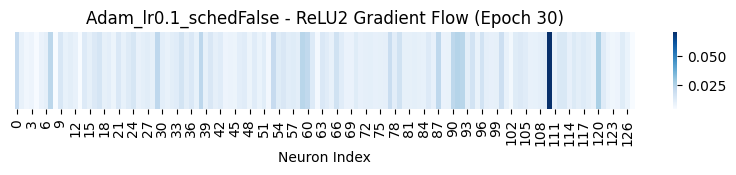


🔍 실험 시작: Adam_lr0.1_schedTrue
[Adam_lr0.1_schedTrue] Epoch 01 | Loss: 2.7476 | Acc: 23.52%

[Epoch 1] Activation & Gradient Visualization


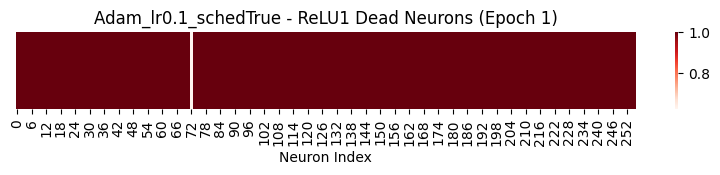

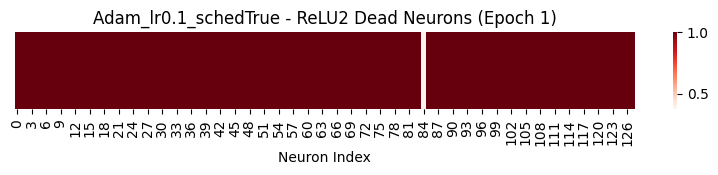

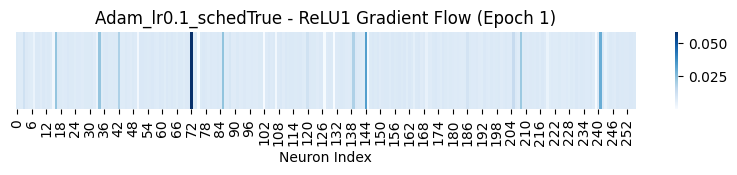

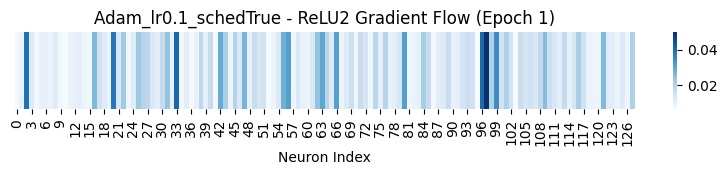

[Adam_lr0.1_schedTrue] Epoch 02 | Loss: 2.2197 | Acc: 12.25%
[Adam_lr0.1_schedTrue] Epoch 03 | Loss: 2.3162 | Acc: 10.00%
[Adam_lr0.1_schedTrue] Epoch 04 | Loss: 2.3121 | Acc: 10.04%
[Adam_lr0.1_schedTrue] Epoch 05 | Loss: 2.3107 | Acc: 10.05%
[Adam_lr0.1_schedTrue] Epoch 06 | Loss: 2.3085 | Acc: 10.04%
[Adam_lr0.1_schedTrue] Epoch 07 | Loss: 2.3073 | Acc: 10.06%
[Adam_lr0.1_schedTrue] Epoch 08 | Loss: 2.3073 | Acc: 9.98%
[Adam_lr0.1_schedTrue] Epoch 09 | Loss: 2.3062 | Acc: 9.97%
[Adam_lr0.1_schedTrue] Epoch 10 | Loss: 2.3064 | Acc: 9.94%
[Adam_lr0.1_schedTrue] Epoch 11 | Loss: 2.3058 | Acc: 9.89%
[Adam_lr0.1_schedTrue] Epoch 12 | Loss: 2.3055 | Acc: 9.93%
[Adam_lr0.1_schedTrue] Epoch 13 | Loss: 2.3050 | Acc: 10.03%
[Adam_lr0.1_schedTrue] Epoch 14 | Loss: 2.3049 | Acc: 9.91%
[Adam_lr0.1_schedTrue] Epoch 15 | Loss: 2.3045 | Acc: 9.99%

[Epoch 15] Activation & Gradient Visualization


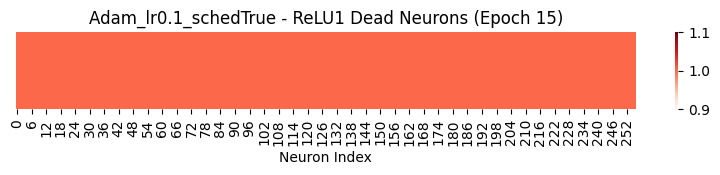

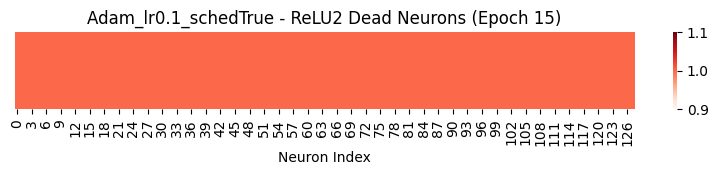

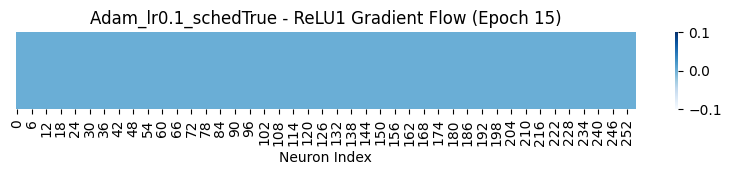

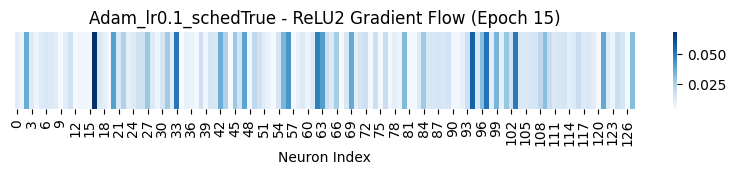

[Adam_lr0.1_schedTrue] Epoch 16 | Loss: 2.3048 | Acc: 9.89%
[Adam_lr0.1_schedTrue] Epoch 17 | Loss: 2.3044 | Acc: 9.90%
[Adam_lr0.1_schedTrue] Epoch 18 | Loss: 2.3041 | Acc: 9.80%
[Adam_lr0.1_schedTrue] Epoch 19 | Loss: 2.3040 | Acc: 9.97%
[Adam_lr0.1_schedTrue] Epoch 20 | Loss: 2.3039 | Acc: 9.85%
[Adam_lr0.1_schedTrue] Epoch 21 | Loss: 2.3040 | Acc: 9.74%
[Adam_lr0.1_schedTrue] Epoch 22 | Loss: 2.3036 | Acc: 9.90%
[Adam_lr0.1_schedTrue] Epoch 23 | Loss: 2.3035 | Acc: 10.05%
[Adam_lr0.1_schedTrue] Epoch 24 | Loss: 2.3036 | Acc: 9.86%
[Adam_lr0.1_schedTrue] Epoch 25 | Loss: 2.3034 | Acc: 9.95%
[Adam_lr0.1_schedTrue] Epoch 26 | Loss: 2.3033 | Acc: 10.27%
[Adam_lr0.1_schedTrue] Epoch 27 | Loss: 2.3033 | Acc: 9.84%
[Adam_lr0.1_schedTrue] Epoch 28 | Loss: 2.3031 | Acc: 10.12%
[Adam_lr0.1_schedTrue] Epoch 29 | Loss: 2.3032 | Acc: 9.86%
[Adam_lr0.1_schedTrue] Epoch 30 | Loss: 2.3031 | Acc: 9.83%

[Epoch 30] Activation & Gradient Visualization


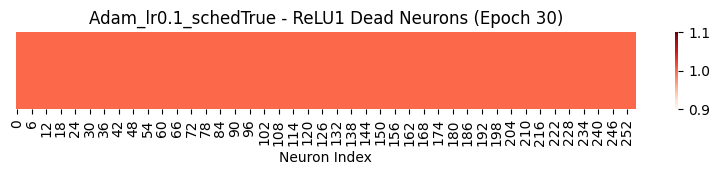

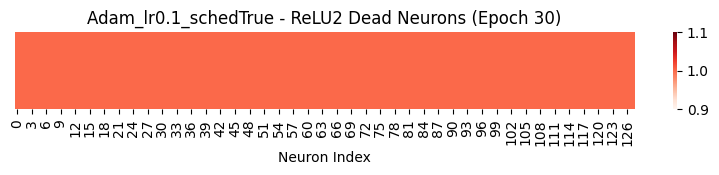

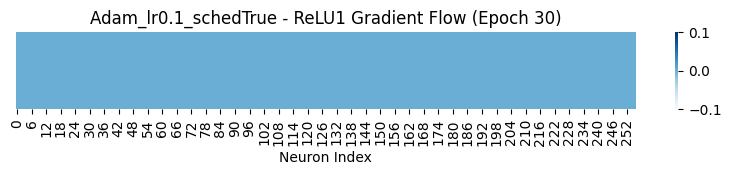

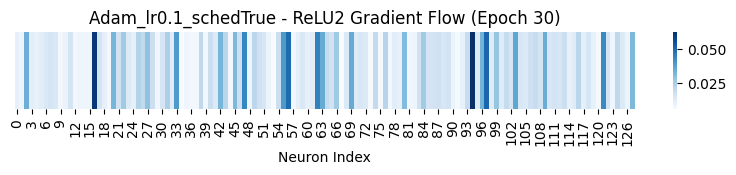


🔍 실험 시작: Adam_lr0.01_schedFalse
[Adam_lr0.01_schedFalse] Epoch 01 | Loss: 0.5248 | Acc: 80.80%

[Epoch 1] Activation & Gradient Visualization


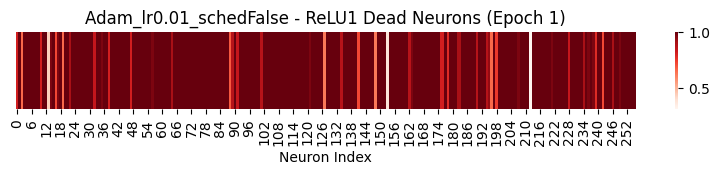

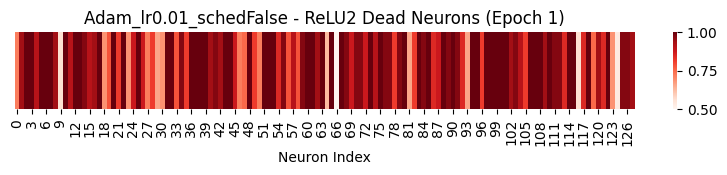

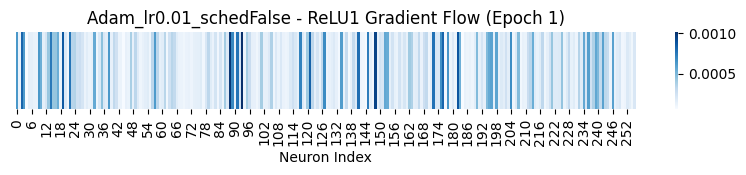

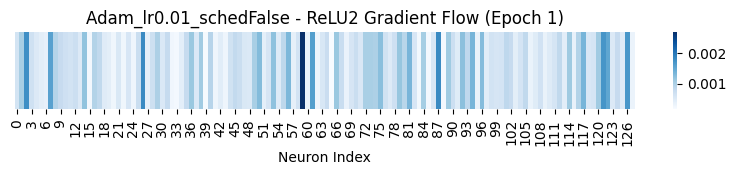

[Adam_lr0.01_schedFalse] Epoch 02 | Loss: 0.4171 | Acc: 85.11%
[Adam_lr0.01_schedFalse] Epoch 03 | Loss: 0.3891 | Acc: 85.94%
[Adam_lr0.01_schedFalse] Epoch 04 | Loss: 0.3696 | Acc: 86.63%
[Adam_lr0.01_schedFalse] Epoch 05 | Loss: 0.3619 | Acc: 86.87%
[Adam_lr0.01_schedFalse] Epoch 06 | Loss: 0.3495 | Acc: 87.21%
[Adam_lr0.01_schedFalse] Epoch 07 | Loss: 0.3451 | Acc: 87.55%
[Adam_lr0.01_schedFalse] Epoch 08 | Loss: 0.3351 | Acc: 87.81%
[Adam_lr0.01_schedFalse] Epoch 09 | Loss: 0.3307 | Acc: 87.91%
[Adam_lr0.01_schedFalse] Epoch 10 | Loss: 0.3250 | Acc: 88.17%
[Adam_lr0.01_schedFalse] Epoch 11 | Loss: 0.3212 | Acc: 88.43%
[Adam_lr0.01_schedFalse] Epoch 12 | Loss: 0.3182 | Acc: 88.47%
[Adam_lr0.01_schedFalse] Epoch 13 | Loss: 0.3162 | Acc: 88.43%
[Adam_lr0.01_schedFalse] Epoch 14 | Loss: 0.3129 | Acc: 88.61%
[Adam_lr0.01_schedFalse] Epoch 15 | Loss: 0.3123 | Acc: 88.61%

[Epoch 15] Activation & Gradient Visualization


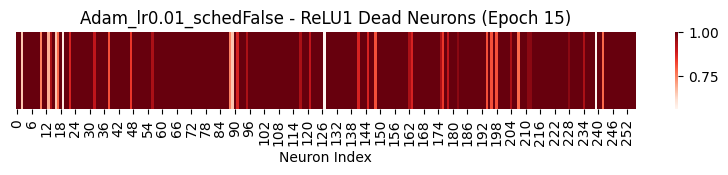

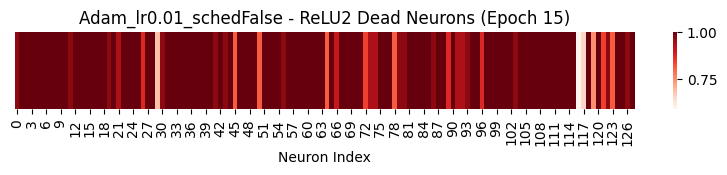

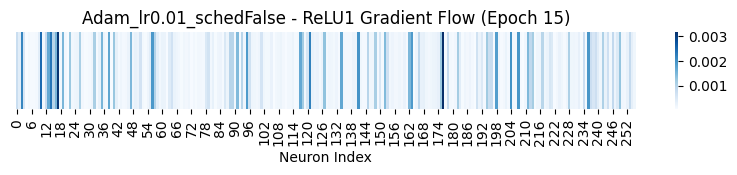

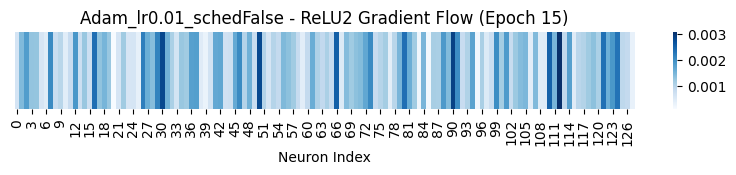

[Adam_lr0.01_schedFalse] Epoch 16 | Loss: 0.3107 | Acc: 88.68%
[Adam_lr0.01_schedFalse] Epoch 17 | Loss: 0.3085 | Acc: 88.88%
[Adam_lr0.01_schedFalse] Epoch 18 | Loss: 0.3052 | Acc: 89.11%
[Adam_lr0.01_schedFalse] Epoch 19 | Loss: 0.3052 | Acc: 89.06%
[Adam_lr0.01_schedFalse] Epoch 20 | Loss: 0.2954 | Acc: 89.24%
[Adam_lr0.01_schedFalse] Epoch 21 | Loss: 0.3004 | Acc: 89.15%
[Adam_lr0.01_schedFalse] Epoch 22 | Loss: 0.2978 | Acc: 89.29%
[Adam_lr0.01_schedFalse] Epoch 23 | Loss: 0.2907 | Acc: 89.59%
[Adam_lr0.01_schedFalse] Epoch 24 | Loss: 0.2951 | Acc: 89.47%
[Adam_lr0.01_schedFalse] Epoch 25 | Loss: 0.2976 | Acc: 89.18%
[Adam_lr0.01_schedFalse] Epoch 26 | Loss: 0.2874 | Acc: 89.55%
[Adam_lr0.01_schedFalse] Epoch 27 | Loss: 0.2924 | Acc: 89.61%
[Adam_lr0.01_schedFalse] Epoch 28 | Loss: 0.2892 | Acc: 89.55%
[Adam_lr0.01_schedFalse] Epoch 29 | Loss: 0.2808 | Acc: 89.73%
[Adam_lr0.01_schedFalse] Epoch 30 | Loss: 0.2926 | Acc: 89.64%

[Epoch 30] Activation & Gradient Visualization


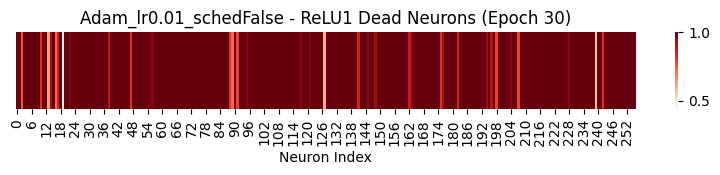

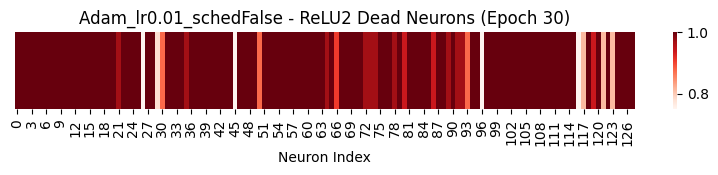

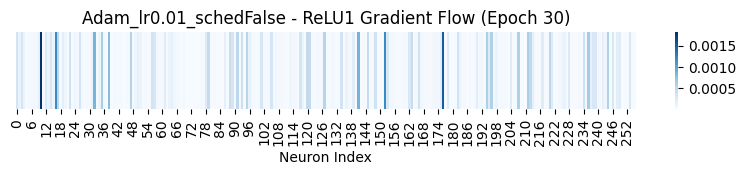

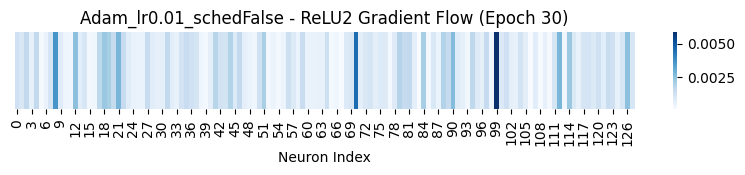


🔍 실험 시작: Adam_lr0.01_schedTrue
[Adam_lr0.01_schedTrue] Epoch 01 | Loss: 0.5264 | Acc: 80.92%

[Epoch 1] Activation & Gradient Visualization


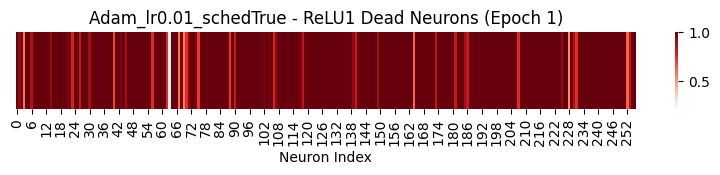

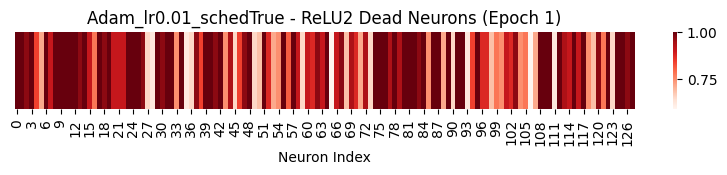

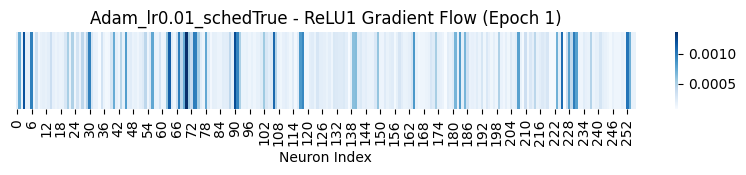

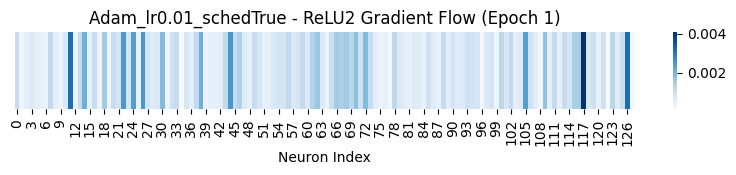

[Adam_lr0.01_schedTrue] Epoch 02 | Loss: 0.4048 | Acc: 85.29%
[Adam_lr0.01_schedTrue] Epoch 03 | Loss: 0.3740 | Acc: 86.56%
[Adam_lr0.01_schedTrue] Epoch 04 | Loss: 0.3453 | Acc: 87.45%
[Adam_lr0.01_schedTrue] Epoch 05 | Loss: 0.3258 | Acc: 88.07%
[Adam_lr0.01_schedTrue] Epoch 06 | Loss: 0.3161 | Acc: 88.42%
[Adam_lr0.01_schedTrue] Epoch 07 | Loss: 0.3020 | Acc: 88.89%
[Adam_lr0.01_schedTrue] Epoch 08 | Loss: 0.2895 | Acc: 89.43%
[Adam_lr0.01_schedTrue] Epoch 09 | Loss: 0.2772 | Acc: 89.68%
[Adam_lr0.01_schedTrue] Epoch 10 | Loss: 0.2690 | Acc: 90.02%
[Adam_lr0.01_schedTrue] Epoch 11 | Loss: 0.2580 | Acc: 90.41%
[Adam_lr0.01_schedTrue] Epoch 12 | Loss: 0.2507 | Acc: 90.63%
[Adam_lr0.01_schedTrue] Epoch 13 | Loss: 0.2417 | Acc: 91.03%
[Adam_lr0.01_schedTrue] Epoch 14 | Loss: 0.2360 | Acc: 91.17%
[Adam_lr0.01_schedTrue] Epoch 15 | Loss: 0.2272 | Acc: 91.50%

[Epoch 15] Activation & Gradient Visualization


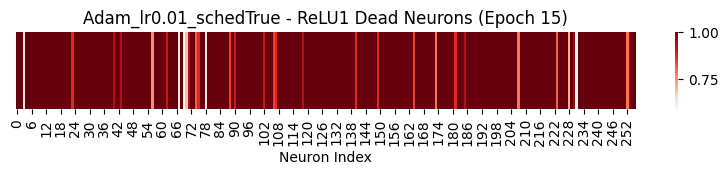

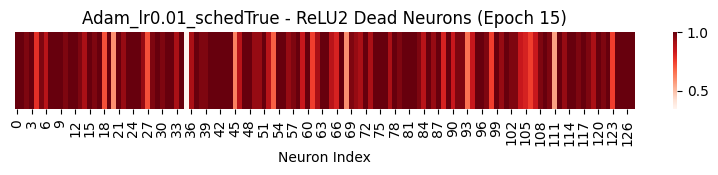

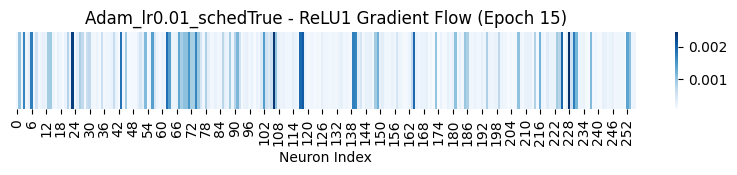

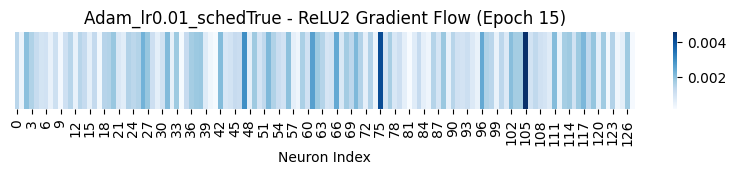

[Adam_lr0.01_schedTrue] Epoch 16 | Loss: 0.2221 | Acc: 91.69%
[Adam_lr0.01_schedTrue] Epoch 17 | Loss: 0.2167 | Acc: 91.81%
[Adam_lr0.01_schedTrue] Epoch 18 | Loss: 0.2112 | Acc: 92.08%
[Adam_lr0.01_schedTrue] Epoch 19 | Loss: 0.2059 | Acc: 92.29%
[Adam_lr0.01_schedTrue] Epoch 20 | Loss: 0.2013 | Acc: 92.48%
[Adam_lr0.01_schedTrue] Epoch 21 | Loss: 0.1954 | Acc: 92.58%
[Adam_lr0.01_schedTrue] Epoch 22 | Loss: 0.1927 | Acc: 92.74%
[Adam_lr0.01_schedTrue] Epoch 23 | Loss: 0.1892 | Acc: 92.91%
[Adam_lr0.01_schedTrue] Epoch 24 | Loss: 0.1863 | Acc: 92.96%
[Adam_lr0.01_schedTrue] Epoch 25 | Loss: 0.1828 | Acc: 93.10%
[Adam_lr0.01_schedTrue] Epoch 26 | Loss: 0.1798 | Acc: 93.12%
[Adam_lr0.01_schedTrue] Epoch 27 | Loss: 0.1773 | Acc: 93.26%
[Adam_lr0.01_schedTrue] Epoch 28 | Loss: 0.1749 | Acc: 93.35%
[Adam_lr0.01_schedTrue] Epoch 29 | Loss: 0.1728 | Acc: 93.46%
[Adam_lr0.01_schedTrue] Epoch 30 | Loss: 0.1708 | Acc: 93.49%

[Epoch 30] Activation & Gradient Visualization


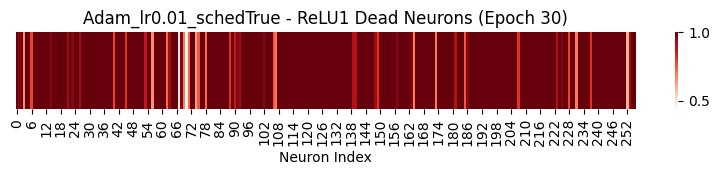

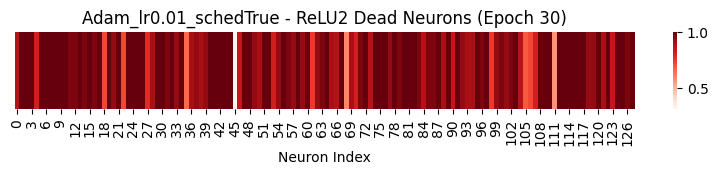

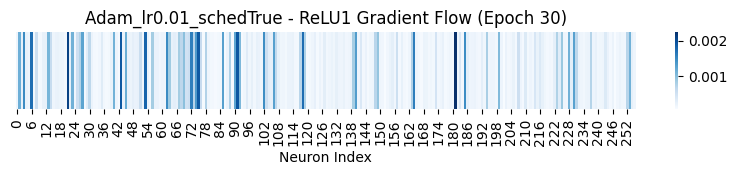

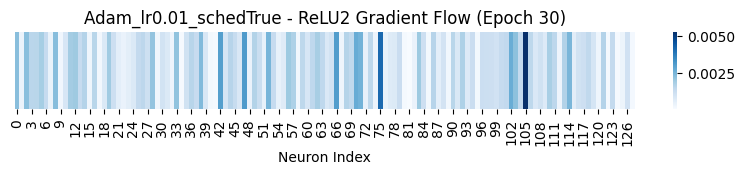


🔍 실험 시작: Adam_lr0.001_schedFalse
[Adam_lr0.001_schedFalse] Epoch 01 | Loss: 0.5253 | Acc: 81.15%

[Epoch 1] Activation & Gradient Visualization


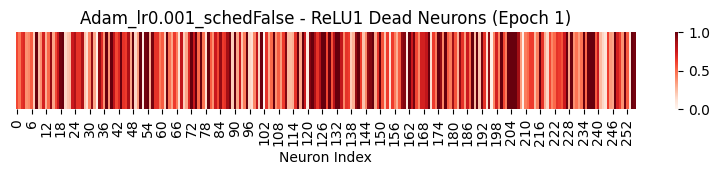

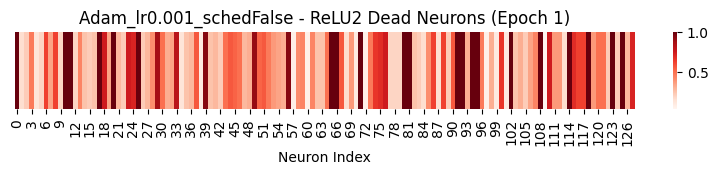

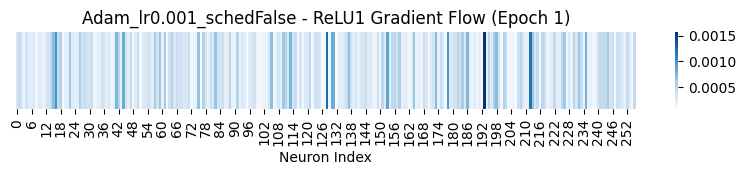

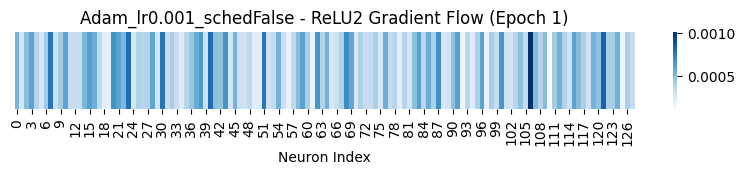

[Adam_lr0.001_schedFalse] Epoch 02 | Loss: 0.3691 | Acc: 86.51%
[Adam_lr0.001_schedFalse] Epoch 03 | Loss: 0.3307 | Acc: 87.85%
[Adam_lr0.001_schedFalse] Epoch 04 | Loss: 0.3073 | Acc: 88.67%
[Adam_lr0.001_schedFalse] Epoch 05 | Loss: 0.2873 | Acc: 89.34%
[Adam_lr0.001_schedFalse] Epoch 06 | Loss: 0.2729 | Acc: 89.71%
[Adam_lr0.001_schedFalse] Epoch 07 | Loss: 0.2607 | Acc: 90.23%
[Adam_lr0.001_schedFalse] Epoch 08 | Loss: 0.2490 | Acc: 90.75%
[Adam_lr0.001_schedFalse] Epoch 09 | Loss: 0.2377 | Acc: 90.98%
[Adam_lr0.001_schedFalse] Epoch 10 | Loss: 0.2294 | Acc: 91.33%
[Adam_lr0.001_schedFalse] Epoch 11 | Loss: 0.2201 | Acc: 91.65%
[Adam_lr0.001_schedFalse] Epoch 12 | Loss: 0.2134 | Acc: 91.94%
[Adam_lr0.001_schedFalse] Epoch 13 | Loss: 0.2017 | Acc: 92.28%
[Adam_lr0.001_schedFalse] Epoch 14 | Loss: 0.1971 | Acc: 92.45%
[Adam_lr0.001_schedFalse] Epoch 15 | Loss: 0.1899 | Acc: 92.78%

[Epoch 15] Activation & Gradient Visualization


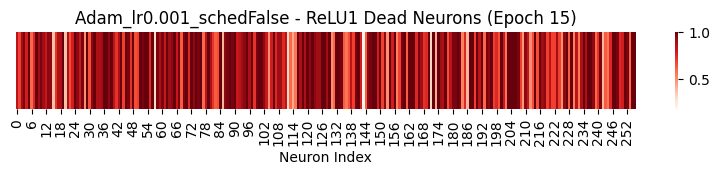

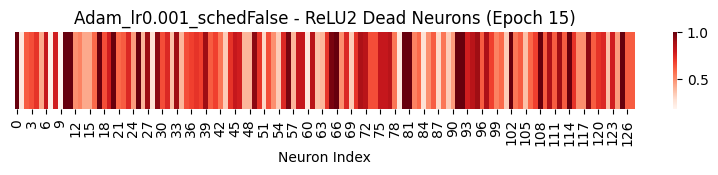

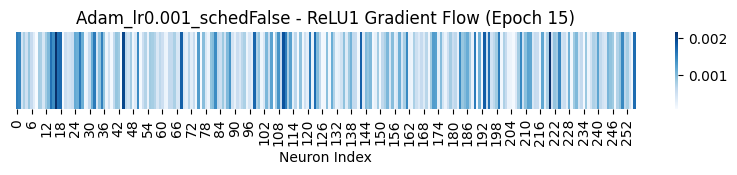

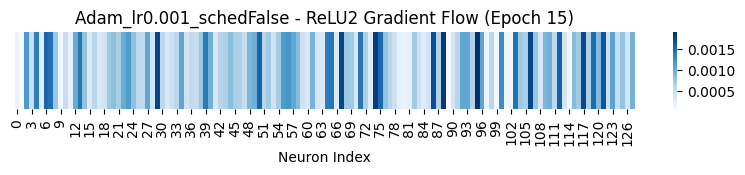

[Adam_lr0.001_schedFalse] Epoch 16 | Loss: 0.1825 | Acc: 93.07%
[Adam_lr0.001_schedFalse] Epoch 17 | Loss: 0.1753 | Acc: 93.27%
[Adam_lr0.001_schedFalse] Epoch 18 | Loss: 0.1723 | Acc: 93.49%
[Adam_lr0.001_schedFalse] Epoch 19 | Loss: 0.1644 | Acc: 93.69%
[Adam_lr0.001_schedFalse] Epoch 20 | Loss: 0.1600 | Acc: 93.91%
[Adam_lr0.001_schedFalse] Epoch 21 | Loss: 0.1548 | Acc: 93.98%
[Adam_lr0.001_schedFalse] Epoch 22 | Loss: 0.1512 | Acc: 94.19%
[Adam_lr0.001_schedFalse] Epoch 23 | Loss: 0.1452 | Acc: 94.48%
[Adam_lr0.001_schedFalse] Epoch 24 | Loss: 0.1409 | Acc: 94.60%
[Adam_lr0.001_schedFalse] Epoch 25 | Loss: 0.1378 | Acc: 94.73%
[Adam_lr0.001_schedFalse] Epoch 26 | Loss: 0.1327 | Acc: 94.80%
[Adam_lr0.001_schedFalse] Epoch 27 | Loss: 0.1281 | Acc: 95.09%
[Adam_lr0.001_schedFalse] Epoch 28 | Loss: 0.1265 | Acc: 95.10%
[Adam_lr0.001_schedFalse] Epoch 29 | Loss: 0.1237 | Acc: 95.22%
[Adam_lr0.001_schedFalse] Epoch 30 | Loss: 0.1214 | Acc: 95.29%

[Epoch 30] Activation & Gradient Visual

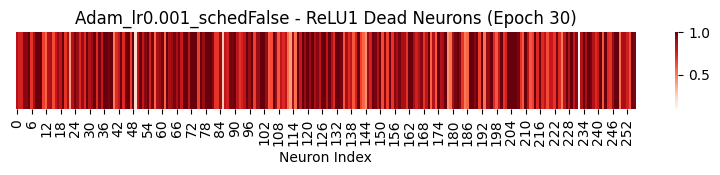

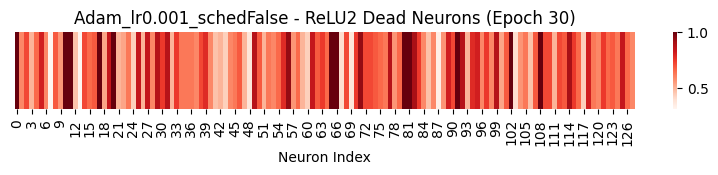

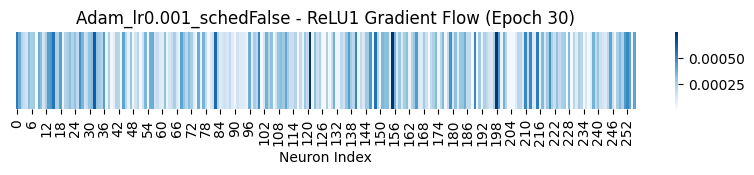

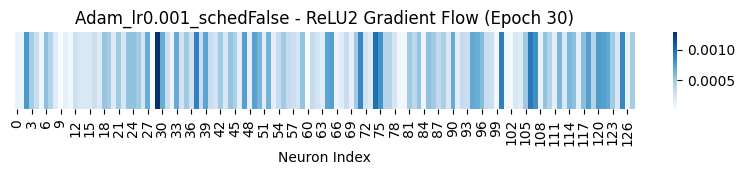


🔍 실험 시작: Adam_lr0.001_schedTrue
[Adam_lr0.001_schedTrue] Epoch 01 | Loss: 0.5238 | Acc: 81.34%

[Epoch 1] Activation & Gradient Visualization


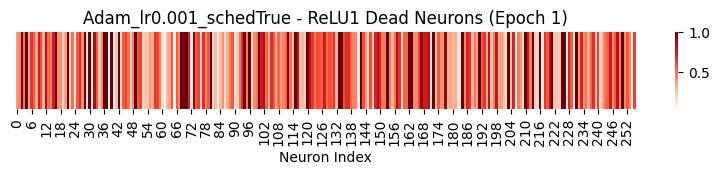

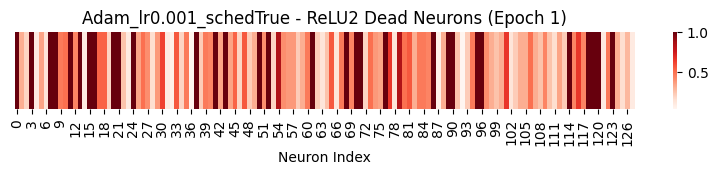

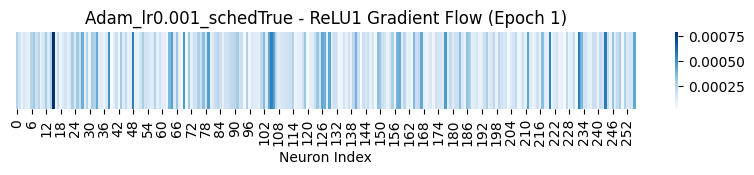

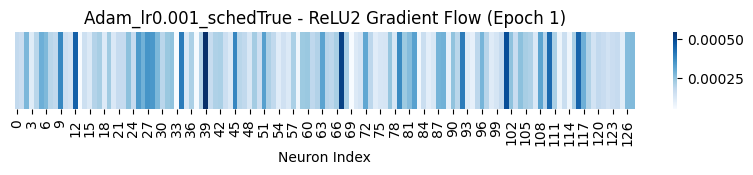

[Adam_lr0.001_schedTrue] Epoch 02 | Loss: 0.3678 | Acc: 86.69%
[Adam_lr0.001_schedTrue] Epoch 03 | Loss: 0.3282 | Acc: 87.91%
[Adam_lr0.001_schedTrue] Epoch 04 | Loss: 0.3023 | Acc: 88.92%
[Adam_lr0.001_schedTrue] Epoch 05 | Loss: 0.2828 | Acc: 89.45%
[Adam_lr0.001_schedTrue] Epoch 06 | Loss: 0.2668 | Acc: 90.15%
[Adam_lr0.001_schedTrue] Epoch 07 | Loss: 0.2510 | Acc: 90.62%
[Adam_lr0.001_schedTrue] Epoch 08 | Loss: 0.2368 | Acc: 91.07%
[Adam_lr0.001_schedTrue] Epoch 09 | Loss: 0.2253 | Acc: 91.50%
[Adam_lr0.001_schedTrue] Epoch 10 | Loss: 0.2127 | Acc: 92.03%
[Adam_lr0.001_schedTrue] Epoch 11 | Loss: 0.2050 | Acc: 92.35%
[Adam_lr0.001_schedTrue] Epoch 12 | Loss: 0.1929 | Acc: 92.81%
[Adam_lr0.001_schedTrue] Epoch 13 | Loss: 0.1846 | Acc: 93.09%
[Adam_lr0.001_schedTrue] Epoch 14 | Loss: 0.1764 | Acc: 93.49%
[Adam_lr0.001_schedTrue] Epoch 15 | Loss: 0.1681 | Acc: 93.71%

[Epoch 15] Activation & Gradient Visualization


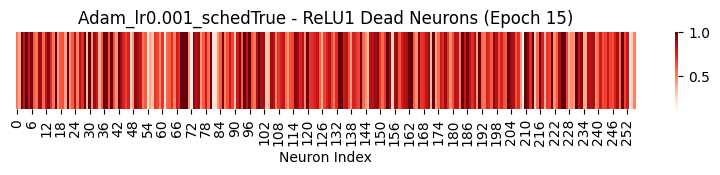

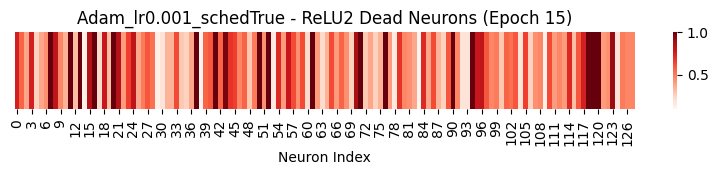

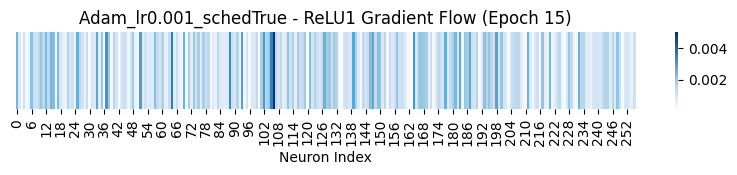

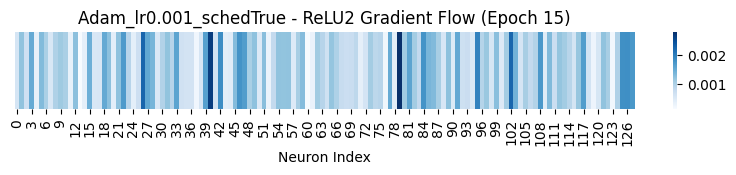

[Adam_lr0.001_schedTrue] Epoch 16 | Loss: 0.1613 | Acc: 94.02%
[Adam_lr0.001_schedTrue] Epoch 17 | Loss: 0.1541 | Acc: 94.36%
[Adam_lr0.001_schedTrue] Epoch 18 | Loss: 0.1496 | Acc: 94.51%
[Adam_lr0.001_schedTrue] Epoch 19 | Loss: 0.1438 | Acc: 94.72%
[Adam_lr0.001_schedTrue] Epoch 20 | Loss: 0.1395 | Acc: 94.82%
[Adam_lr0.001_schedTrue] Epoch 21 | Loss: 0.1347 | Acc: 95.14%
[Adam_lr0.001_schedTrue] Epoch 22 | Loss: 0.1309 | Acc: 95.23%
[Adam_lr0.001_schedTrue] Epoch 23 | Loss: 0.1269 | Acc: 95.42%
[Adam_lr0.001_schedTrue] Epoch 24 | Loss: 0.1239 | Acc: 95.58%
[Adam_lr0.001_schedTrue] Epoch 25 | Loss: 0.1203 | Acc: 95.62%
[Adam_lr0.001_schedTrue] Epoch 26 | Loss: 0.1179 | Acc: 95.76%
[Adam_lr0.001_schedTrue] Epoch 27 | Loss: 0.1152 | Acc: 95.86%
[Adam_lr0.001_schedTrue] Epoch 28 | Loss: 0.1128 | Acc: 95.97%
[Adam_lr0.001_schedTrue] Epoch 29 | Loss: 0.1107 | Acc: 96.09%
[Adam_lr0.001_schedTrue] Epoch 30 | Loss: 0.1089 | Acc: 96.14%

[Epoch 30] Activation & Gradient Visualization


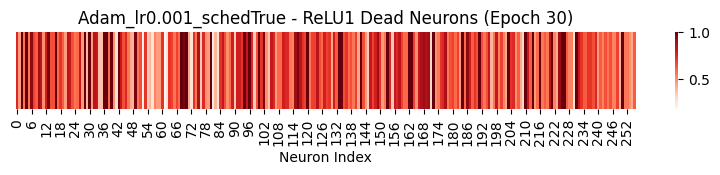

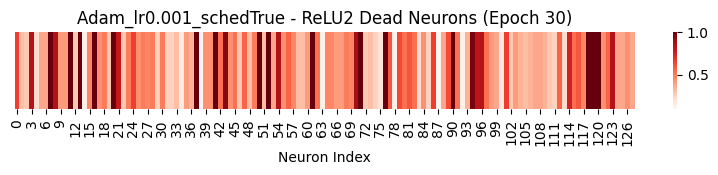

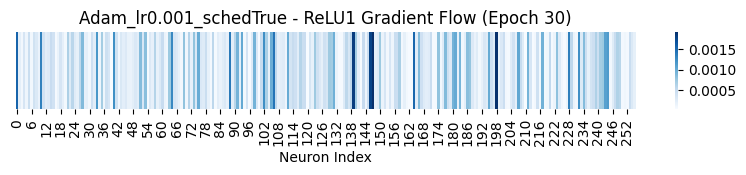

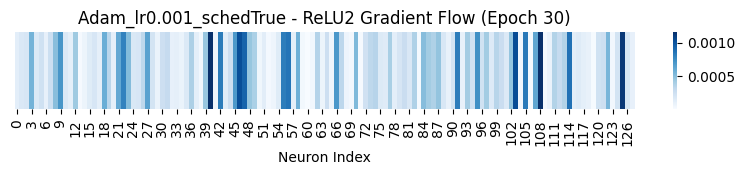

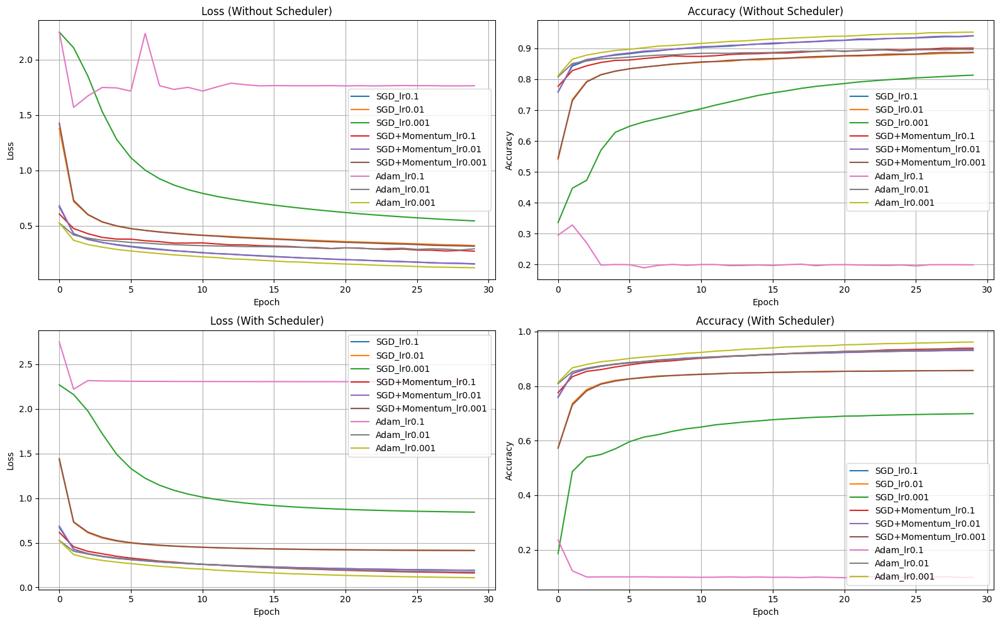

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from itertools import product

# 데이터셋 로딩
transform = transforms.ToTensor()
train_dataset = datasets.FashionMNIST(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

# 옵티마이저 구성
optimizers = {
    "SGD": lambda params, lr: optim.SGD(params, lr=lr),
    "SGD+Momentum": lambda params, lr: optim.SGD(params, lr=lr, momentum=0.9),
    "Adam": lambda params, lr: optim.Adam(params, lr=lr)
}
learning_rates = [0.1, 0.01, 0.001]

# 결과 저장 및 실험 루프
results = {}
for opt_name, lr, use_sched in product(optimizers.keys(), learning_rates, [False, True]):
    label = f"{opt_name}_lr{lr}_sched{use_sched}"
    print(f"\n 실험 시작: {label}")
    model = get_model()
    register_hooks(model)
    optimizer = optimizers[opt_name](model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9) if use_sched else None
    loss_fn = nn.CrossEntropyLoss()
    train_loss, train_acc = train_with_viz(model, loss_fn, optimizer, train_loader, scheduler=scheduler, label=label)
    results[label] = {"loss": train_loss, "acc": train_acc}

# 결과 시각화
plot_loss_accuracy(results)
